## Task 1 - Importing Necessary Modules

In [111]:
#Importing the necessary libraraies for data analysis and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

##Task 2 - Importing the dataset

In [112]:
#Reading the file
app_data = pd.read_csv('/content/drive/MyDrive/Project - CreditRisk(EDA)/application_data.csv')

##Task 3 - Exploring the dataset

In [113]:
#Exploring the first few rows of the dataset
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [114]:
#Getting the dimensions of the datasets
app_data.shape

(307511, 122)

In [115]:
# Getting consice summary information about the DataFrame, including column datatypes and non-null counts
app_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [116]:
app_data.iloc[ : , 0:100 ].info() # display info() of 1st 99 columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 100 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nu

In [117]:
app_data.iloc[ : , 100:122 ].info() # display info() of rest of the columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 22 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   FLAG_DOCUMENT_6             307511 non-null  int64  
 1   FLAG_DOCUMENT_7             307511 non-null  int64  
 2   FLAG_DOCUMENT_8             307511 non-null  int64  
 3   FLAG_DOCUMENT_9             307511 non-null  int64  
 4   FLAG_DOCUMENT_10            307511 non-null  int64  
 5   FLAG_DOCUMENT_11            307511 non-null  int64  
 6   FLAG_DOCUMENT_12            307511 non-null  int64  
 7   FLAG_DOCUMENT_13            307511 non-null  int64  
 8   FLAG_DOCUMENT_14            307511 non-null  int64  
 9   FLAG_DOCUMENT_15            307511 non-null  int64  
 10  FLAG_DOCUMENT_16            307511 non-null  int64  
 11  FLAG_DOCUMENT_17            307511 non-null  int64  
 12  FLAG_DOCUMENT_18            307511 non-null  int64  
 13  FLAG_DOCUMENT_

##Task 4 - Missing Value Analysis

In [118]:
# Checking the missing values using null method
app_data.isnull().sum().sort_values(ascending = False)

,0
COMMONAREA_MEDI,214865
COMMONAREA_AVG,214865
COMMONAREA_MODE,214865
NONLIVINGAPARTMENTS_MODE,213514
NONLIVINGAPARTMENTS_AVG,213514
...,...
NAME_HOUSING_TYPE,0
NAME_FAMILY_STATUS,0
NAME_EDUCATION_TYPE,0
NAME_INCOME_TYPE,0


In [119]:
#Getting the percentage of the missing values for more readability
missing_values = app_data.count() / len(app_data)
missing_values = (1.00 - missing_values) * 100
missing_values.sort_values(ascending = False)

,0
COMMONAREA_MEDI,69.872297
COMMONAREA_AVG,69.872297
COMMONAREA_MODE,69.872297
NONLIVINGAPARTMENTS_MODE,69.432963
NONLIVINGAPARTMENTS_AVG,69.432963
...,...
NAME_HOUSING_TYPE,0.000000
NAME_FAMILY_STATUS,0.000000
NAME_EDUCATION_TYPE,0.000000
NAME_INCOME_TYPE,0.000000


###Missing Value Treatment


As we can observe, there are lot of columns with missing values. There are some columns which has missing values around or more than 50%. Other columns has significantly less missing value. Also, the columns for which missing values are around or more than 50% are mostly either mean, median or mode. So, there is no way one can replace these missing data. So, we will not consider these columns for analysis. We will consider other columns for analysis. Let's analyse the other columns.

####Removing the columns with more than 50% missing values

In [120]:
# Filter the DataFrame "application_data" to include only columns with less than 50% missing values
new_data = app_data.loc[:, missing_values < 50]
new_data.shape

(307511, 81)

In [121]:
# Calculating the proportion of non-missing values for each column
missing_values_2 = new_data.count() / len(new_data)

# Converting the proportions to percentages and calculating the percentage of missing values for each column
missing_values_2 = (1 - missing_values_2) * 100

# Sorting the missing percentages in descending order
missing_values_2[missing_values_2 > 0].sort_values(ascending=False)

,0
FLOORSMAX_AVG,49.760822
FLOORSMAX_MODE,49.760822
FLOORSMAX_MEDI,49.760822
YEARS_BEGINEXPLUATATION_AVG,48.781019
YEARS_BEGINEXPLUATATION_MODE,48.781019
YEARS_BEGINEXPLUATATION_MEDI,48.781019
TOTALAREA_MODE,48.268517
EMERGENCYSTATE_MODE,47.398304
OCCUPATION_TYPE,31.345545
EXT_SOURCE_3,19.825307


In [122]:
#All the columns with less than 50% of and above the OCCUPATION_TYPE of data are to be handled with either mean or median, depending on the distribution.
# Identifying columns with missing values between 32% and 50%
columns_to_impute = missing_values_2[(missing_values_2 >= 32) & (missing_values_2 < 50)].index

# Checking the distribution of these columns to decide between mean or median imputation
distribution_info = {}

for column in columns_to_impute:
    distribution_info[column] = new_data[column].describe()

# Displaying the summary statistics for these columns to analyze their distributions
distribution_info


{'YEARS_BEGINEXPLUATATION_AVG': count    157504.000000
 mean          0.977735
 std           0.059223
 min           0.000000
 25%           0.976700
 50%           0.981600
 75%           0.986600
 max           1.000000
 Name: YEARS_BEGINEXPLUATATION_AVG, dtype: float64,
 'FLOORSMAX_AVG': count    154491.000000
 mean          0.226282
 std           0.144641
 min           0.000000
 25%           0.166700
 50%           0.166700
 75%           0.333300
 max           1.000000
 Name: FLOORSMAX_AVG, dtype: float64,
 'YEARS_BEGINEXPLUATATION_MODE': count    157504.000000
 mean          0.977065
 std           0.064575
 min           0.000000
 25%           0.976700
 50%           0.981600
 75%           0.986600
 max           1.000000
 Name: YEARS_BEGINEXPLUATATION_MODE, dtype: float64,
 'FLOORSMAX_MODE': count    154491.000000
 mean          0.222315
 std           0.143709
 min           0.000000
 25%           0.166700
 50%           0.166700
 75%           0.333300
 max           

Here’s an overview of the columns with missing values between 32% and 50% along with their distributions:

1. FLOORSMAX_MEDI, FLOORSMAX_AVG, FLOORSMAX_MODE:
- Distribution seems skewed, with medianvalues at 0.1667 and max values at 1.
- Imputation method: Median.

2. YEARS_BEGINEXPLUATATION_AVG,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_MODE:
- These columns have small standard deviations and are mostly clustered around their mean.
- Imputation method: Mean.

3. TOTALAREA_MODE:
- Appears to have a skewed distribution.
- Imputation method: Median.

4. EMERGENCYSTATE_MODE:
- A categorical column with "No" as the most frequent value.
- Imputation method: Mode.

In [123]:
# Imputing missing values based on distribution analysis

# Imputing numeric columns (skewed) with median
for column in ['FLOORSMAX_MEDI', 'FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'TOTALAREA_MODE']:
    new_data[column].fillna(new_data[column].median(), inplace=True)

# Imputing numeric columns (normal) with mean
for column in ['YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BEGINEXPLUATATION_MODE']:
    new_data[column].fillna(new_data[column].mean(), inplace=True)

# Imputing categorical columns with mode
new_data['EMERGENCYSTATE_MODE'].fillna(new_data['EMERGENCYSTATE_MODE'].mode()[0], inplace=True)

# Checking if all missing values in these columns are handled
missing_values_after_imputation = new_data[columns_to_impute].isnull().sum()

missing_values_after_imputation

,0
YEARS_BEGINEXPLUATATION_AVG,0
FLOORSMAX_AVG,0
YEARS_BEGINEXPLUATATION_MODE,0
FLOORSMAX_MODE,0
YEARS_BEGINEXPLUATATION_MEDI,0
FLOORSMAX_MEDI,0
TOTALAREA_MODE,0
EMERGENCYSTATE_MODE,0


In [124]:
#now checking the missing values columns in new data again
new_data.isnull().sum().sort_values(ascending = False)

,0
OCCUPATION_TYPE,96391
EXT_SOURCE_3,60965
AMT_REQ_CREDIT_BUREAU_YEAR,41519
AMT_REQ_CREDIT_BUREAU_QRT,41519
AMT_REQ_CREDIT_BUREAU_MON,41519
...,...
YEARS_BEGINEXPLUATATION_AVG,0
FLOORSMAX_AVG,0
YEARS_BEGINEXPLUATATION_MODE,0
FLOORSMAX_MODE,0


###Now we proceed for further cleaning of the data and start with the OCCUPATION_TYPE column

The OCCUPATION_TYPE column has a large amount of missing data, about 31%. Although this might suggest removing the column, when we look at it closely, it seems to be an important piece of information. So, we've chosen to keep the column and not analyze it further.

In [125]:
app_data['OCCUPATION_TYPE'].value_counts()

,count
OCCUPATION_TYPE,
Laborers,55186
Sales staff,32102
Core staff,27570
Managers,21371
Drivers,18603
High skill tech staff,11380
Accountants,9813
Medicine staff,8537
Security staff,6721


In [126]:
#Displaying the first few rows of the column OCCUPATION_TYPE in dataframe "new_data"
new_data['OCCUPATION_TYPE'].head()

,OCCUPATION_TYPE
0,Laborers
1,Core staff
2,Laborers
3,Laborers
4,Core staff


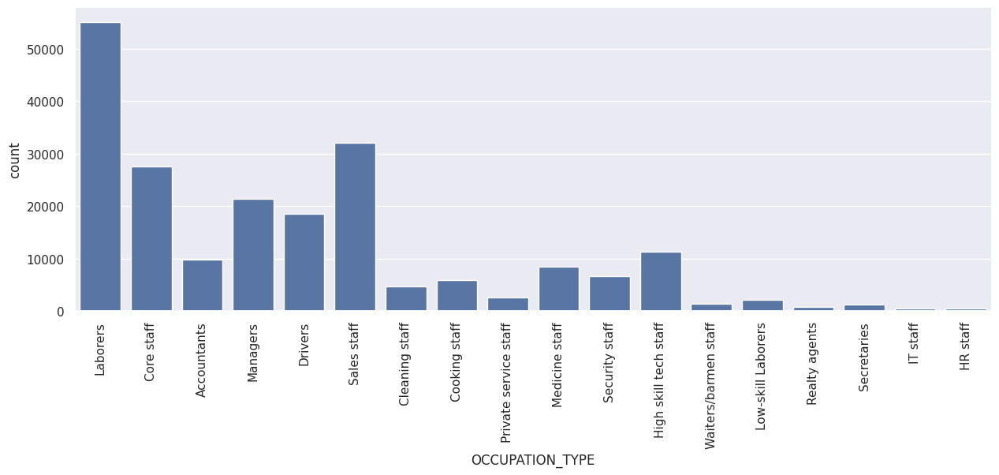

In [127]:
sns.countplot(x='OCCUPATION_TYPE', data = new_data)
plt.xticks(rotation=90)
plt.show()

This column exhibits a significant proportion of missing values, amounting to 31%. Given that it is a categorical column, the only viable substitution for missing data is with the mode value. However, substituting all these missing values with the "Laborers" category wouldn't be appropriate. Therefore, we've decided not to perform any missing value treatment on this column and leave it as is.

Note: Filling the missing values in the "OCCUPATION_TYPE" column by a new category named "Unknown"

In [128]:
#Filling the missing values in the "OCCUPATION_TYPE" column by new category named "Unknown"
new_data['OCCUPATION_TYPE'].fillna('Unknown', inplace=True)

In [129]:
#now checking the missing values columns in new data again
new_data.isnull().sum().sort_values(ascending = False)

,0
EXT_SOURCE_3,60965
AMT_REQ_CREDIT_BUREAU_YEAR,41519
AMT_REQ_CREDIT_BUREAU_QRT,41519
AMT_REQ_CREDIT_BUREAU_MON,41519
AMT_REQ_CREDIT_BUREAU_WEEK,41519
...,...
YEARS_BEGINEXPLUATATION_AVG,0
FLOORSMAX_AVG,0
YEARS_BEGINEXPLUATATION_MODE,0
FLOORSMAX_MODE,0


###Now going for column "EXT_SOURCE_3"

In [130]:
# Displaying the first 10 rows of the 'EXT_SOURCE_3' column in the DataFrame 'new_data'
new_data['EXT_SOURCE_3'].head(10)

,EXT_SOURCE_3
0,0.139376
1,NaN
2,0.729567
3,NaN
4,NaN
5,0.621226
6,0.492060
7,0.540654
8,0.751724
9,NaN


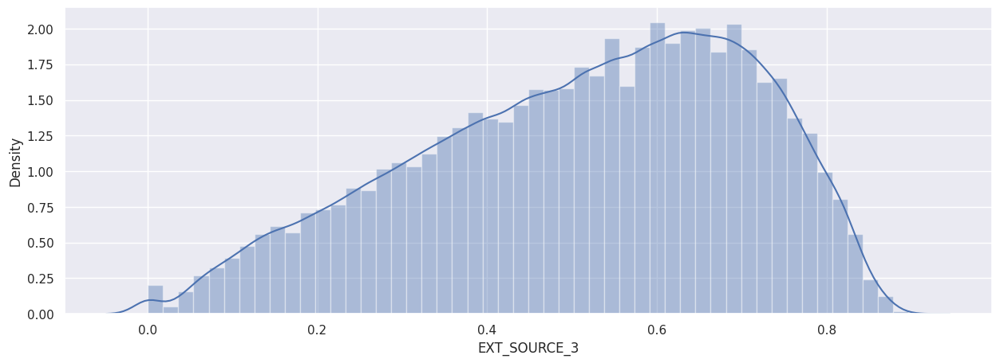

In [131]:
# Plotting the distribution
sns.distplot(new_data['EXT_SOURCE_3'])
plt.show()

In [132]:
#Now calculating the mean, mode and skew of the column "EXT_SOURCE_3" in dataframe "new_data"
a_mean = new_data['EXT_SOURCE_3'].mean()
b_mode = new_data['EXT_SOURCE_3'].mode()
c_skew = new_data['EXT_SOURCE_3'].skew()

print("Mean: ", a_mean)
print("Mode: ", b_mode)
print("Skew: ", c_skew)

Mean:  0.5108529061799658
Mode:  0    0.7463
Name: EXT_SOURCE_3, dtype: float64
Skew:  -0.4093904596160267


This data is a skewed normal distribution so we fill in the data with median

In [133]:
new_data['EXT_SOURCE_3'].fillna(new_data['EXT_SOURCE_3'].median(), inplace=True)

In [134]:
new_data.isnull().sum().sort_values(ascending = False)

,0
AMT_REQ_CREDIT_BUREAU_YEAR,41519
AMT_REQ_CREDIT_BUREAU_QRT,41519
AMT_REQ_CREDIT_BUREAU_MON,41519
AMT_REQ_CREDIT_BUREAU_WEEK,41519
AMT_REQ_CREDIT_BUREAU_DAY,41519
...,...
EXT_SOURCE_3,0
YEARS_BEGINEXPLUATATION_AVG,0
FLOORSMAX_AVG,0
YEARS_BEGINEXPLUATATION_MODE,0


The AMT_REQ_CREDIT_BUREAU columns represent different time periods (hour, day, week, month, quarter, year) of credit inquiries. Since they have a considerable number of missing values, we can handle these by imputing missing values based on the distribution of each column.

Next steps:
1. Analyze the distribution of each of these columns.
2. Impute the missing values

In [135]:
# List of AMT_REQ_CREDIT_BUREAU columns to analyze
amt_req_columns = [
    'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
    'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
    'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'
]

# Getting summary statistics for these columns to analyze their distributions
amt_req_summary = new_data[amt_req_columns].describe()

# Displaying the summary statistics
amt_req_summary


,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,0.006402,0.007000,0.034362,0.267395,0.265474,1.899974
std,0.083849,0.110757,0.204685,0.916002,0.794056,1.869295
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


Here is the summary of the AMT_REQ_CREDIT_BUREAU columns:

1.AMT_REQ_CREDIT_BUREAU_HOUR, DAY, WEEK:
- Median (50th percentile) is 0, with a max value of 3 (hour), 9 (day), and 8 (week).
- The data is highly skewed, with most values clustered at 0.
- Imputation method: Mode.

2.AMT_REQ_CREDIT_BUREAU_MON:
- Median is 0, and the max is 24, indicating a skewed distribution.
- Imputation method: Mode.

3.AMT_REQ_CREDIT_BUREAU_QRT, YEAR:
- Median values of 0 and 1 respectively, with a skew toward lower values.
- Imputation method: Mode.

Let us proceed to impute the missing values in these columns using the median.

Note : I am using Mode instead of median because values are either 0 or 1 mostly and 0 is exceedingly large so i have decided going with mode

In [136]:
# Imputing missing values for AMT_REQ_CREDIT_BUREAU columns using median
for column in amt_req_columns:
    new_data[column].fillna(new_data[column].mode()[0], inplace=True)

# Checking if missing values have been imputed successfully for these columns
missing_values_after_imputation = new_data[amt_req_columns].isnull().sum()

missing_values_after_imputation

,0
AMT_REQ_CREDIT_BUREAU_HOUR,0
AMT_REQ_CREDIT_BUREAU_DAY,0
AMT_REQ_CREDIT_BUREAU_WEEK,0
AMT_REQ_CREDIT_BUREAU_MON,0
AMT_REQ_CREDIT_BUREAU_QRT,0
AMT_REQ_CREDIT_BUREAU_YEAR,0


In [137]:
# Get the names of all columns in the DataFrame 'new_data'
new_data.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'YEARS_BEGINEXPLUATATION_AVG',

####Column: 'DAYS_BIRTH'

This column represents the client's age in days relative to the application date, displayed as negative values. For clarity and ease of understanding, we are converting these values into years. We use the -round() function to transform the negative values into positive ones. We plan to apply the same transformation method to other date-related data.

In [138]:
# Displaying the first few rows of the "DAYS_BIRTH" column in the dataframe "new_data"
new_data['DAYS_BIRTH'].head()

,DAYS_BIRTH
0,-9461
1,-16765
2,-19046
3,-19005
4,-19932


In [139]:
# Converting the values in "DAYS_BIRTH" column from days to years and display the first few rows
new_data['DAYS_BIRTH'] = round(-new_data['DAYS_BIRTH'] / 365)
new_data['DAYS_BIRTH'].head()

,DAYS_BIRTH
0,26.0
1,46.0
2,52.0
3,52.0
4,55.0


In [140]:
# Convert the values in the 'DAYS_REGISTRATION' column from days to years and display the first few rows
new_data['DAYS_REGISTRATION'] = -round(new_data['DAYS_REGISTRATION'] / 365, 0)
new_data['DAYS_REGISTRATION'].head()

,DAYS_REGISTRATION
0,10.0
1,3.0
2,12.0
3,27.0
4,12.0


###Target

####Total Users

In [141]:
# Counting the number of non-null values in the 'TARGET' column of the DataFrame 'new_data'
new_data['TARGET'].count()

307511

In [142]:
new_data['TARGET'].value_counts()

,count
TARGET,
0,282686
1,24825


####Client with payment difficulties

In [143]:
# Counting the number of records where the value in the 'TARGET' column is equal to 1
(new_data['TARGET'] ==1).sum()

24825

####Other Clients

In [144]:
# Counting the number of records where the value in the 'TARGET' column is equal to 0
(new_data['TARGET'] ==0).sum()

282686

####Ratio

In [145]:
# Calculating the ratio of records with 'TARGET' value equal to 0 to records with 'TARGET' value equal to 1
(new_data['TARGET'] ==0).sum() / (new_data['TARGET'] ==1).sum()

11.387150050352467

Too much Data Imbalance.

##Task 5 - Analysing Categorical and Numerical data.


####Analysing categorical data

Due to data imbalance, we will separate out the new_data with a target equal to 0 and new_data with a target equal to 1. And we will analyse them individually and try to find any relationship if it exists.

In [146]:
# Create a subset of the DataFrame 'new_data' containing records where 'TARGET' column is equal to 0
new_data_0 = new_data.loc[new_data['TARGET'] == 0]

# Create a subset of the DataFrame 'new_data' containing records where 'TARGET' column is equal to 1
new_data_1 = new_data.loc[new_data['TARGET'] == 1]

####We utilized three distinct plots for analysis:

**Pie plot:**
- This displays all the values present in a column as percentages, where the sum of these percentages equals 100.

**Countplot:**
- Here, we depicted the count of different categories. Consequently, Target=0 will typically have a higher count than Target=1.

**Barplot:**
- To create this plot, we initially divided the dataset into two subsets based on the target variable: Target=0 and Target=1. Next, we further subdivided each subset into different categories. We then plotted these categories as percentages. Notably, you'll observe that the values for Target=0 and Target=1 are mostly equal. For a deeper understanding, please refer to the code of this plot.

In [147]:
def plotting(new_data, new_data0, new_data1, column):
    """
    Plots three types of visualizations for a given column in the dataset:
    a pie chart of overall distribution, a countplot by category, and a bar plot of percentage distribution by target variable.

    Parameters:
    - new_data0: DataFrame containing the entire dataset.
    - new_data0: DataFrame filtered by the target variable with value 0.
    - new_data1: DataFrame filtered by the target variable with value 1.
    - column: The name of the column to be visualized.
    """

    # Assigning dataframes to local variables (This step might be redundant as we can directly use the function arguments)
    new_data = new_data
    new_data_0 = new_data0
    new_data_1 = new_data1
    col = column

    # Initialize figure with a specific size
    fig = plt.figure(figsize=(13,10))

    # Create a subplot for the pie chart
    ax1 = plt.subplot(221)
    # Plotting pie chart for overall distribution of the column
    new_data[col].value_counts().plot.pie(autopct="%1.0f%%", ax=ax1)
    plt.title('Plotting data for the column: ' + column)

    # Create a subplot for the countplot
    ax2 = plt.subplot(222)
    # Plotting count plot by category with hue as TARGET
    sns.countplot(x=column, hue='TARGET', data=new_data, ax=ax2)
    plt.xticks(rotation=90)
    plt.title('Plotting data for target in terms of total count')

    # Create a subplot for the bar plot
    ax3 = plt.subplot(223)
    # Preparing data for percentage distribution by target variable
    df = pd.DataFrame()
    df['0'] = ((new_data_0[col].value_counts())/len(new_data_0))
    df['1'] = ((new_data_1[col].value_counts())/len(new_data_1))
    # Plotting bar plot for percentage distribution
    df.plot.bar(ax=ax3)
    plt.title('Plotting data for target in terms of percentage')

    # Adjust layout to prevent overlap
    fig.tight_layout()

    # Display the plots
    plt.show()

In [148]:
# Create a list to get all the Categorical columns
new_data_categorical = new_data.select_dtypes(include=['object']).columns.tolist()
new_data_categorical

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'EMERGENCYSTATE_MODE']

In [149]:
len(new_data_categorical)

13

## Task - Univariate Analysis of the Categorical data


In [150]:
new_data.TARGET.dtype

dtype('int64')

In [151]:
# Converting 'TARGET' to s string data type for categorical processing
new_data['TARGET'] = new_data['TARGET'].astype(str)

# Changing 'NAME_CONTRACT_TYPE' to a categorical type for optimized storage and plotting.
new_data['NAME_CONTRACT_TYPE'] = new_data['NAME_CONTRACT_TYPE'].astype('category')

In [152]:
new_data.dtypes

,0
SK_ID_CURR,int64
TARGET,object
NAME_CONTRACT_TYPE,category
CODE_GENDER,object
FLAG_OWN_CAR,object
...,...
AMT_REQ_CREDIT_BUREAU_DAY,float64
AMT_REQ_CREDIT_BUREAU_WEEK,float64
AMT_REQ_CREDIT_BUREAU_MON,float64
AMT_REQ_CREDIT_BUREAU_QRT,float64


In [153]:
new_data_categorical

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'EMERGENCYSTATE_MODE']

Plotting  NAME_CONTRACT_TYPE


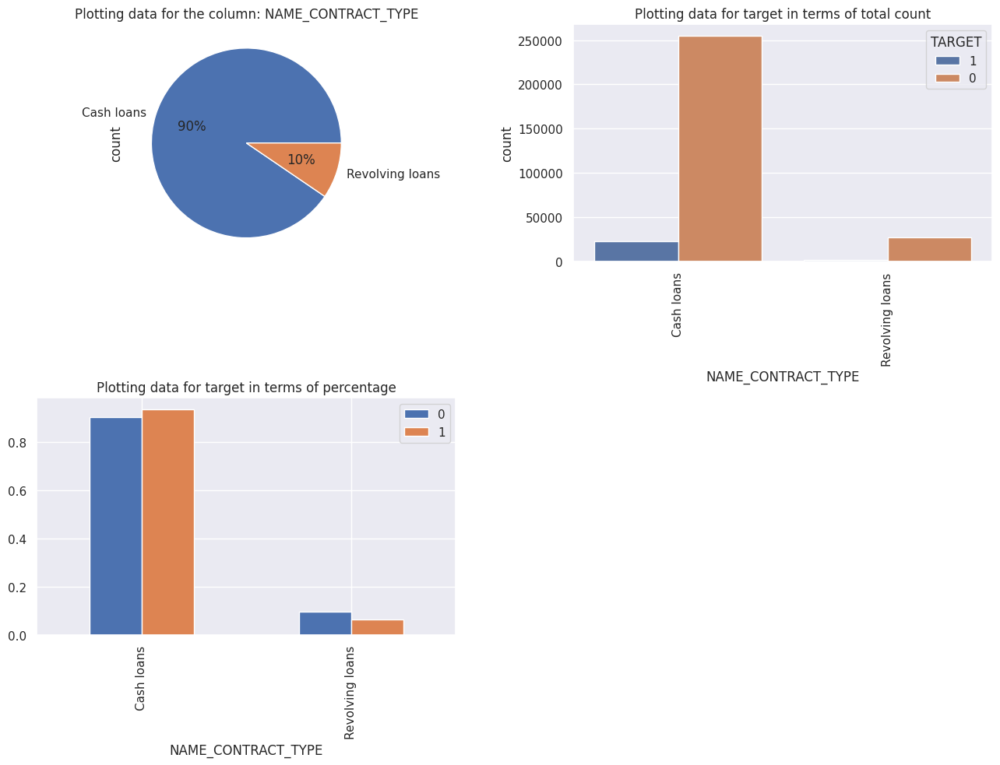

Plotting  CODE_GENDER


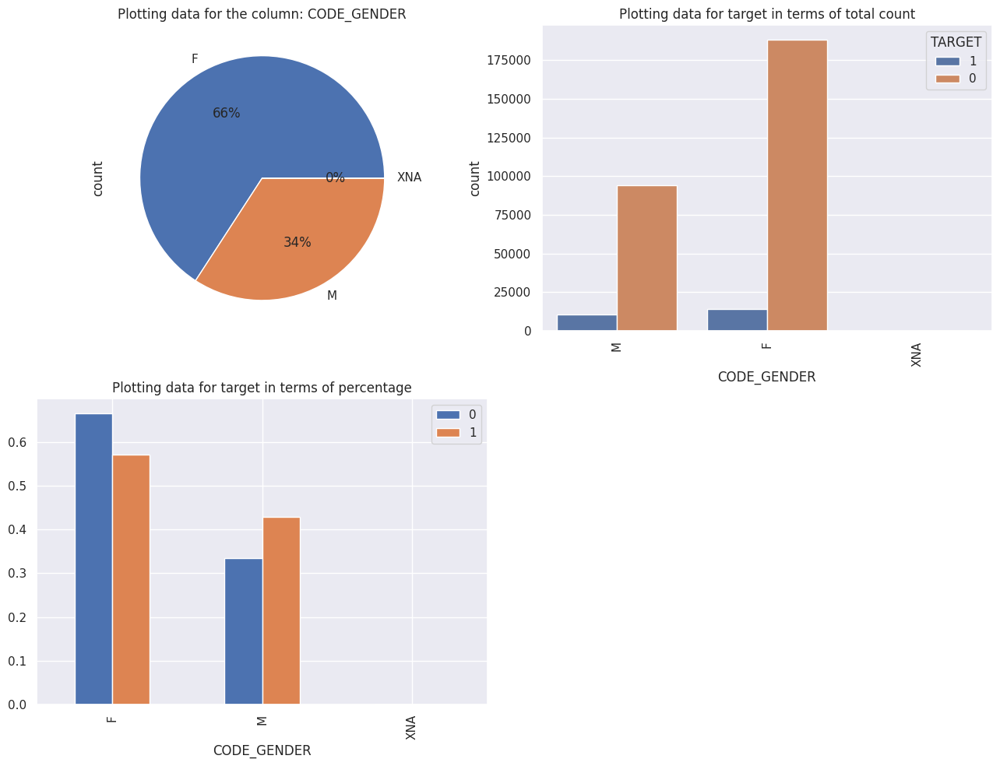

Plotting  FLAG_OWN_CAR


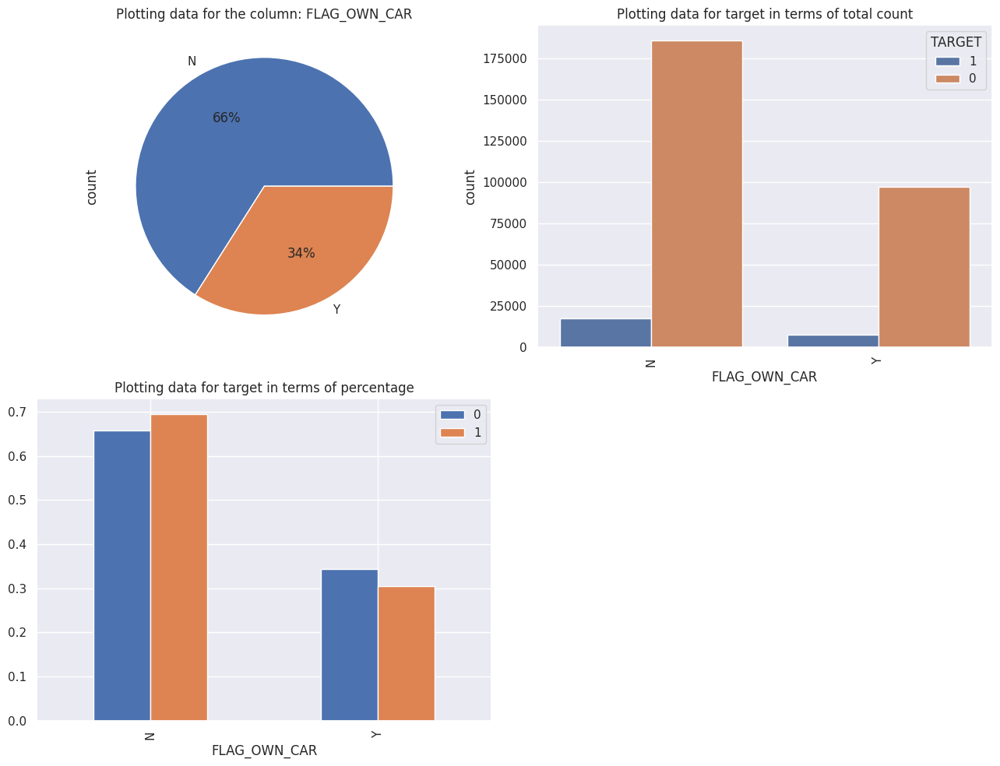

Plotting  FLAG_OWN_REALTY


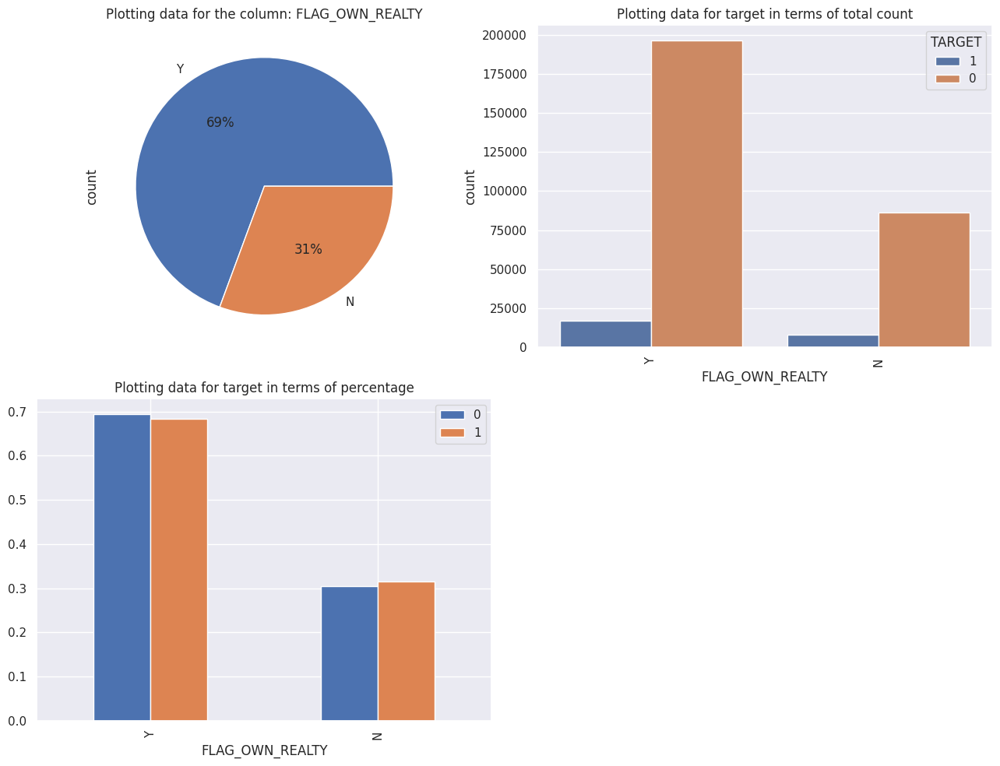

Plotting  NAME_TYPE_SUITE


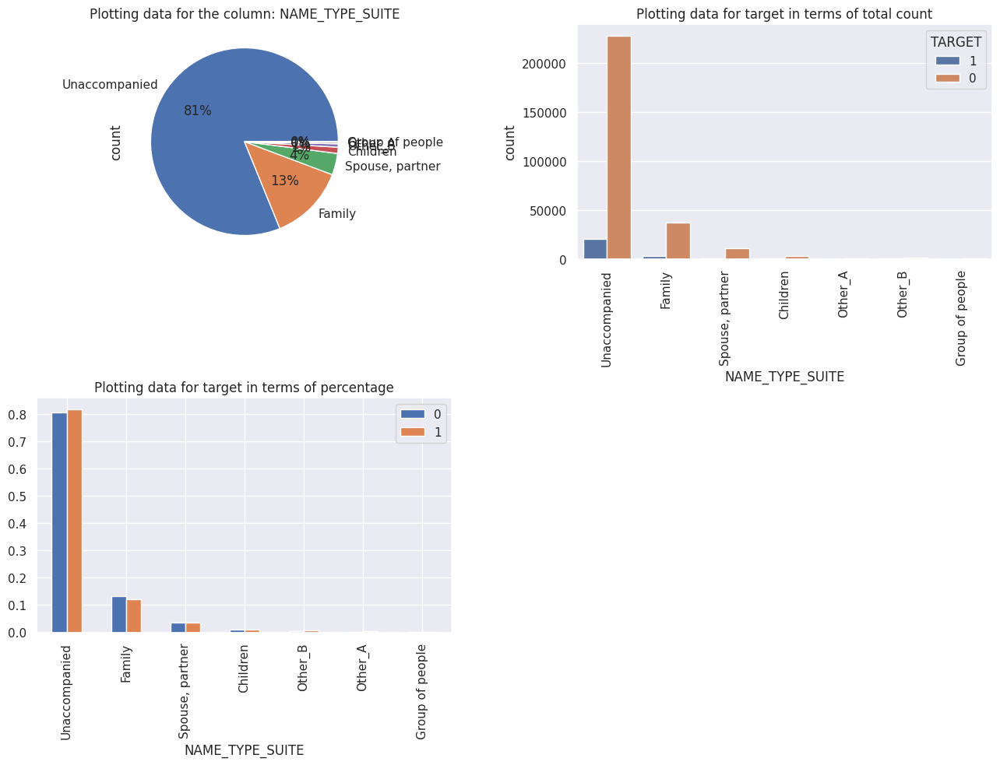

Plotting  NAME_INCOME_TYPE


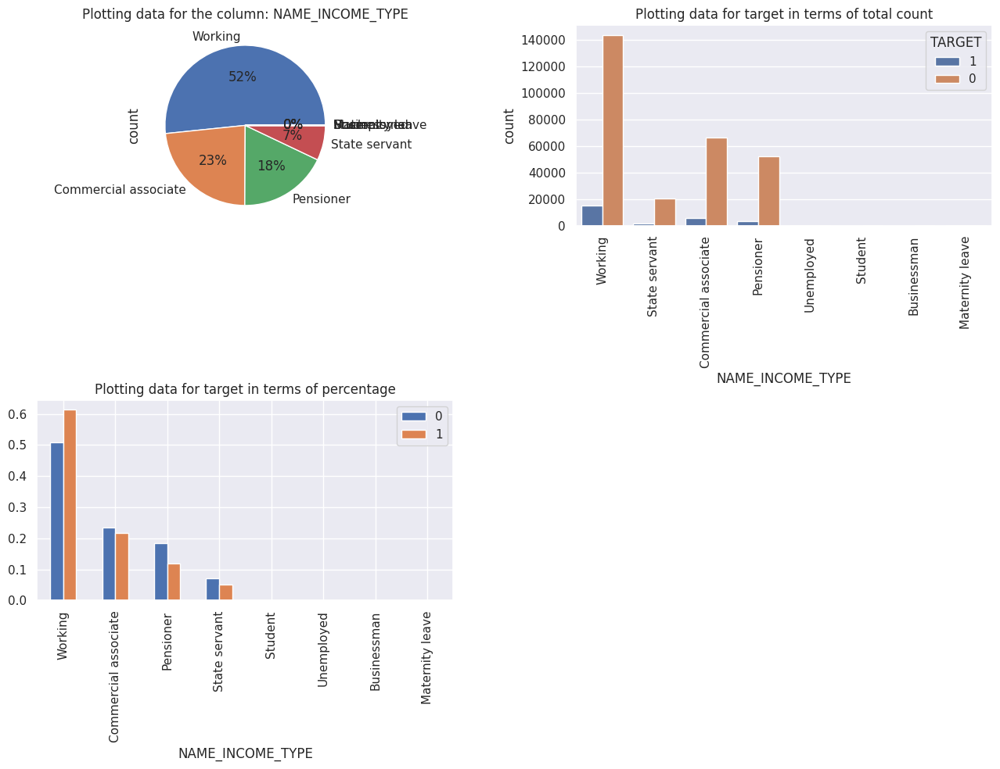

Plotting  NAME_EDUCATION_TYPE


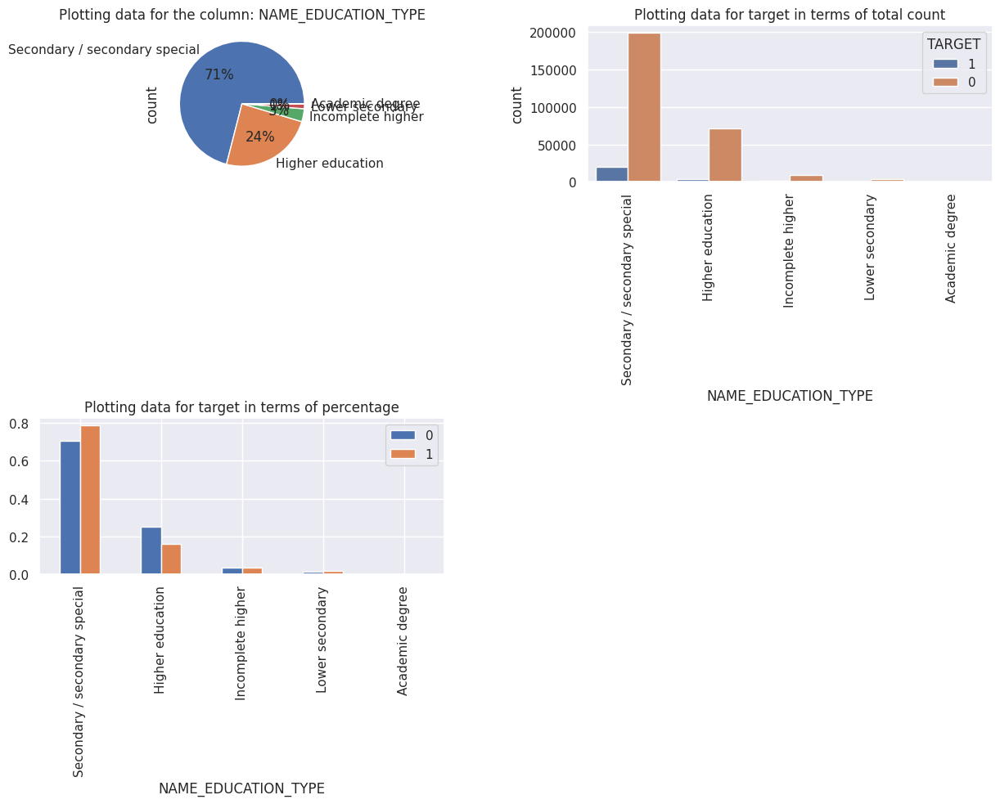

Plotting  NAME_FAMILY_STATUS


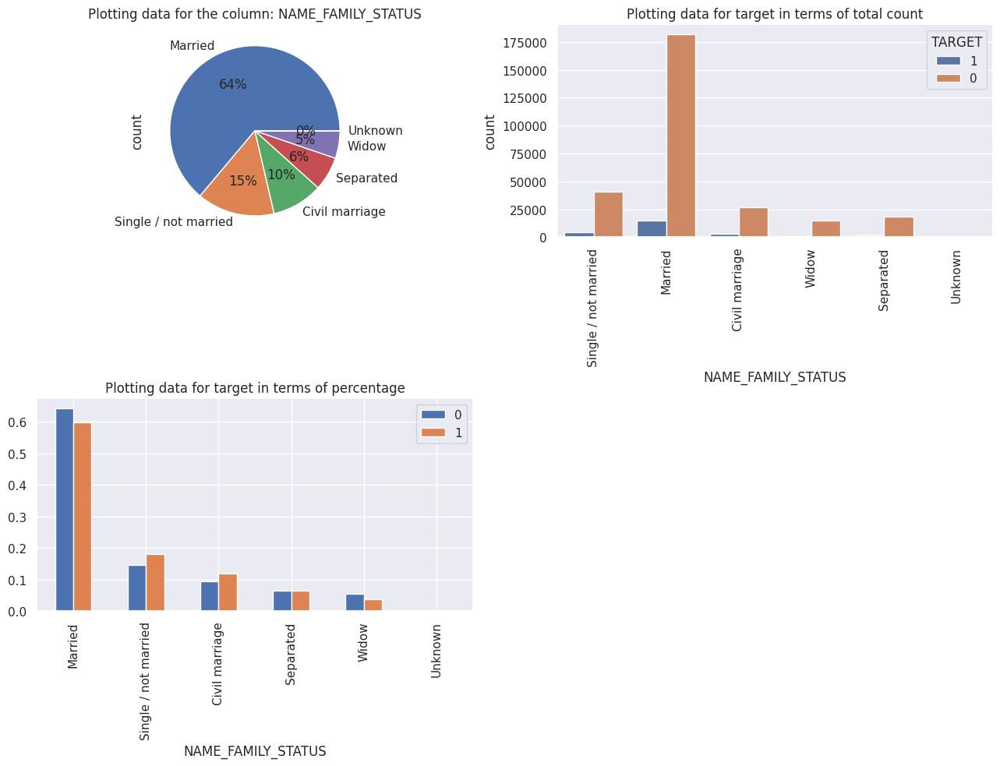

Plotting  NAME_HOUSING_TYPE


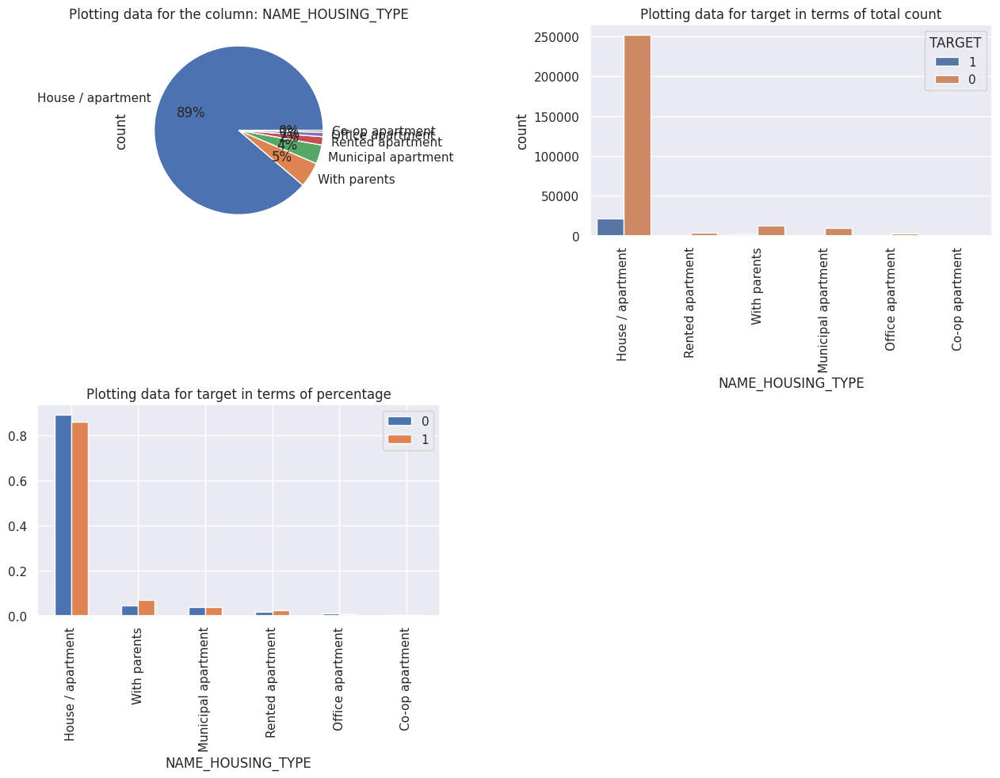

Plotting  OCCUPATION_TYPE


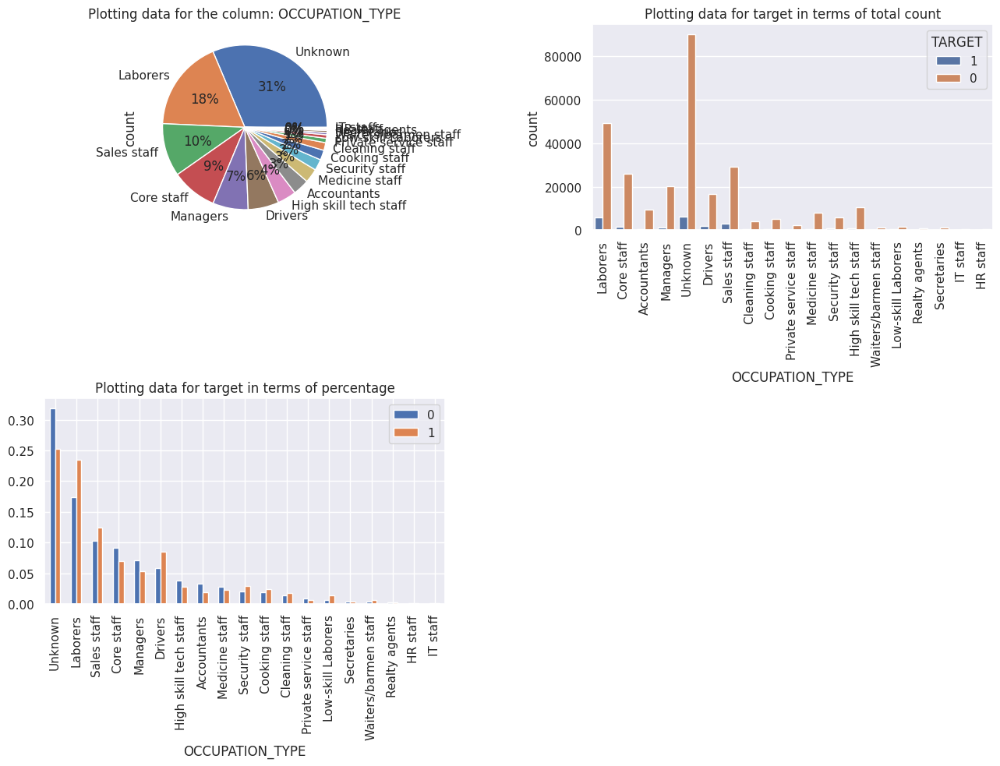

Plotting  WEEKDAY_APPR_PROCESS_START


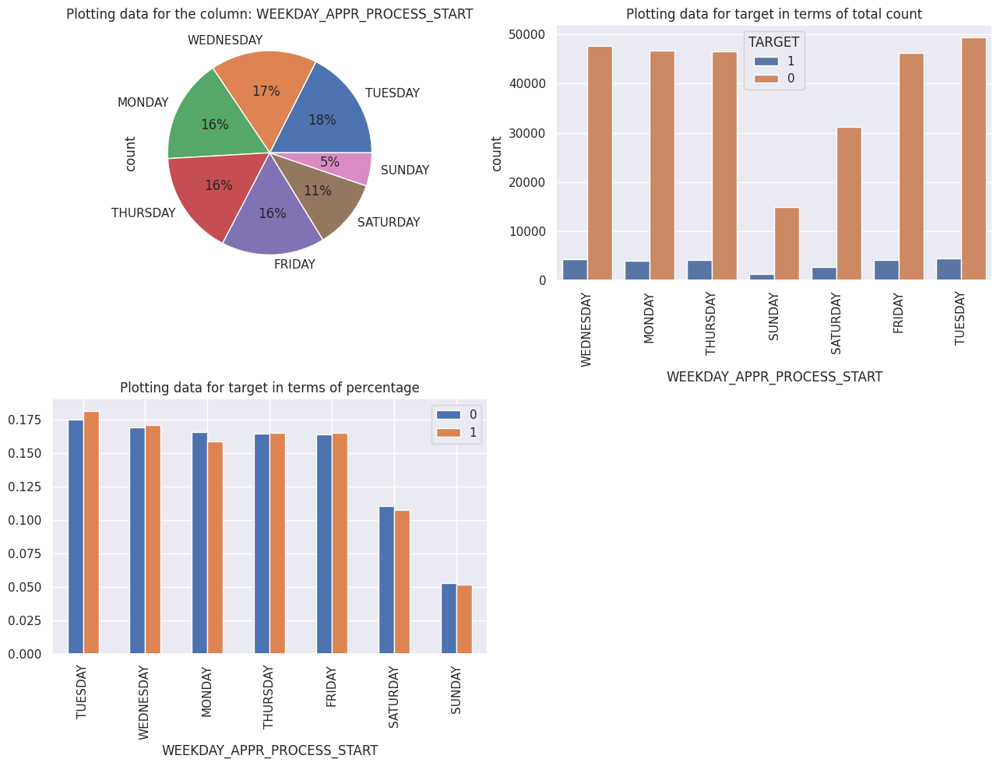

Plotting  ORGANIZATION_TYPE


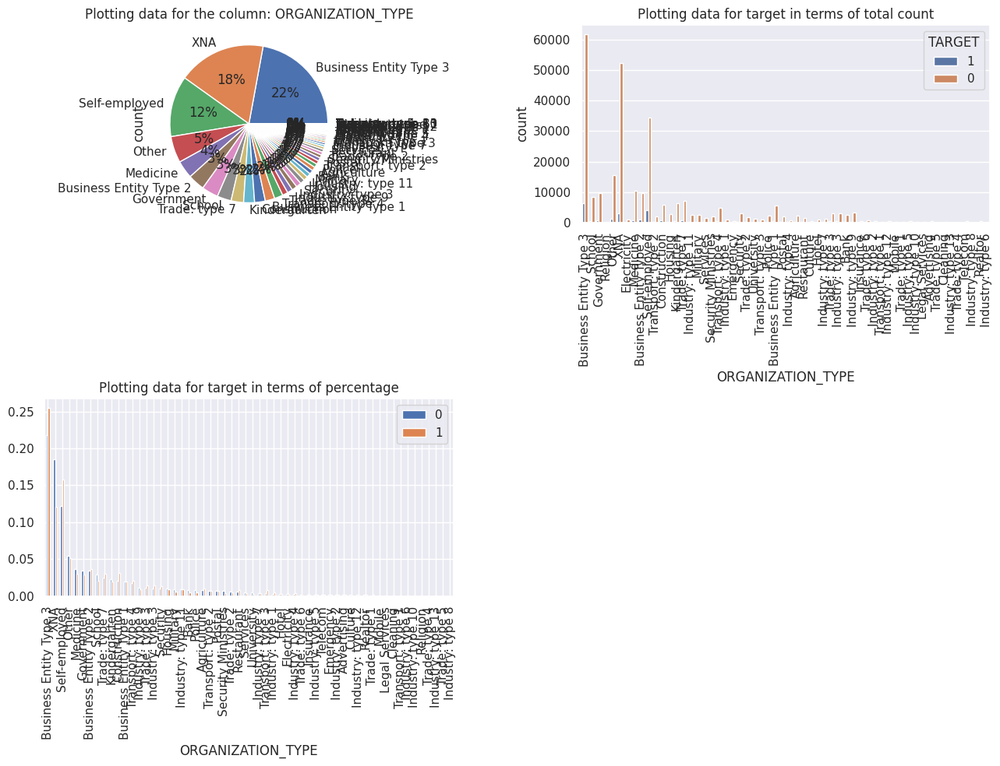

Plotting  EMERGENCYSTATE_MODE


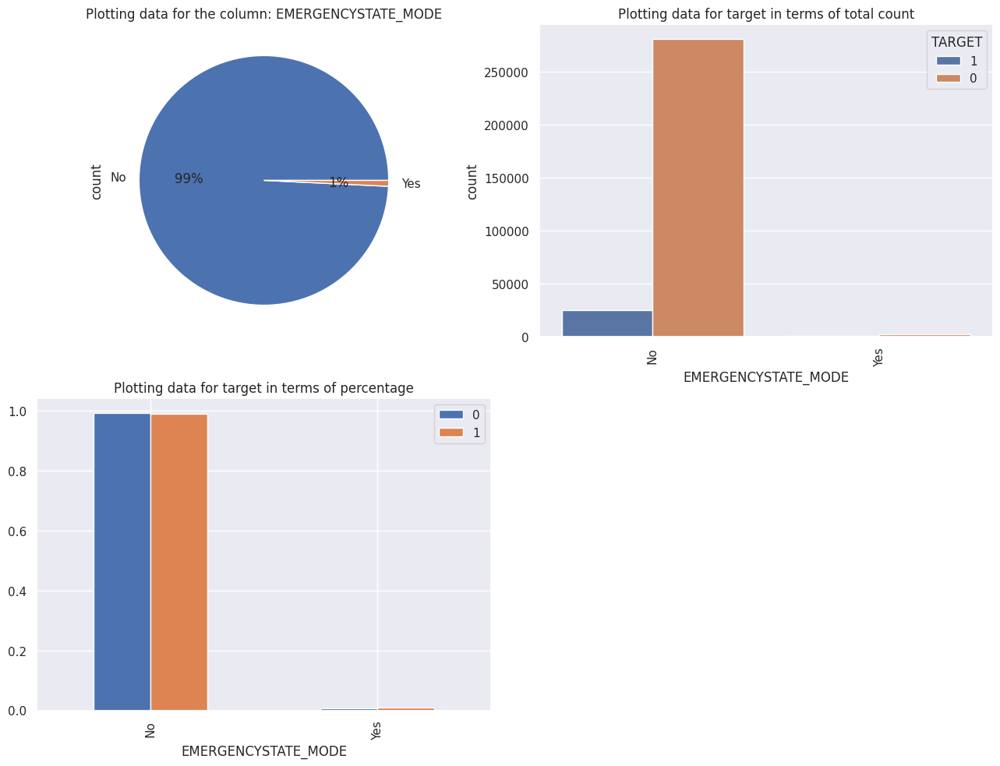

In [154]:
# Iterate through a list of categorical column names, creating plots for each column
for column in new_data_categorical:
    print("Plotting ", column)
    plotting(new_data, new_data_0, new_data_1, column)
    print("="*200)

## Visualizing Data Distribution



1. **Contract Type (NAME_CONTRACT_TYPE)**
- **Observation:**

  *  90% of applicants have cash loans, and 10% have revolving loans.
  *  Cash loans show a higher proportion of clients with payment difficulties compared to revolving loans.

- **Insights:**

  * The type of loan contract plays a critical role in predicting payment behavior. Cash loans may be associated with higher risk, possibly due to larger loan amounts or less flexible repayment terms compared to revolving loans.



---



2. **Gender Distribution (CODE_GENDER)**
- **Observation:**

  *   The dataset consists of 66% female and 34% male applicants.
  *   Both males and females have a higher number of clients without payment difficulties (TARGET = 0). However, proportionally, males have a higher share of clients with payment difficulties (TARGET = 1) compared to females.

- **Insights:**

  *   Females generally have better repayment behavior, with a lower proportion of payment difficulties compared to males. This could indicate gender-based differences in credit risk, where male applicants might represent a higher default risk.


---


3. **Car Ownership (FLAG_OWN_CAR)**
- **Observation:**

  *   66% of the applicants do not own a car, while 34% do.
  *   Non-car owners have a higher proportion of clients with payment difficulties compared to car owners.

- **Insights:**

  *  Car ownership could be a potential indicator of financial stability. Applicants who own a car are less likely to have payment difficulties, which could be due to higher income or more stable financial conditions.

---

4. **Realty Ownership (FLAG_OWN_REALTY)**
- **Observation:**
  * 69% of applicants own real estate, while 31% do not.
  * Both groups have a higher number of clients with no payment difficulties, but real estate owners tend to have slightly better repayment behavior.

- **Insights:**
  * While owning real estate might slightly correlate with better financial stability, the difference in repayment behavior between realty owners and non-owners is not very pronounced, making this feature less significant in predicting payment difficulties.

---

5. **Accompaniment Type (NAME_TYPE_SUITE)**
- **Observation:**
  * 81% of applicants are unaccompanied, while smaller segments apply with family, partners, or children.
  * Unaccompanied applicants have a higher proportion of clients with payment difficulties compared to those applying with family or partners.
- **Insights:**
  * Applicants accompanied by family or a spouse during the loan application process appear to manage their repayments better, suggesting that household support might contribute to better financial behavior.
---

6. **Income Type (NAME_INCOME_TYPE)**
- **Observation:**
  * 52% of applicants are working, 23% are commercial associates, and 18% are pensioners.
  * Pensioners exhibit the lowest proportion of clients with payment difficulties, while commercial associates and working individuals show a higher risk.

- **Insights:**
  * Pensioners, likely due to stable income, have fewer payment difficulties, while working individuals and commercial associates may face more financial uncertainty, leading to a higher default risk. This suggests that income type is an important factor in assessing credit risk.

---

7. **Education Type (NAME_EDUCATION_TYPE)**
- **Observation:**
  * The majority of applicants (71%) have secondary or secondary special education, while 24% have higher education.
  * Applicants with higher education tend to have fewer payment difficulties compared to those with only secondary education.
- **Insights:**
  * Education level is a strong predictor of financial behavior, with higher-educated applicants being less likely to default. This could be due to better financial literacy or higher-paying job opportunities.

---

8. **Family Status (NAME_FAMILY_STATUS)**
- **Observation:**
  * 64% of the applicants are married, 15% are single, and 6% are separated.
  * Single individuals have a higher proportion of clients with payment difficulties compared to married ones.
- **Insights:**
  * Family status is a significant factor in repayment behavior. Married individuals tend to have fewer payment difficulties, possibly due to shared household income and stronger financial support systems, whereas single individuals may face more financial strain.

---

9. **Housing Type (NAME_HOUSING_TYPE)**
- **Observation:**
  * 89% of the applicants live in a house or apartment, while smaller proportions live with parents or in rented apartments.
  * Applicants who live in rented or municipal apartments tend to have more payment difficulties.
- **Insights:**
  * Housing type could be indicative of financial stability, with homeowners or those living in stable housing situations (e.g., apartments or houses) showing fewer payment difficulties. This feature might be useful in predicting loan repayment behavior.

---

10. **Weekday Process Start (WEEKDAY_APPR_PROCESS_START)**
- **Observation:**
  * Loan applications are evenly distributed across weekdays, with a slight spike on Tuesday.
  * The proportion of clients with payment difficulties is relatively consistent across all weekdays, though slightly lower for applications processed on weekends (especially Sunday).
- **Insights:**
  * The day of the week does not appear to have a significant influence on repayment behavior, although applicants applying on weekends may represent a slightly lower credit risk.

---

11. **Occupation Type (OCCUPATION_TYPE)**
- **Observation:**
  * The most common occupations are laborers (18%) and sales staff (10%).
  * Unknown occupations and laborers show a higher proportion of clients with payment difficulties.

- **Insights:**
  * Occupation type has a noticeable impact on repayment behavior, with laborers and those with unknown occupations facing higher risks of payment difficulties. This could be due to job instability or lower income levels.

---

12. **Organization Type (ORGANIZATION_TYPE)**
- **Observation:**
  * The most common organization types are Business Entity Type 3 (22%), XNA (18%), and Self-employed (12%).
  * Business Entity Type 3 and XNA have the highest proportion of clients with payment difficulties.
- **Insights:**
  * Organization type is a significant factor in assessing credit risk. Certain organization types, like Business Entity Type 3 and Self-employed, may be associated with higher financial risk, potentially due to variable income or less job stability.

---

13. **Emergency State Mode (EMERGENCYSTATE_MODE)**
- **Observation:**
  * 99% of the applicants have no emergency state, with a very small fraction marked as Yes.
  * There is no significant difference in repayment behavior between those with and without an emergency state.
- **Insights:**
  * Emergency state mode does not seem to play a significant role in predicting payment difficulties, likely due to the very small percentage of applicants marked as Yes.

---

##The OverAll Insights from the above:

**Overall Observation:**
The dataset reveals that several factors, including gender, car ownership, income type, education level, family status, contract type, and occupation type, are significant in differentiating clients with and without payment difficulties. Demographic features, financial indicators, and loan-specific characteristics all play roles in determining the likelihood of loan default.

**Overall Insight:**
The most prominent insight from the analysis is that financial stability and economic predictability (indicated by factors like income type, education level, occupation, and car ownership) are strong predictors of a client's ability to repay loans without difficulties. Clients with stable income, higher education, ownership of assets (car, home), and stronger family support are less likely to default. On the other hand, clients with variable or lower income, lower education, and unstable job situations pose a higher credit risk.

##Most Relevant columns for my deductions are:

1. Contract Type (NAME_CONTRACT_TYPE)
2. Gender Distribution (CODE_GENDER)
3. Car Ownership (FLAG_OWN_CAR)
4. Income Type (NAME_INCOME_TYPE)
5. Occupation Type (OCCUPATION_TYPE)
6. Family Status (NAME_FAMILY_STATUS)
7. Education Level (NAME_EDUCATION_TYPE)

## Analysing Numerical Columns

### Non-defaulter correlation

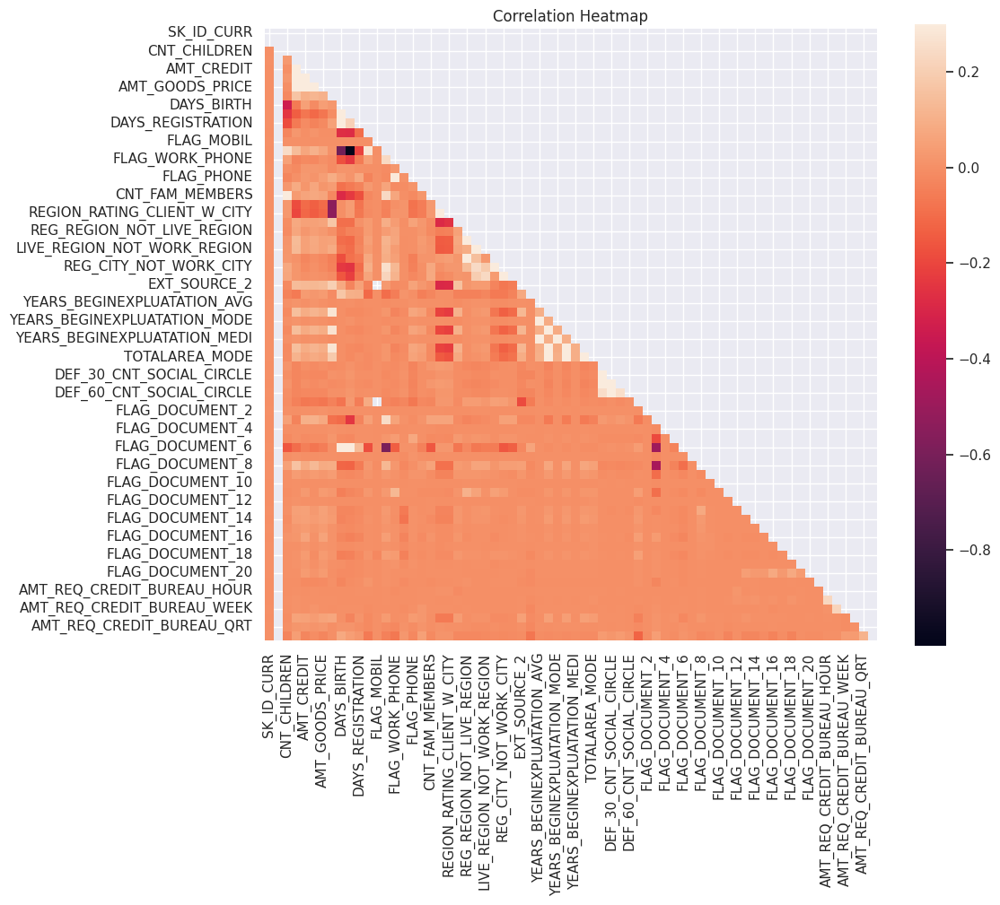

In [155]:
# Filtering only numeric columns from new_data_0 for correlation analysis.
numeric_cols = new_data_0.select_dtypes(include=[np.number]).columns
new_data_0_numeric = new_data_0[numeric_cols]

# Calculating the correlation matrix for the numeric columns
corr = new_data_0_numeric.corr()

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

# Creating a heatmap to visualize the correlation matrix
plt.figure(figsize=(11,9))
sns.heatmap(corr, annot=False, mask=mask, square=True, vmax=.3)
plt.title('Correlation Heatmap')
plt.show()

This method starts by narrowing down the DataFrame to only include columns with numeric data. Following this, it computes the correlation matrix using the filtered DataFrame.

###Finding the correlation

In [156]:
# Select only the numeric columns from the DataFrame
numeric_df = new_data_0.select_dtypes(include=[np.number])

# Optionally, we can handle missing values if necessary, for example, by filling them
# numeric_df = numeric_df.fillna(method='ffill').fillna(method='bfill')

# calculating the absolute correlation matrix for the numeric columns
correlation_0 = numeric_df.corr().abs()

# Unstack and sort the correlation pairs
correlation_0 = correlation_0.unstack().sort_values(kind="quicksort", ascending=False)

# Optionally, drop NA values if there are any missing correlations due to missing data
correlation_0 = correlation_0.dropna()

# Displaying sorted correlation pairs
print(correlation_0)

SK_ID_CURR                    SK_ID_CURR                      1.000000e+00
REGION_RATING_CLIENT          REGION_RATING_CLIENT            1.000000e+00
FLOORSMAX_MODE                FLOORSMAX_MODE                  1.000000e+00
YEARS_BEGINEXPLUATATION_MODE  YEARS_BEGINEXPLUATATION_MODE    1.000000e+00
FLOORSMAX_AVG                 FLOORSMAX_AVG                   1.000000e+00
                                                                  ...     
FLAG_MOBIL                    FLAG_DOCUMENT_12                5.002798e-06
EXT_SOURCE_2                  FLAG_DOCUMENT_2                 3.976804e-06
FLAG_DOCUMENT_2               EXT_SOURCE_2                    3.976804e-06
AMT_REQ_CREDIT_BUREAU_HOUR    FLAG_DOCUMENT_15                2.064400e-07
FLAG_DOCUMENT_15              AMT_REQ_CREDIT_BUREAU_HOUR      2.064400e-07
Length: 4485, dtype: float64


In [157]:
# Displaying from correlation_0 values which are not 1.0
correlation_0[correlation_0!=1].head(15)

,,0
FLAG_EMP_PHONE,DAYS_EMPLOYED,0.999758
DAYS_EMPLOYED,FLAG_EMP_PHONE,0.999758
OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,0.998508
OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,0.998508
FLOORSMAX_MEDI,FLOORSMAX_AVG,0.997253
FLOORSMAX_AVG,FLOORSMAX_MEDI,0.997253
YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,0.993582
YEARS_BEGINEXPLUATATION_AVG,YEARS_BEGINEXPLUATATION_MEDI,0.993582
FLOORSMAX_MEDI,FLOORSMAX_MODE,0.988955
FLOORSMAX_MODE,FLOORSMAX_MEDI,0.988955


###Defaulter Correlation


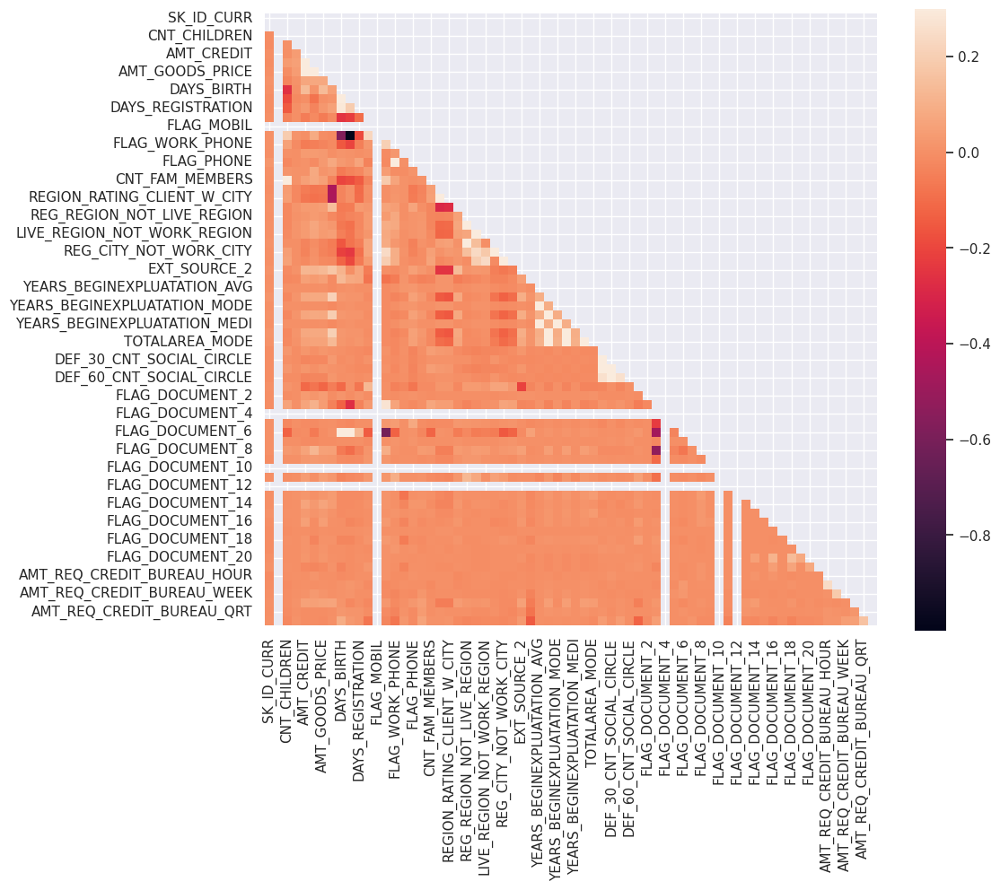

In [158]:
#Selecting only numeric columns from the DataFrame
new_data_1_numeric = new_data_1.select_dtypes(include=[np.number])

# Optionally handle missing values. For example, we could fill them with zeros
# new_data_1_numeric.fillna(0, inplace=True)

# Now we can safely calculate the correlation matrix
corr = new_data_1_numeric.corr()

# To continue with masking the upper triangle for plotting:
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
with sns.axes_style("white"):
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True)

In [159]:
# Selecting only numeric columns from 'new_data_1'
new_data_1_numeric = new_data_1.select_dtypes(include=[np.number])

# Optional: Handling missing values. For example, we can fill them with the column mean
# new_data_1_numeric.fillna(new_data_1_numeric.mean(), inplace=True)

# Computing the absolute correlation matrix
correlation_1 = new_data_1_numeric.corr().abs()

# If we want to unstack and sort the correlation pairs
correlation_pairs = correlation_1.unstack().sort_values(kind="quicksort", ascending=False)

# Optional: Drop NaN values if any exist
correlation_pairs = correlation_pairs.dropna()
correlation_1 = correlation_1[correlation_1 != 1.0]

print(correlation_1)

                            SK_ID_CURR  TARGET  CNT_CHILDREN  \
SK_ID_CURR                         NaN     NaN      0.005144   
TARGET                             NaN     NaN           NaN   
CNT_CHILDREN                  0.005144     NaN           NaN   
AMT_INCOME_TOTAL              0.010165     NaN      0.004796   
AMT_CREDIT                    0.001290     NaN      0.001675   
...                                ...     ...           ...   
AMT_REQ_CREDIT_BUREAU_DAY     0.007388     NaN      0.011255   
AMT_REQ_CREDIT_BUREAU_WEEK    0.003075     NaN      0.009316   
AMT_REQ_CREDIT_BUREAU_MON     0.005180     NaN      0.008852   
AMT_REQ_CREDIT_BUREAU_QRT     0.001614     NaN      0.013029   
AMT_REQ_CREDIT_BUREAU_YEAR    0.005442     NaN      0.021572   

                            AMT_INCOME_TOTAL  AMT_CREDIT  AMT_ANNUITY  \
SK_ID_CURR                          0.010165    0.001290     0.007578   
TARGET                                   NaN         NaN          NaN   
CNT_CHILDREN

Based on the data here are the top 10 significant relations based on their correlation values for the defaulters:

- CNT_CHILDREN and TARGET: Correlation = 0.258910
- AMT_ANNUITY and AMT_CREDIT: Correlation = 0.752195
- AMT_GOODS_PRICE and AMT_CREDIT: Correlation = 0.983103
- AMT_ANNUITY and AMT_GOODS_PRICE: Correlation = 0.752699
- DAYS_EMPLOYED and DAYS_BIRTH: Correlation = 0.574681
- CNT_CHILDREN and DAYS_BIRTH: Correlation = 0.258910
- AMT_ANNUITY and REGION_POPULATION_RELATIVE: Correlation = 0.071690
- EXT_SOURCE_2 and AMT_CREDIT: Correlation = 0.120848
- FLOORSMAX_AVG and REGION_POPULATION_RELATIVE: Correlation = 0.208990
- REGION_RATING_CLIENT and REGION_POPULATION_RELATIVE: Correlation = 0.443236

These represent the most notable relationships found in the dataset. The relations with high correlation are primarily focused on financial indicators and population factors.

##Task 7 : Analysis for the outliers

Potting the numerial data based on the index and analysing if there are outliers in any of the column.

In [160]:
new_data_categorical

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'EMERGENCYSTATE_MODE']

In [161]:
# Selecting columns with numerical datatypes ('int64', 'float64') from DataFrame 'train'
new_data_categorical = new_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
new_data_categorical

['SK_ID_CURR',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'FLOORSMAX_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMEN

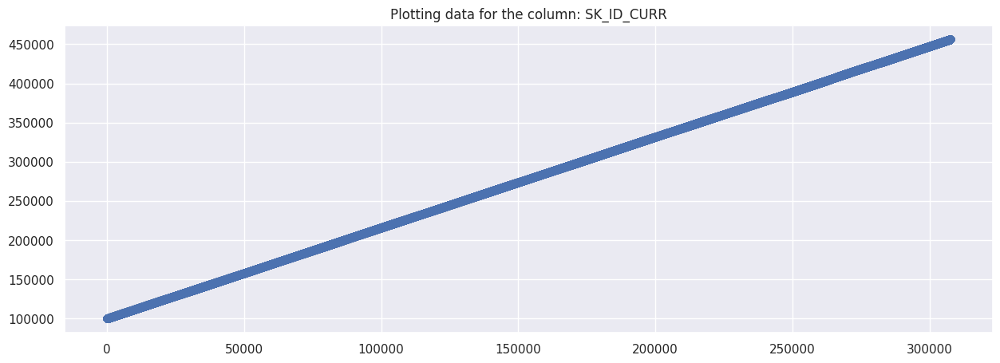

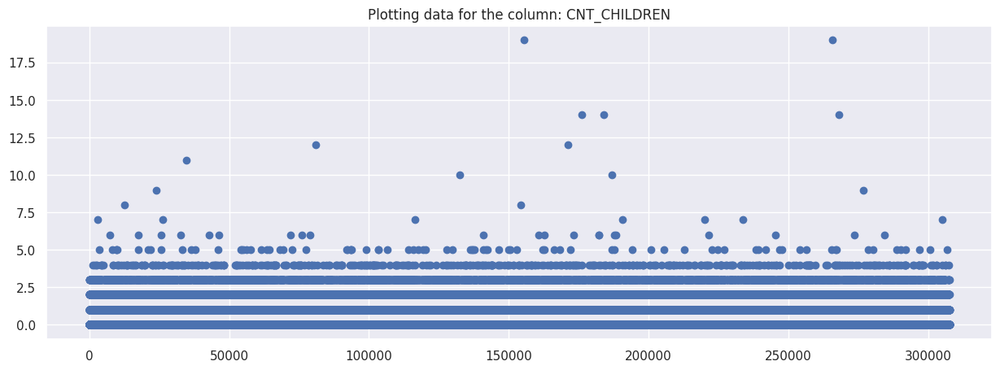

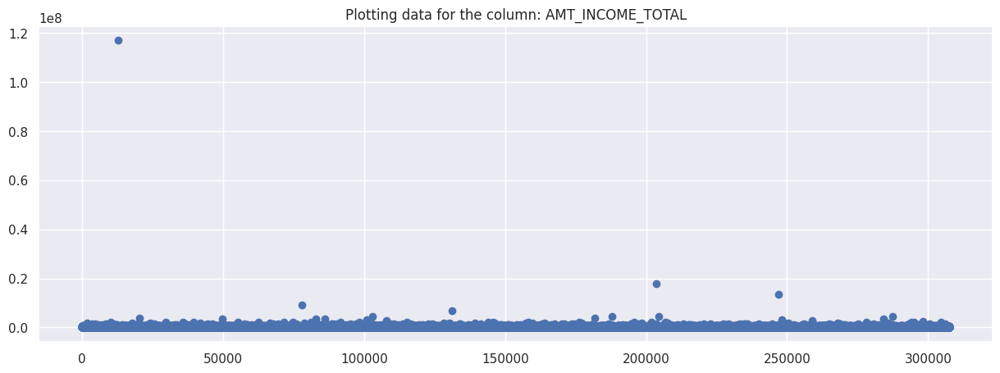

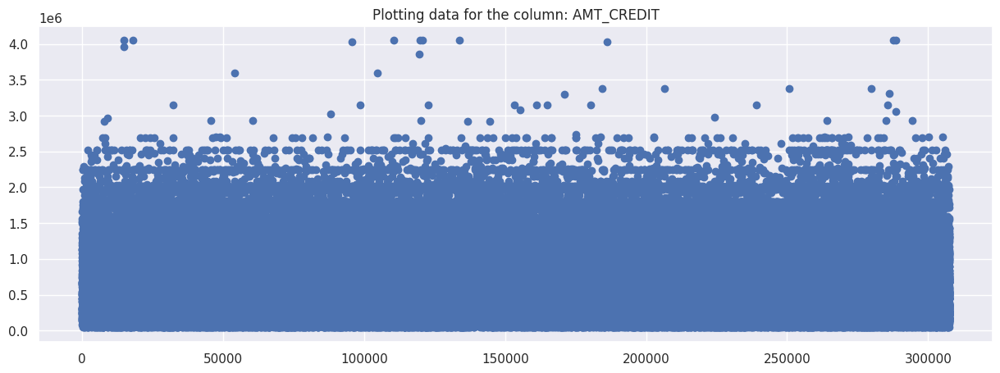

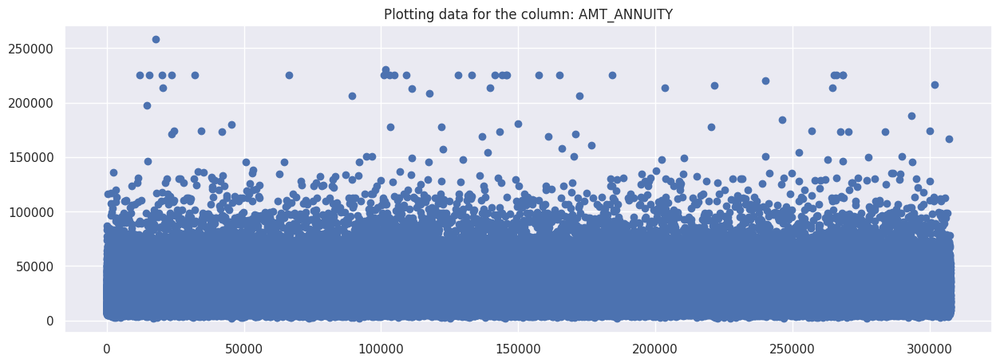

...

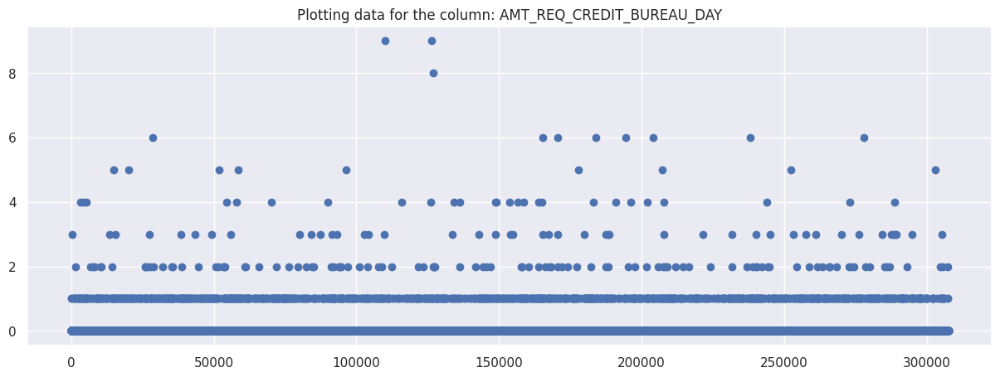

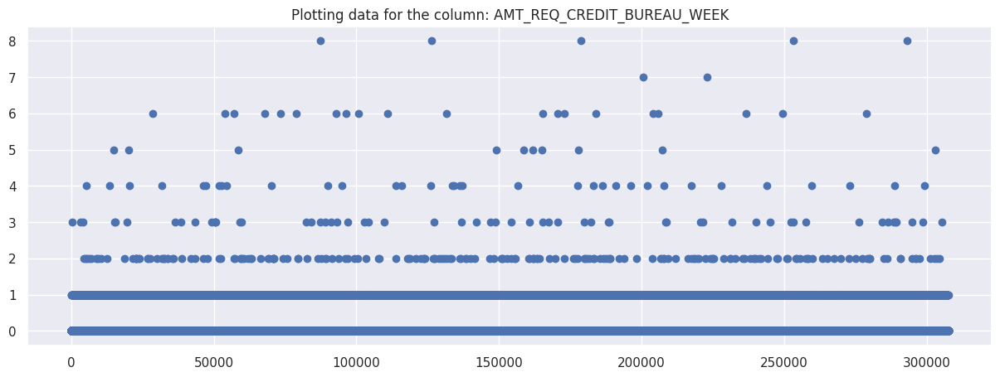

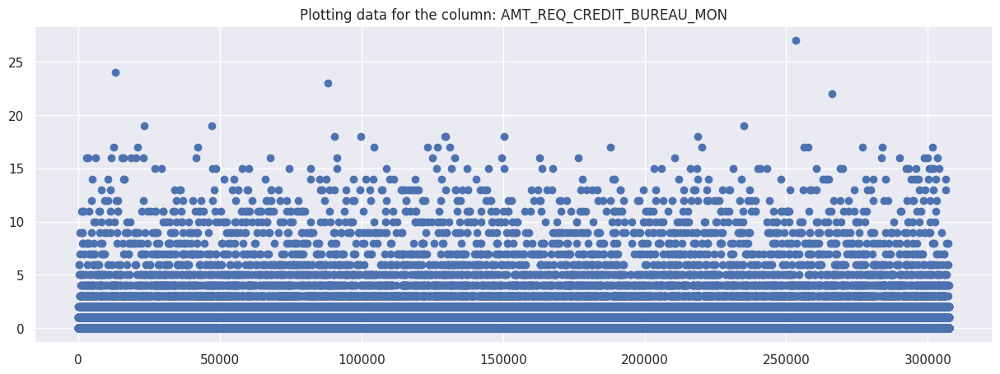

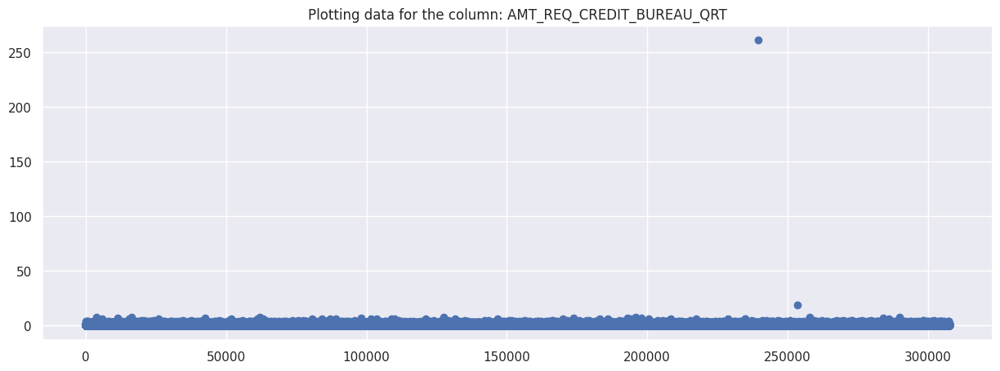

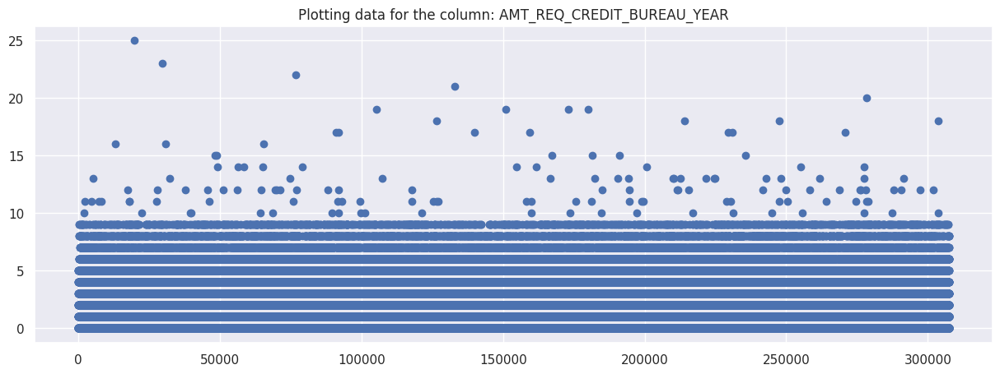

In [162]:
# Plotting the numerical column against the index of the DataFrame 'new_data'
for column in new_data_categorical:
  title = 'Plotting data for the column: ' + column
  plt.scatter(new_data.index, new_data[column])
  plt.title(title)
  plt.show()

Here are the insights for the top 15 important outliers in the dataset:

**1. AMT_INCOME_TOTAL:**
- **Insight:** The presence of an outlier with income around 120 million suggests a potential data entry error. This value is extremely high compared to the rest of the dataset. If this outlier is genuine, it may represent a unique, ultra-wealthy individual, but it requires verification.
**2. AMT_REQ_CREDIT_BUREAU_QRT:**
- **Insight:** The outlier of over 250 credit requests in a quarter is an abnormality. This could indicate fraud or extreme financial instability, or it may be a data recording error. It is highly uncommon for someone to make that many requests in such a short period.
3. **OBS_30_CNT_SOCIAL_CIRCLE:**
- **Insight:** An individual with over 350 social circle observations in the past 30 days is a major anomaly. The usual range is 0-10, so this extreme value could either be a data error or indicate an individual with an unusually large social circle that impacts their credit behavior.
4. **OBS_60_CNT_SOCIAL_CIRCLE:**
- **Insight:** Similar to OBS_30, having over 350 social circle observations in 60 days is highly unusual. It’s critical to investigate whether this represents a special case or an error in the dataset.

**5. CNT_CHILDREN:**
- **Insight:** The presence of an individual with over 18 children is highly unusual. It’s far beyond the normal range (0-5 children). This could represent a unique case or an error, and its presence could distort analyses relating to family size and financial stability.

**6. CNT_FAM_MEMBERS:**
- **Insight:** Outliers showing family sizes up to 20 members are extremely rare. These values could skew models that use family size as a predictor of financial behavior and may need to be addressed or confirmed for accuracy.

**7. DAYS_EMPLOYED:**
- **Insight:** The outlier of over 365,000 days of employment (~1000 years) is a clear data entry issue. This value could potentially distort any employment-related analyses and needs correction or removal.

**8. DEF_30_CNT_SOCIAL_CIRCLE:**
- **Insight:** More than 30 defaults in an individual’s social circle within the last 30 days is extremely rare. This might indicate someone in a highly financially unstable environment, but it’s more likely a data anomaly.

**9. DEF_60_CNT_SOCIAL_CIRCLE:**
- **Insight:** Similar to DEF_30, having over 25 defaults in 60 days is a major deviation from the norm. Such high default counts should be investigated to ensure data accuracy, as it could impact credit risk models.

**10. YEARS_BEGINEXPLUATATION_AVG/MEDI/MODE:**
- **Insight:** The outliers in this column suggest buildings with unusually long or short periods of usage. Properties with very low values (close to zero) may be very old or reflect inaccurate data about building age. This could skew analyses involving property value or related financial stability.

**11. FLAG_MOBIL:**
- **Insight:** The single outlier showing a 0 in the FLAG_MOBIL column (no mobile phone) while nearly everyone else has a 1 suggests a missing or incorrect value. In today’s world, not having a mobile phone is extremely rare and might indicate a data entry issue.

**12. AMT_ANNUITY:**
- **Insight:** The high annuity outliers above 200,000 could indicate individuals with substantial loan amounts or possibly errors. These values are significantly higher than the norm and might impact models predicting loan repayment behavior.

**13. AMT_CREDIT:**
- **Insight:** The few high credit outliers, especially around 3.5M to 4M, may represent significant borrowing or special loan products. These outliers need to be carefully analyzed, as they may skew financial models if not handled properly.

**14. REGION_POPULATION_RELATIVE:**
- **Insight:** The outliers showing higher regional population densities (around 0.07) compared to the majority of the data (0.01 to 0.03) could indicate a few regions with unique population pressures. These areas may require different financial models, as population density can impact economic behavior.

**15. TOTALAREA_MODE:**
- **Insight:** Outliers below 0.5 in the TOTALAREA_MODE column suggest individuals living in much smaller residential areas compared to the majority. This could be important for understanding housing-related financial behaviors or targeting different demographic segments.

**Overall Insights:**
- **Data Quality:** Many of the outliers in the dataset seem to be data entry issues (e.g., DAYS_EMPLOYED, AMT_INCOME_TOTAL). These need to be corrected or excluded to avoid skewing any analyses or models.
- **Extreme Cases:** Some outliers, such as those in the OBS_30_CNT_SOCIAL_CIRCLE or AMT_CREDIT columns, could represent special cases (e.g., ultra-wealthy individuals or unusual social circumstances) and should be handled separately.

# Handling the outliers

In [221]:
# Define a function to handle outliers using IQR
def handle_outliers(df, column):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)

    # Calculate the Interquartile Range (IQR)
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Cap or remove outliers
    df[column] = df[column].apply(lambda x: upper_bound if x > upper_bound else (lower_bound if x < lower_bound else x))

    return df

# List of columns with outliers based on your provided insights
outlier_columns = [
    'AMT_INCOME_TOTAL', 'AMT_REQ_CREDIT_BUREAU_QRT', 'OBS_30_CNT_SOCIAL_CIRCLE',
    'OBS_60_CNT_SOCIAL_CIRCLE', 'CNT_CHILDREN', 'CNT_FAM_MEMBERS',
    'DAYS_EMPLOYED', 'DEF_30_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
    'YEARS_BEGINEXPLUATATION_AVG', 'FLAG_MOBIL', 'AMT_ANNUITY',
    'AMT_CREDIT', 'REGION_POPULATION_RELATIVE', 'TOTALAREA_MODE'
]

# Apply the outlier handling function to all relevant columns in the 'new_data' dataframe
for column in outlier_columns:
    new_data = handle_outliers(new_data, column)


**Explanation:**
- Interquartile Range (IQR): This method identifies outliers as values outside 1.5 times the IQR below the first quartile (Q1) or above the third quartile (Q3).

- Capping: Instead of removing the outliers, we cap them at the lower or upper bounds, which can be more useful in maintaining data integrity.

##Checking the values after performing the outliers process

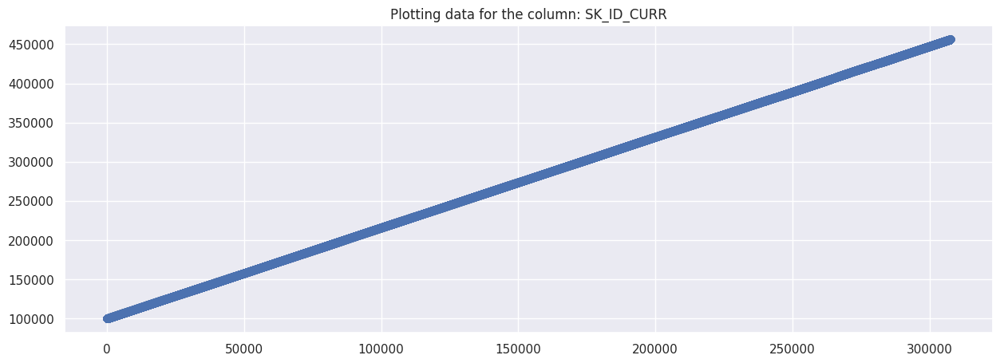

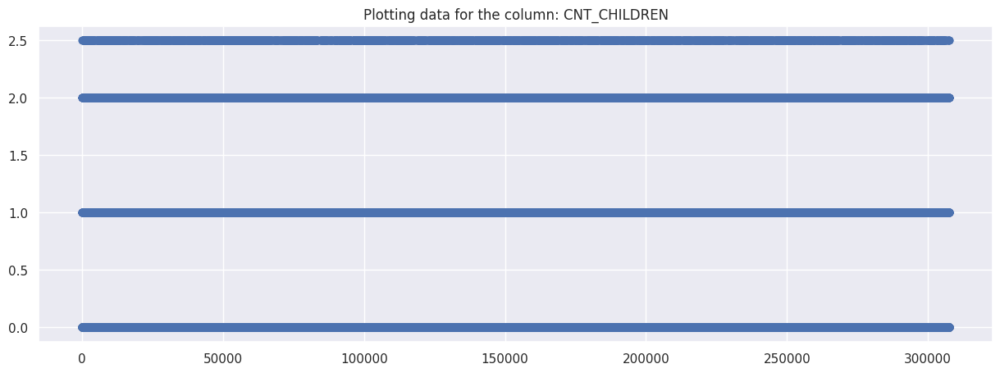

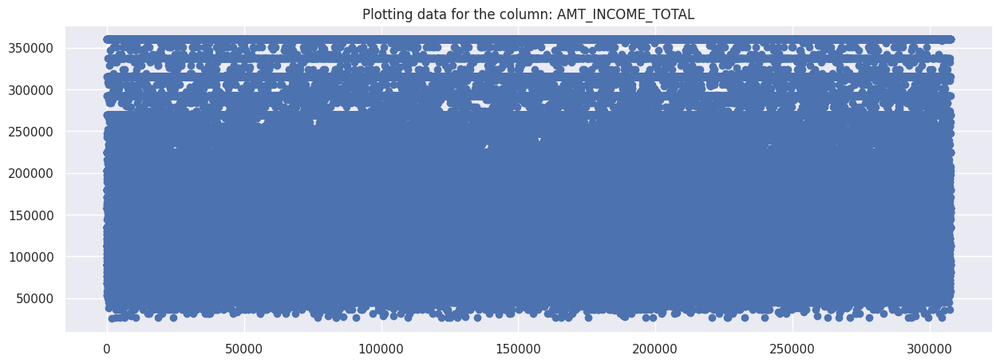

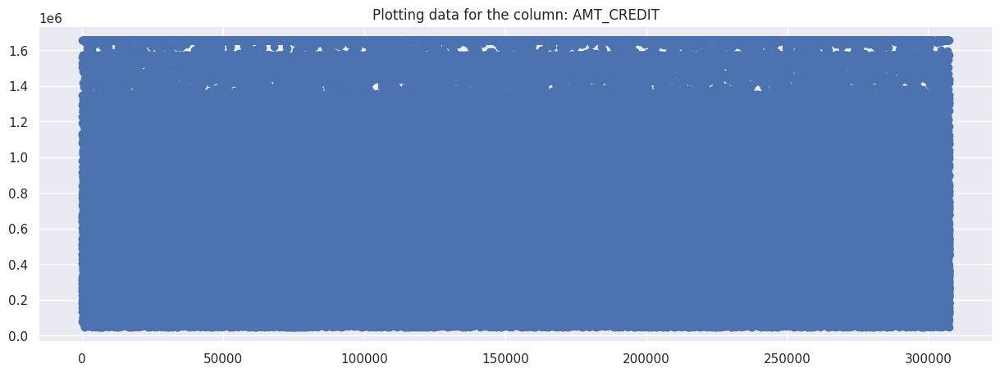

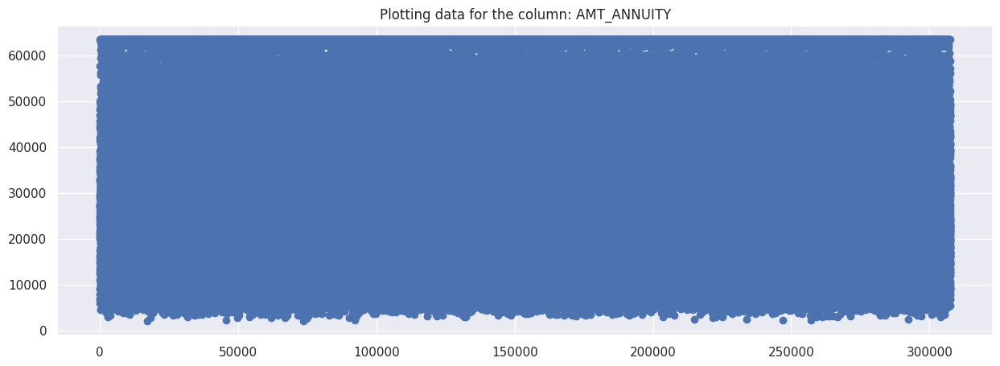

...

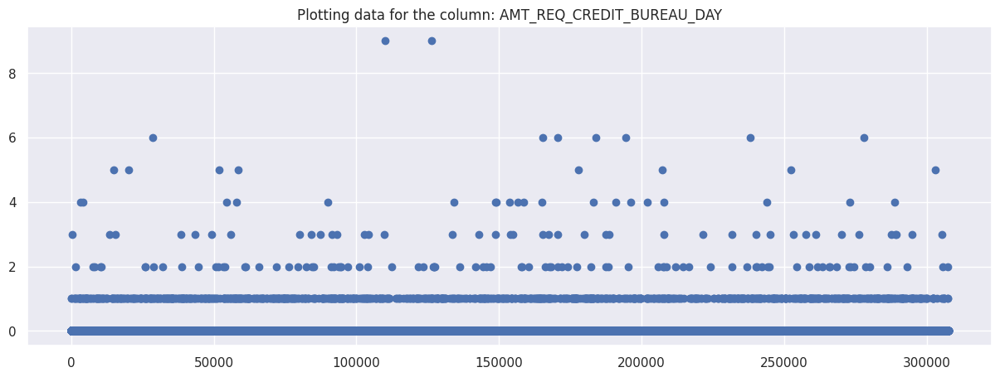

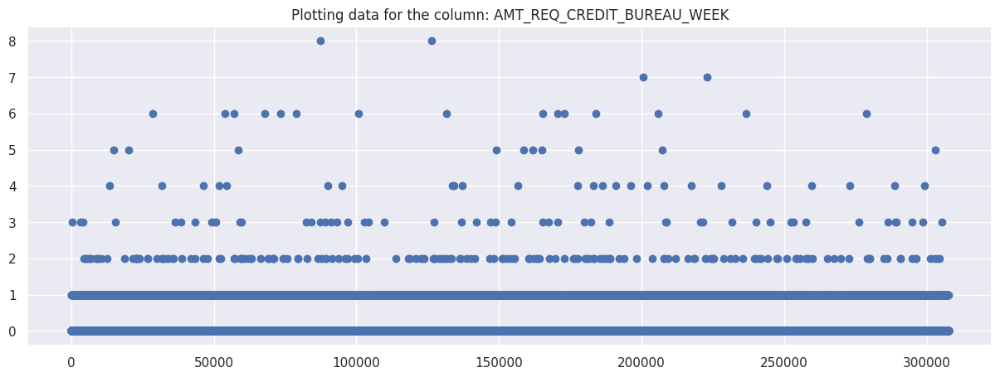

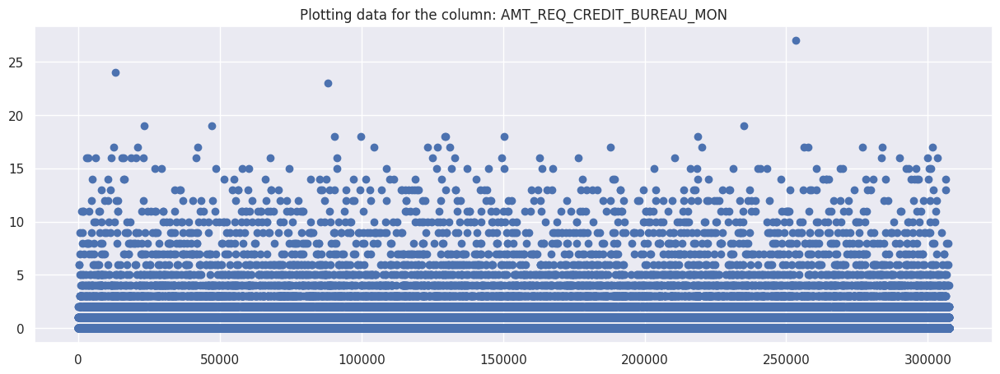

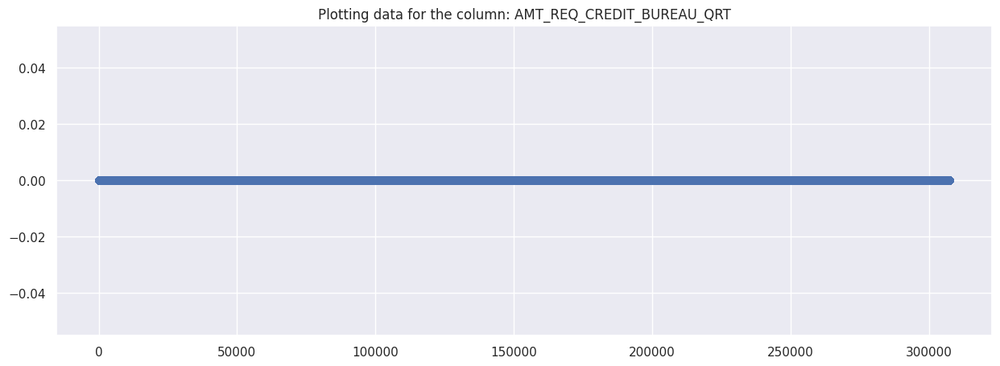

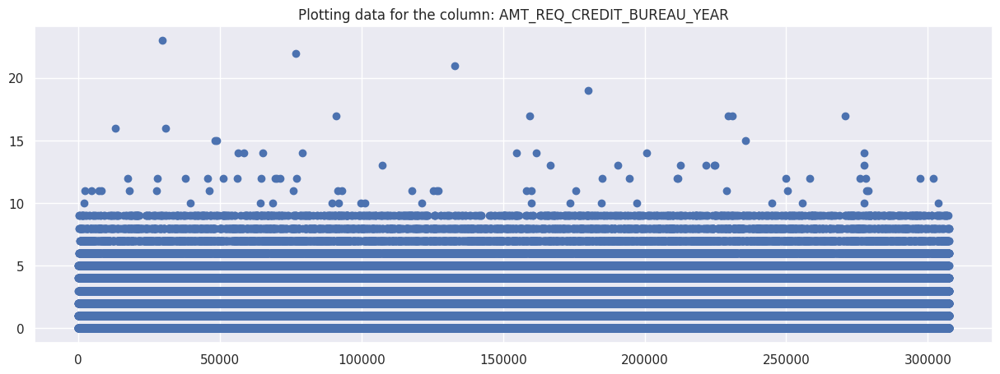

In [222]:
# Plotting the numerical column against the index of the DataFrame 'new_data'
for column in new_data_categorical:
  title = 'Plotting data for the column: ' + column
  plt.scatter(new_data.index, new_data[column])
  plt.title(title)
  plt.show()

## Converting a numerial data to categorical for analysis

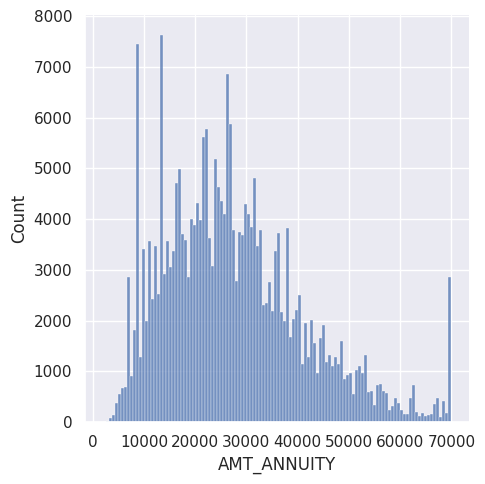

In [164]:
# Plot a distribution plot for "AMT_ANNUITY" column after removing any missing values
sns.displot(new_data['AMT_ANNUITY'].dropna())
plt.show()

In [165]:
def amt_annuity(x):
  if x <= 20000:
    return "low"
  elif x > 20000 and x <= 50000:
    return "medium"
  elif x > 50000 and x <= 100000:
    return "high"
  else:
    return "very high"

# Apply the "amt_annuity" function to create a new categorical column "amt_annuity_categorical"
new_data['amt_annuity_categorical'] = new_data['AMT_ANNUITY'].apply(lambda x : amt_annuity(x))

In [166]:
new_data['amt_annuity_categorical'].value_counts()

,count
amt_annuity_categorical,
medium,151555
low,81716
high,18852
very high,12


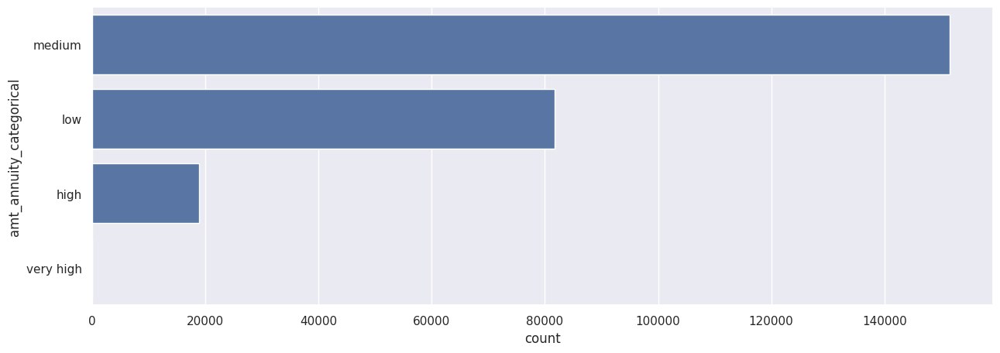

In [167]:
# Plotting a count plot of the "amt_annuity_categorical" column
sns.countplot(new_data['amt_annuity_categorical'])
plt.show()

# Task - Univariate Analysis for numerical data

For univariate analysis of the numerical columns, we will plot the histogram and the distribution plot.

Plot of SK_ID_CURR


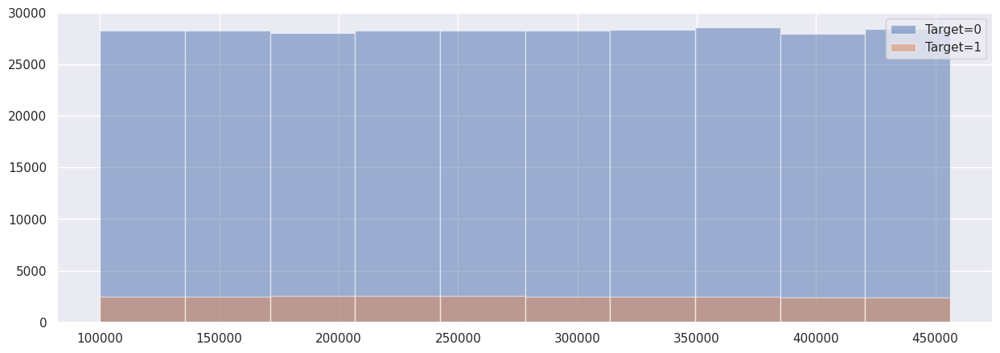

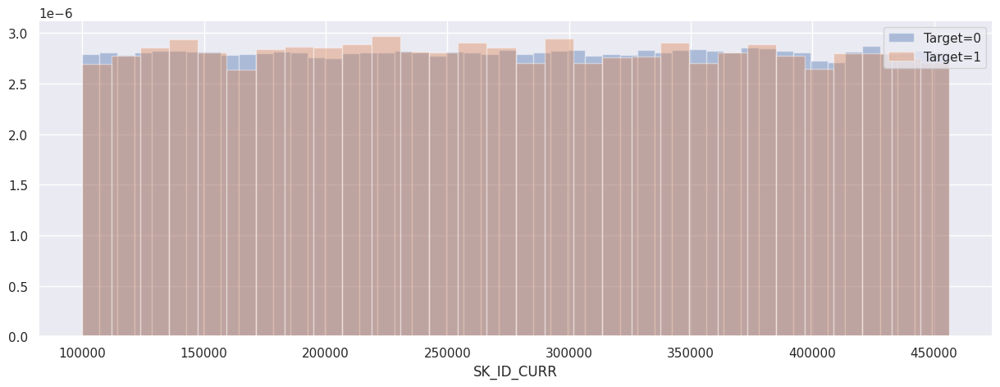

Plot of CNT_CHILDREN


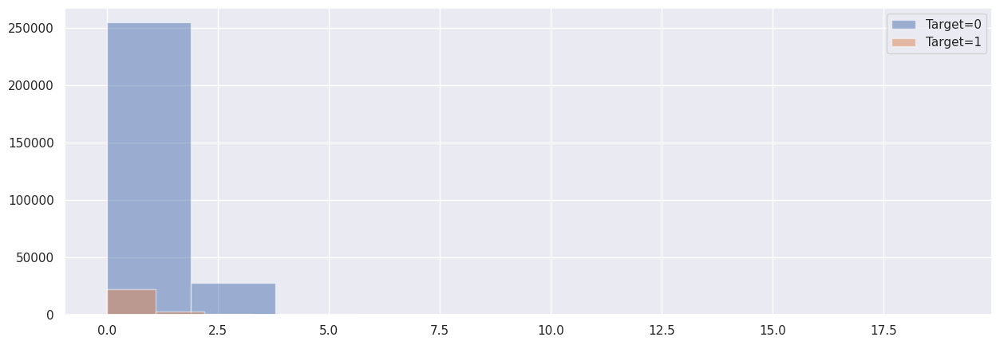

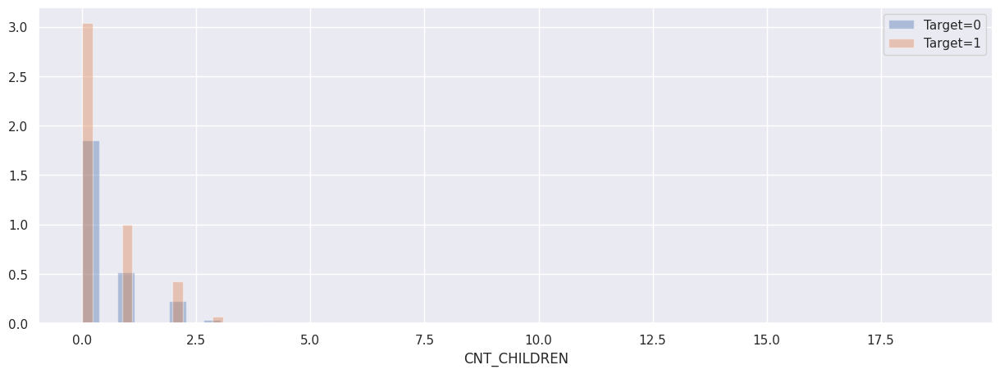

Plot of AMT_INCOME_TOTAL


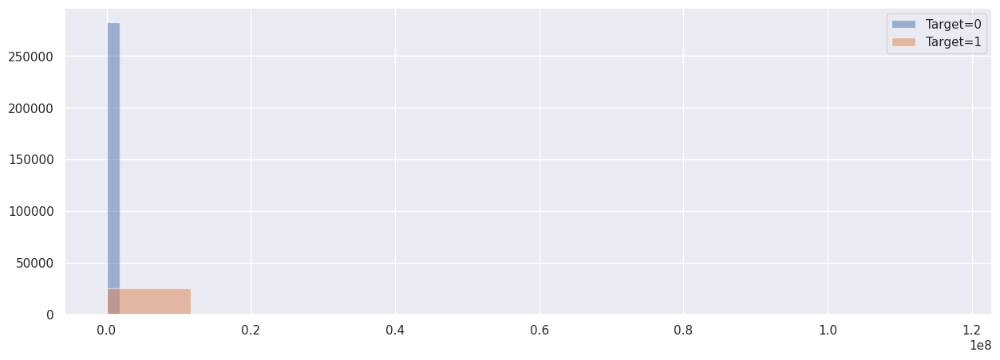

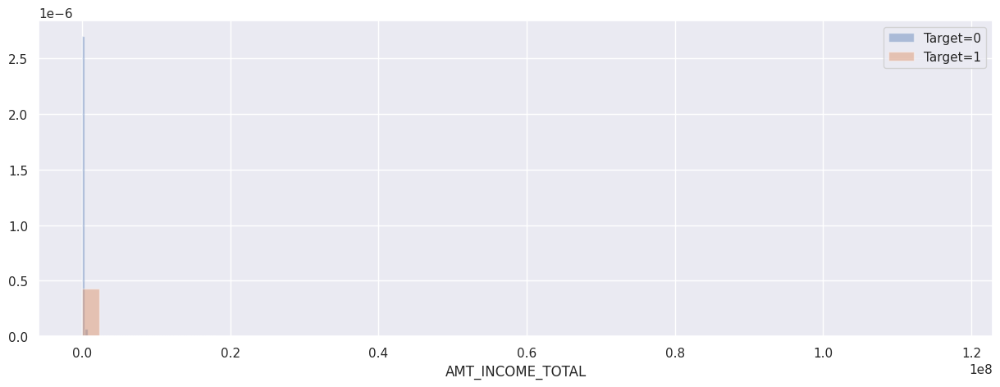

Plot of AMT_CREDIT


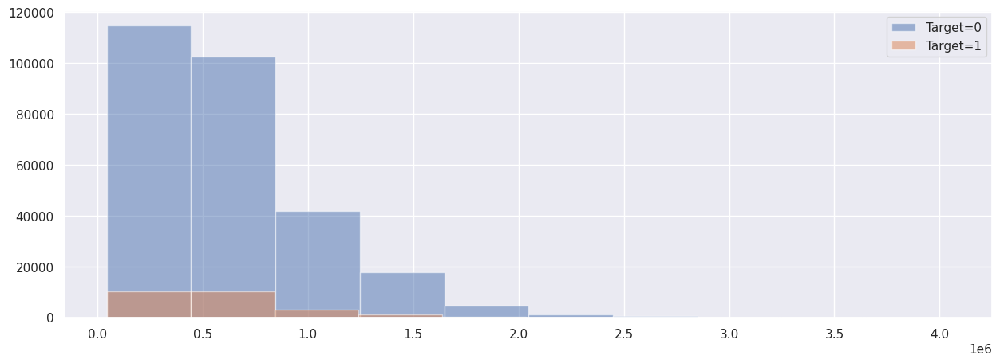

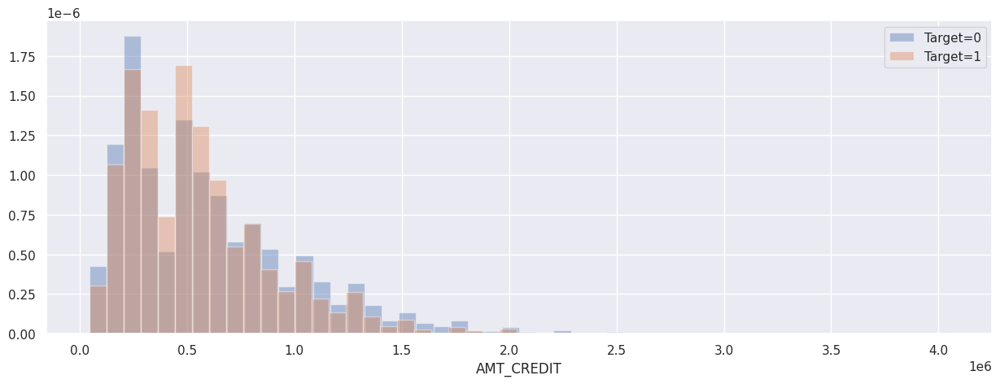

Plot of AMT_ANNUITY


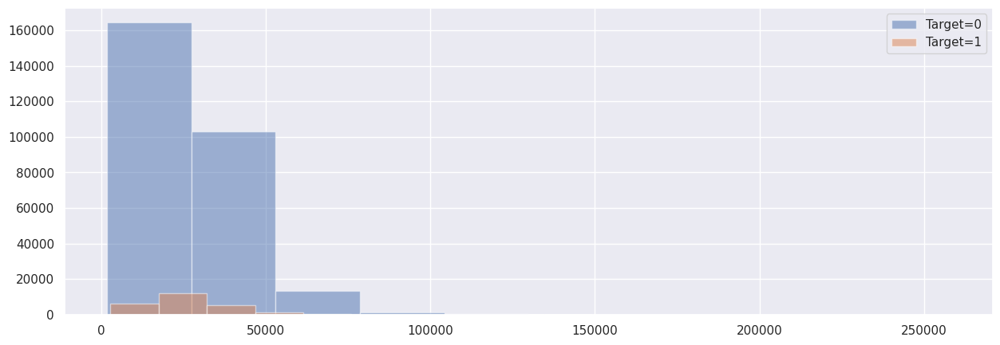

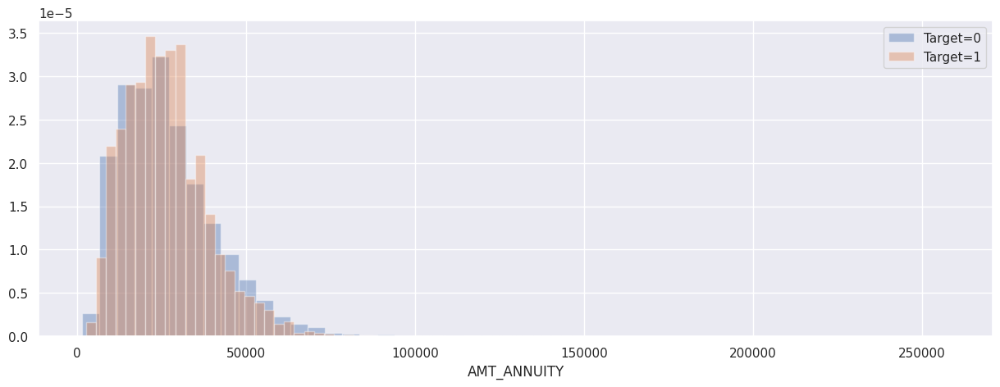

Plot of AMT_GOODS_PRICE


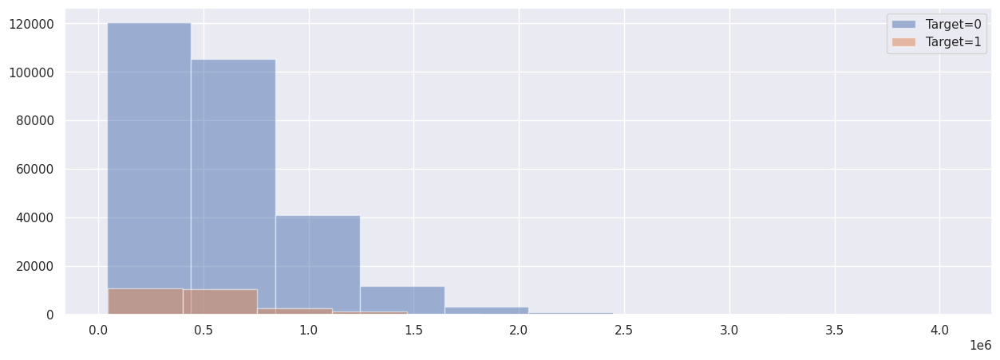

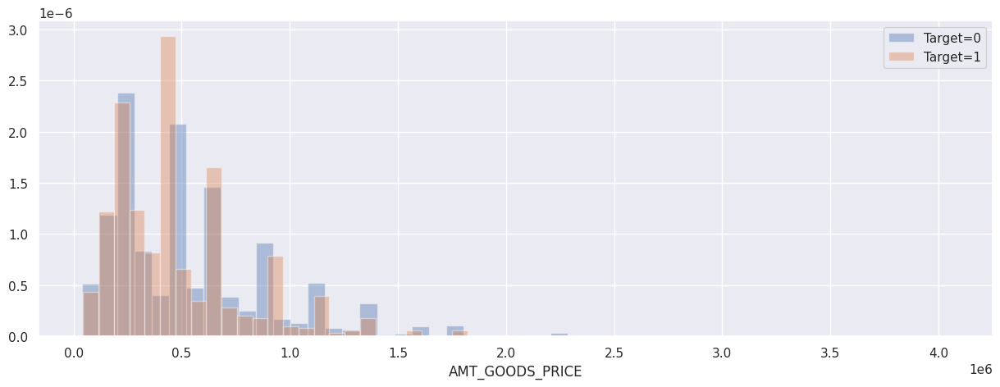

Plot of REGION_POPULATION_RELATIVE


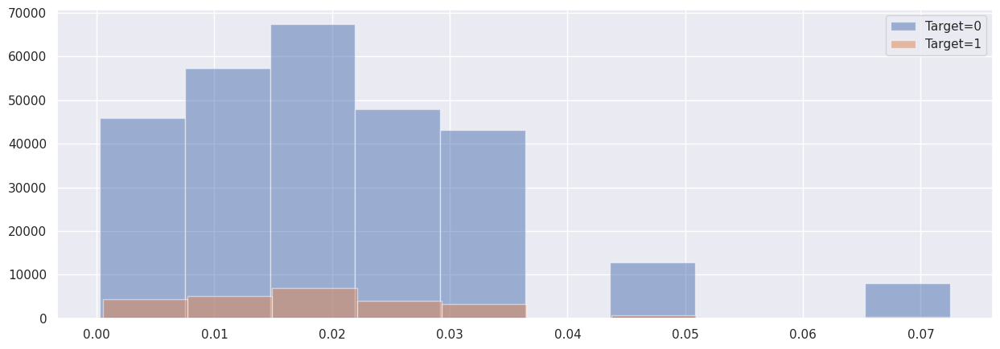

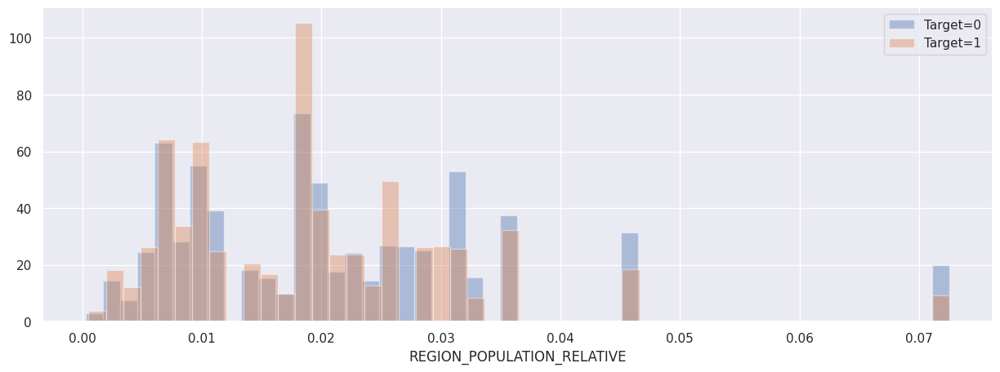

Plot of DAYS_BIRTH


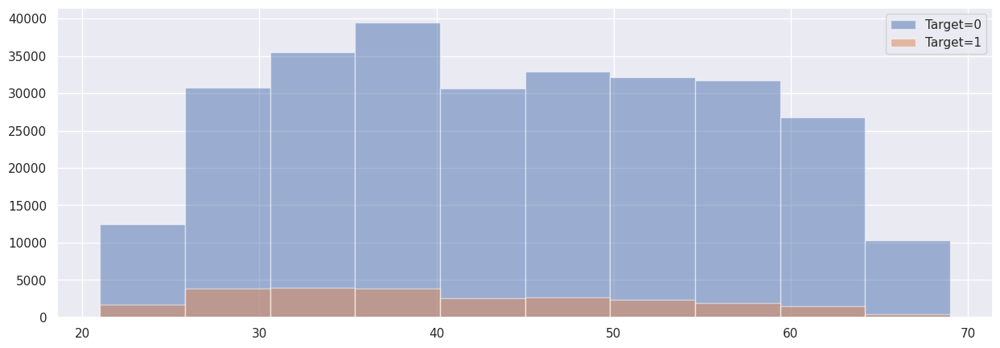

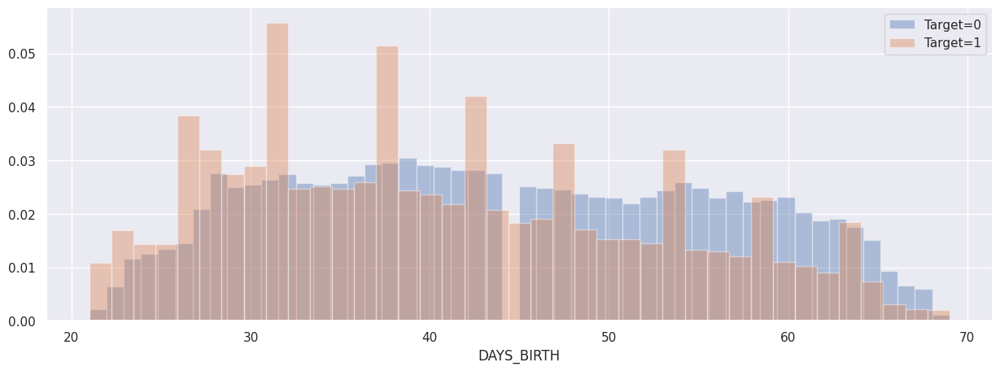

Plot of DAYS_EMPLOYED


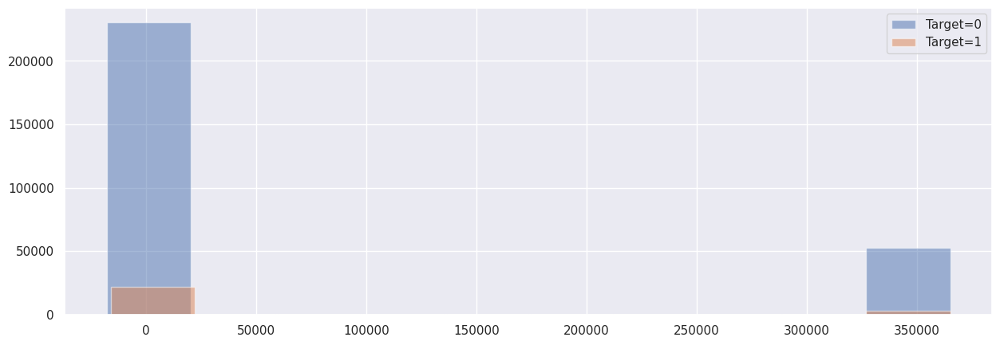

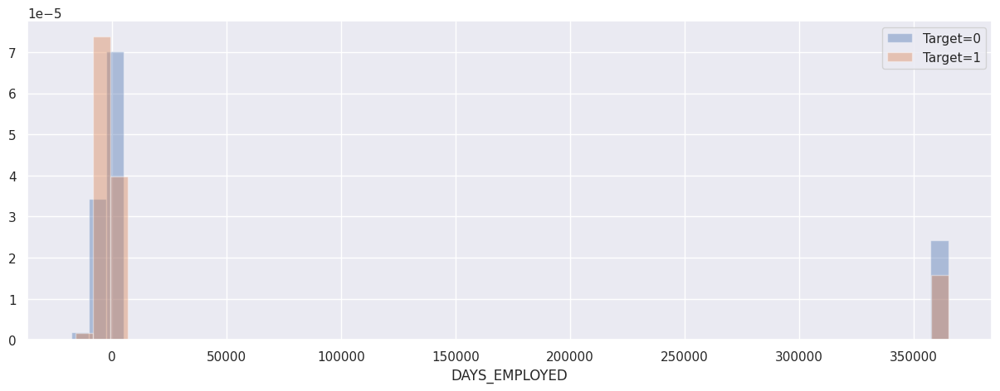

Plot of DAYS_REGISTRATION


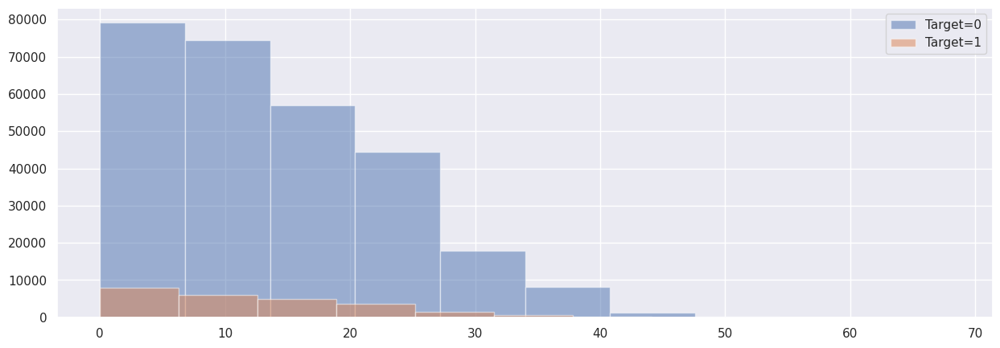

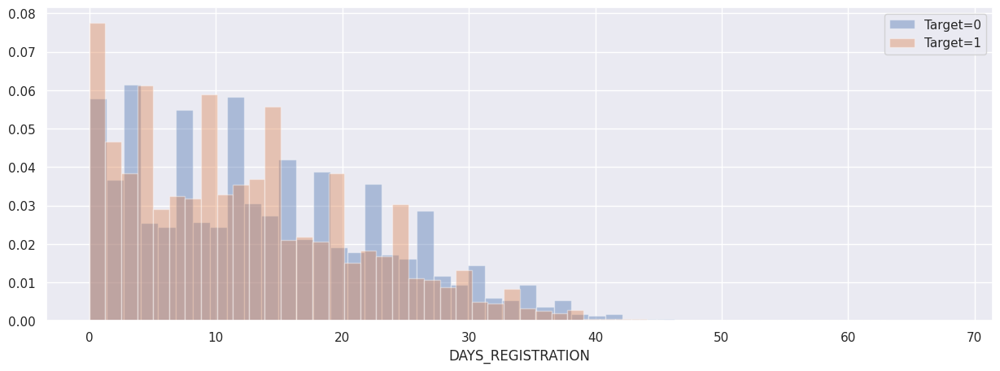

Plot of DAYS_ID_PUBLISH


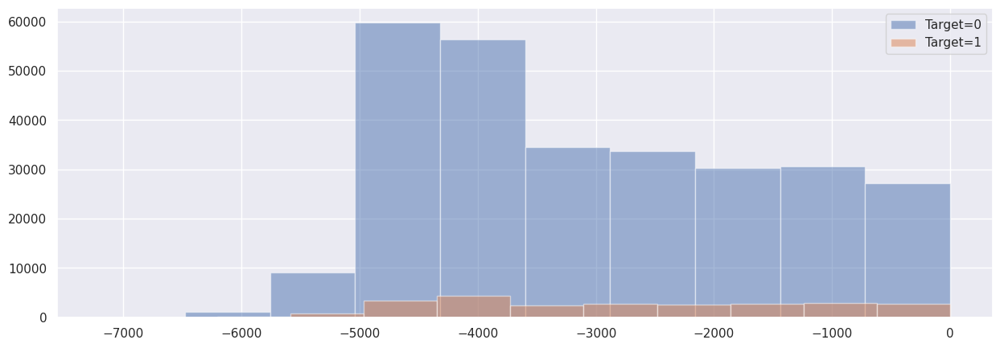

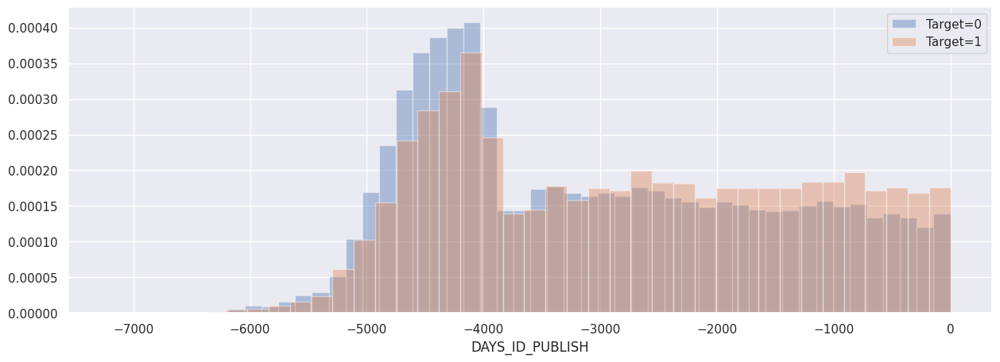

Plot of FLAG_MOBIL


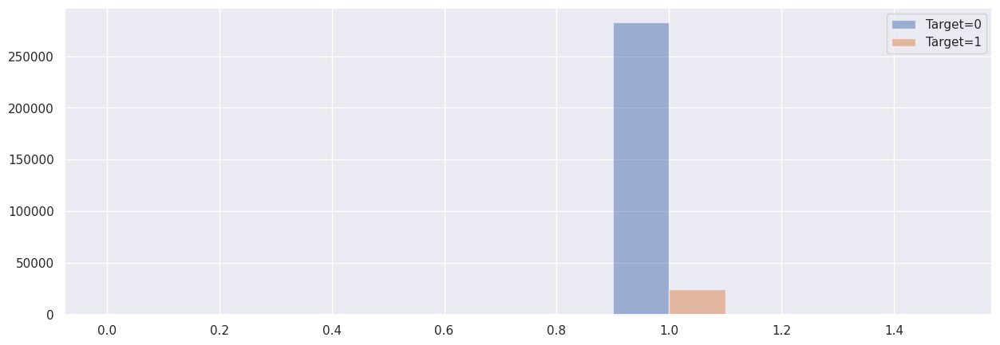

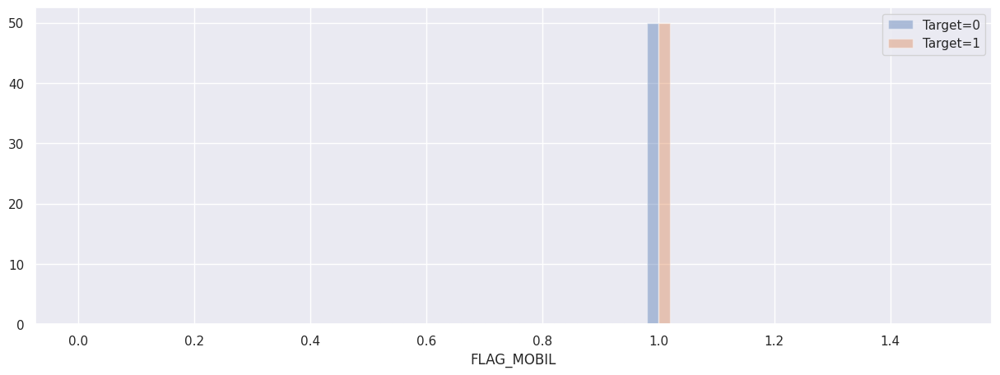

Plot of FLAG_EMP_PHONE


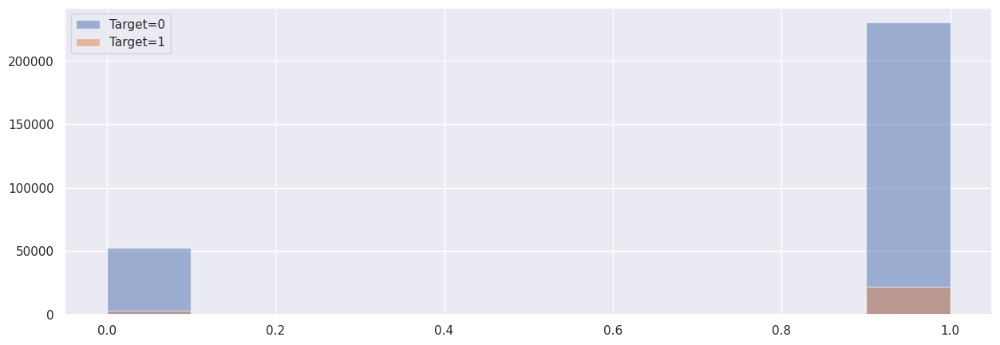

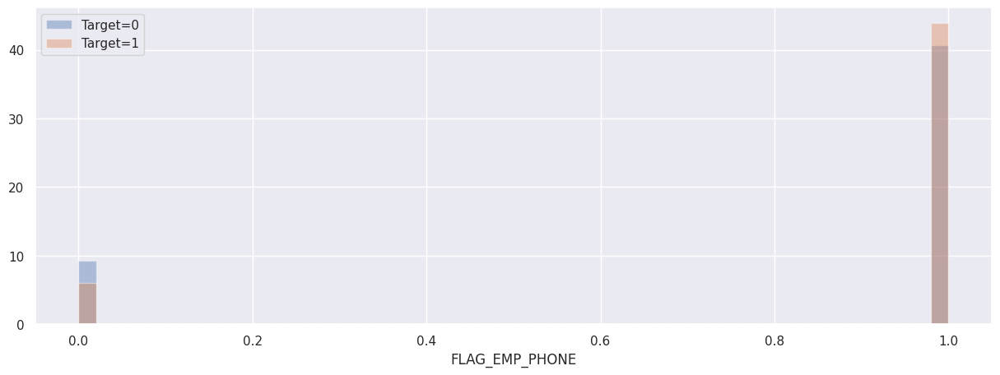

Plot of FLAG_WORK_PHONE


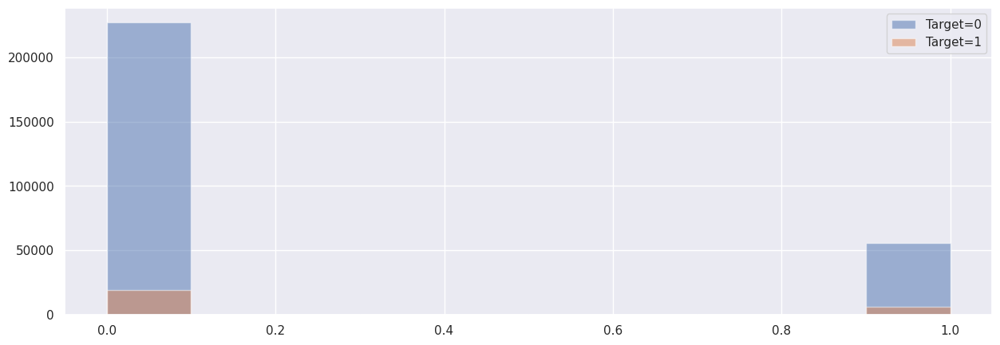

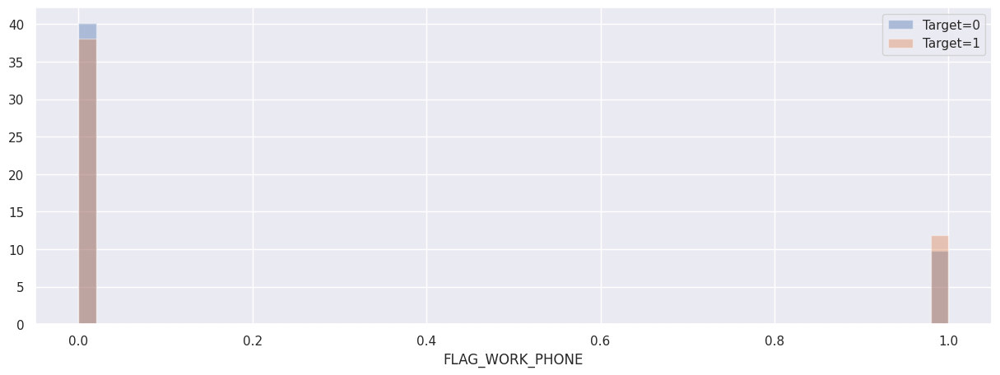

Plot of FLAG_CONT_MOBILE


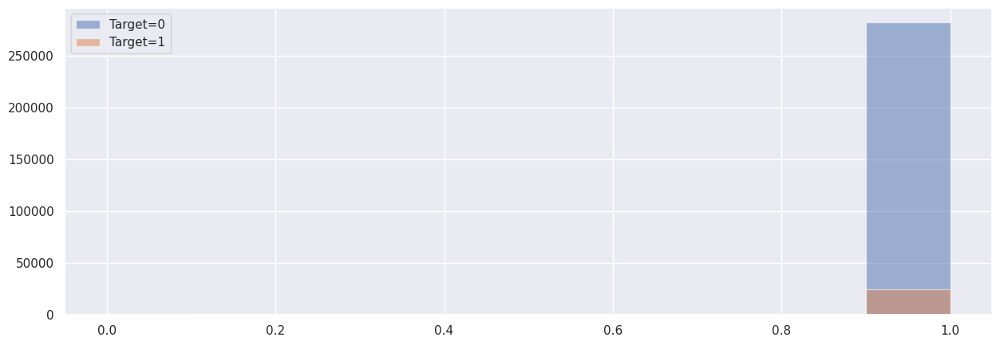

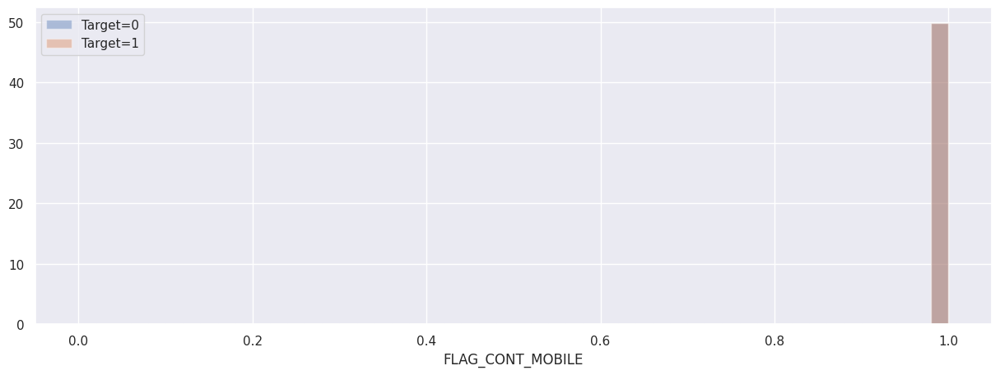

Plot of FLAG_PHONE


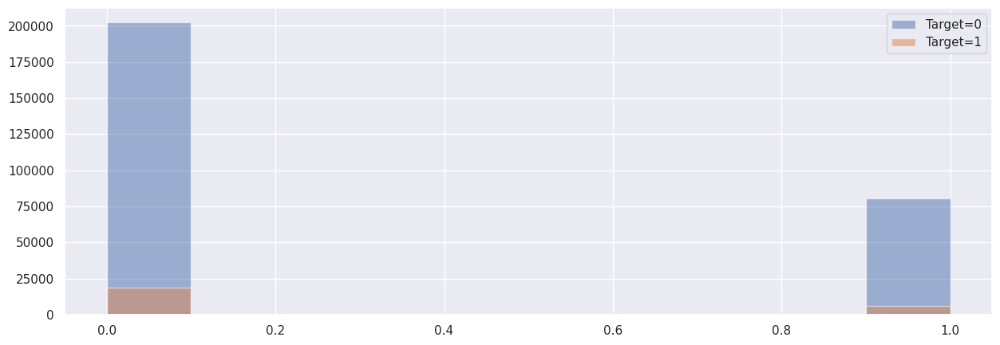

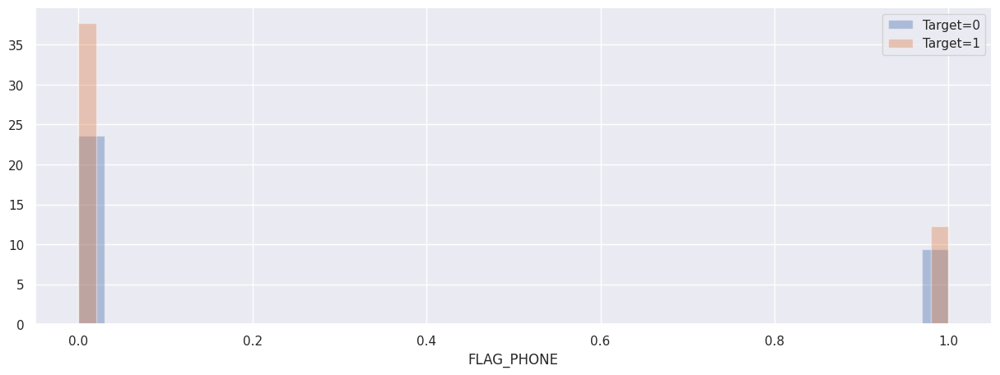

Plot of FLAG_EMAIL


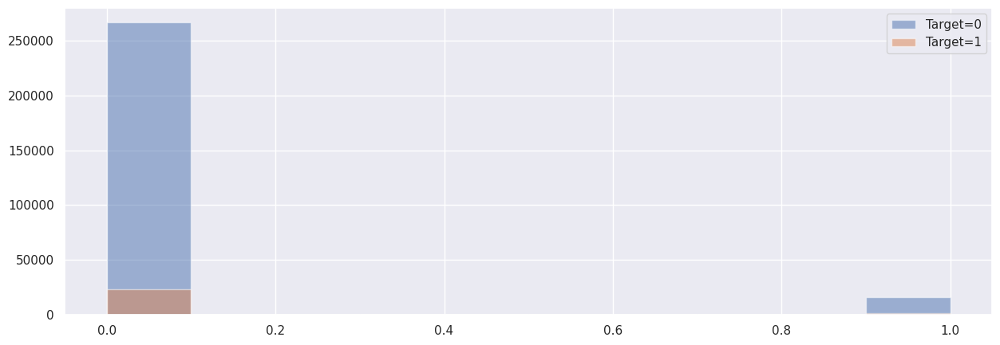

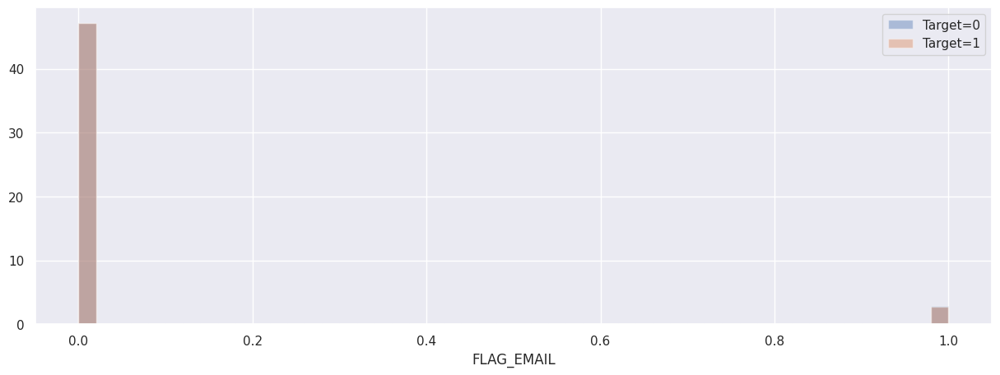

Plot of CNT_FAM_MEMBERS


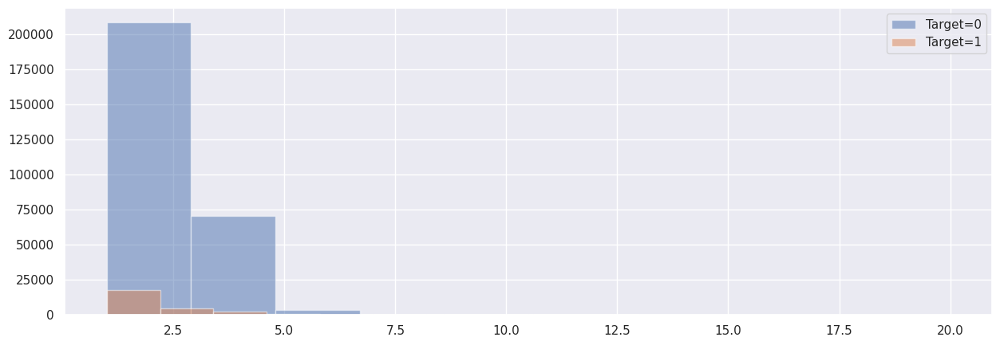

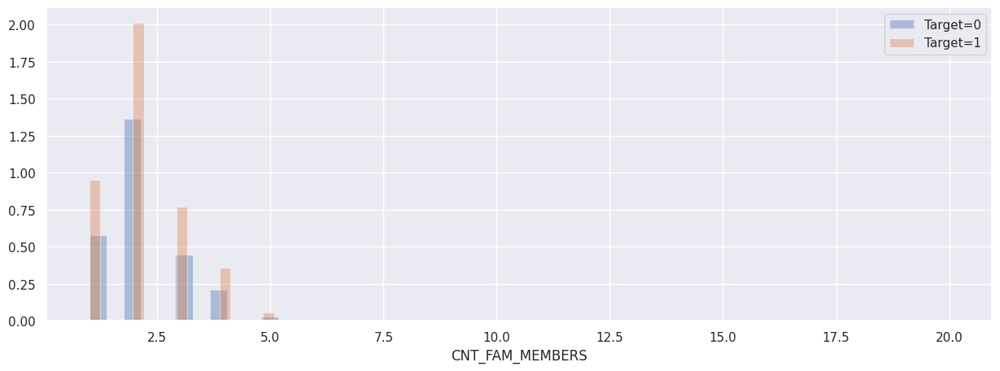

Plot of REGION_RATING_CLIENT


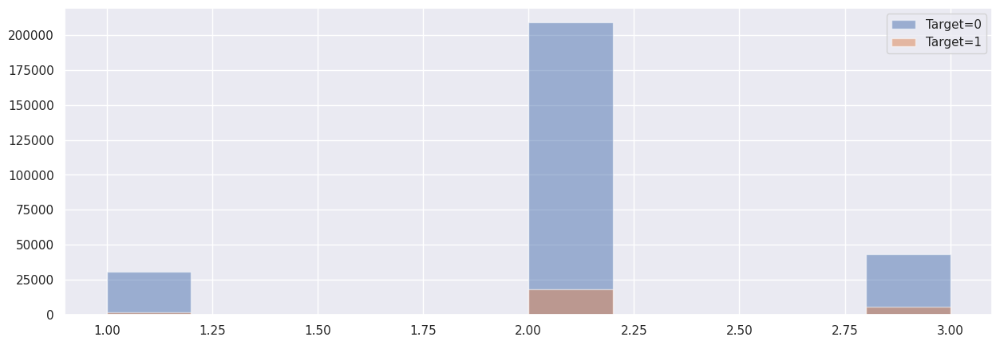

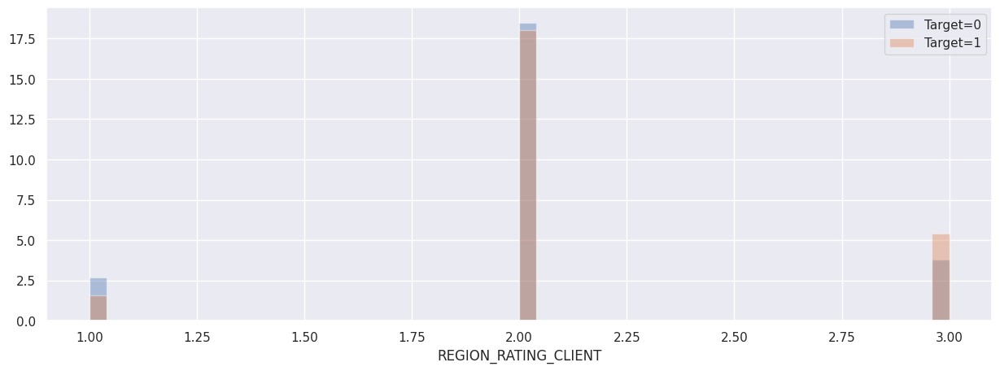

Plot of REGION_RATING_CLIENT_W_CITY


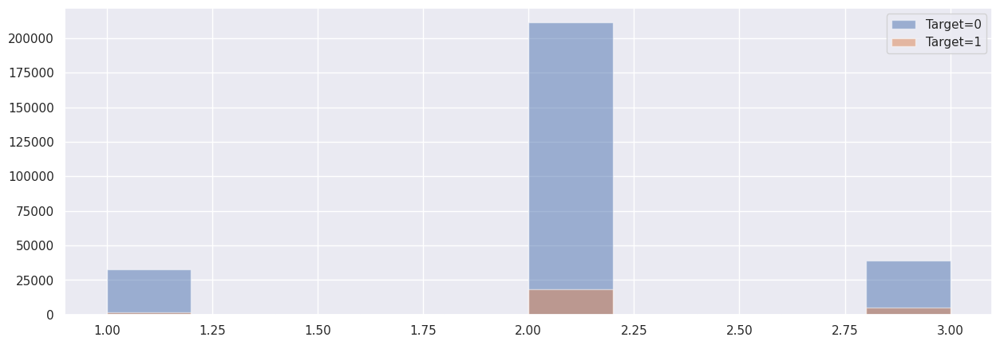

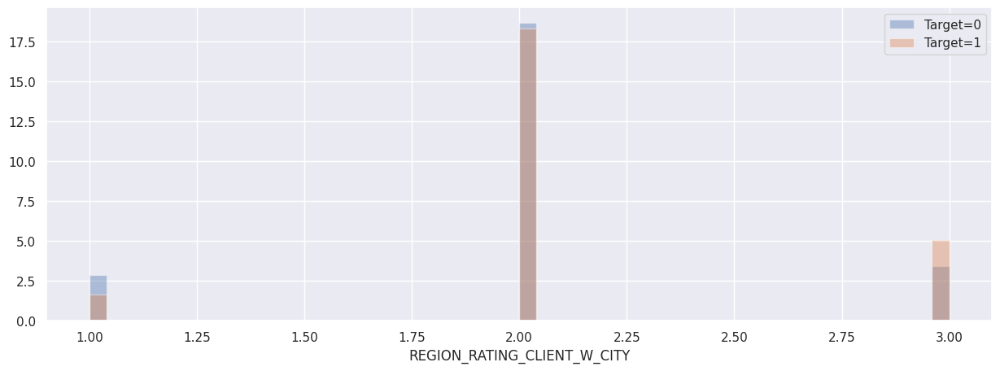

Plot of HOUR_APPR_PROCESS_START


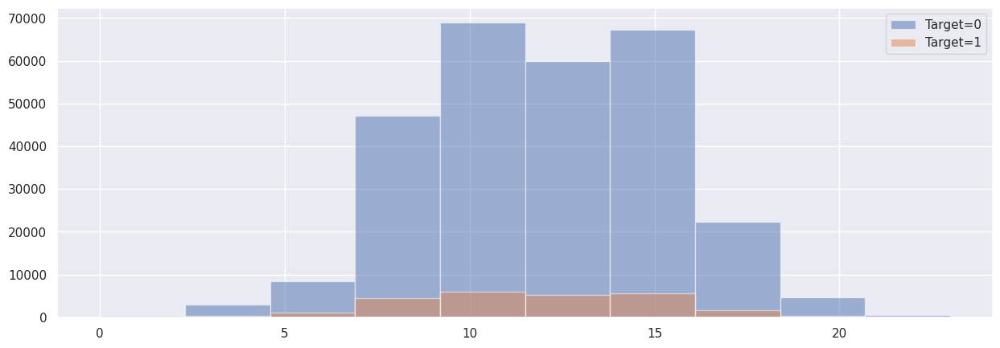

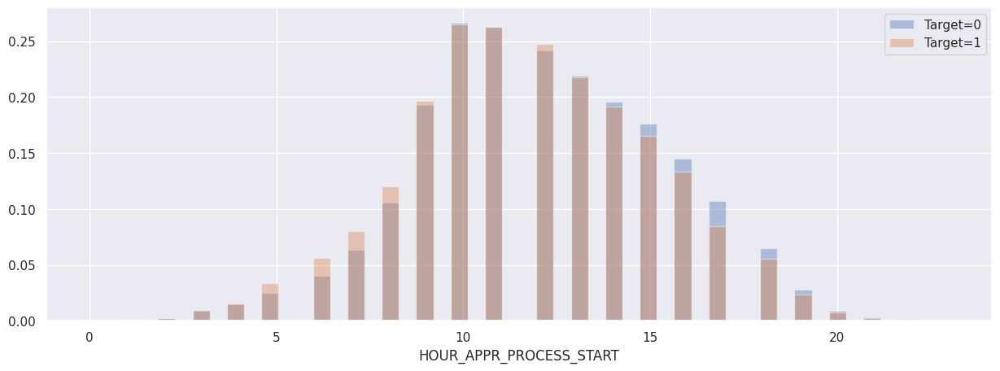

Plot of REG_REGION_NOT_LIVE_REGION


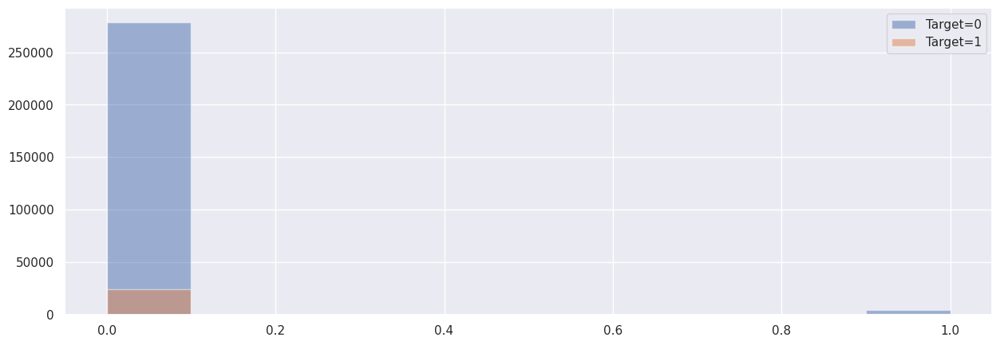

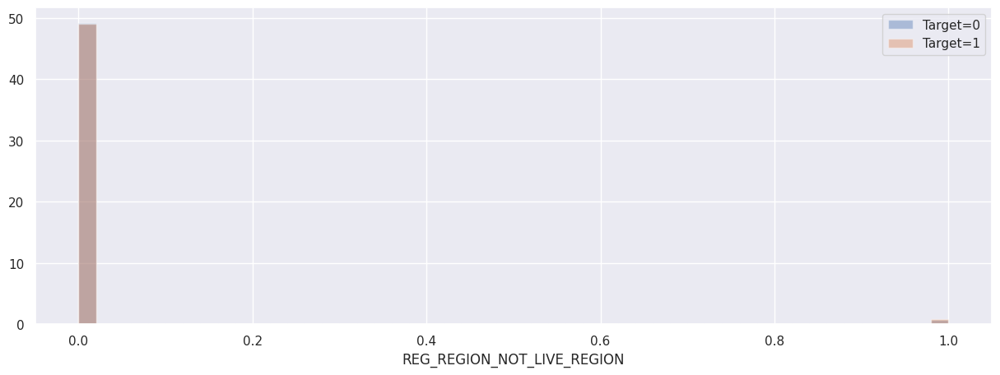

Plot of REG_REGION_NOT_WORK_REGION


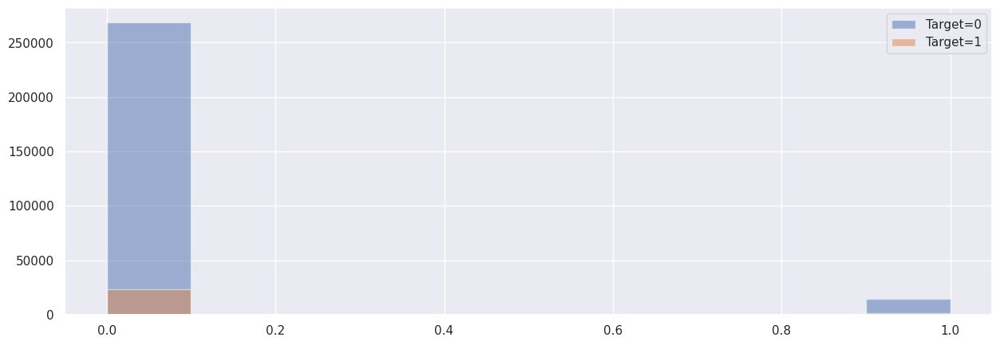

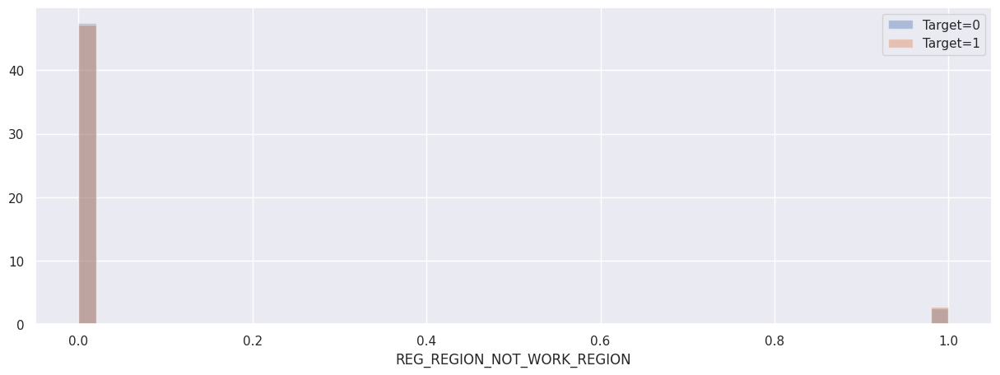

Plot of LIVE_REGION_NOT_WORK_REGION


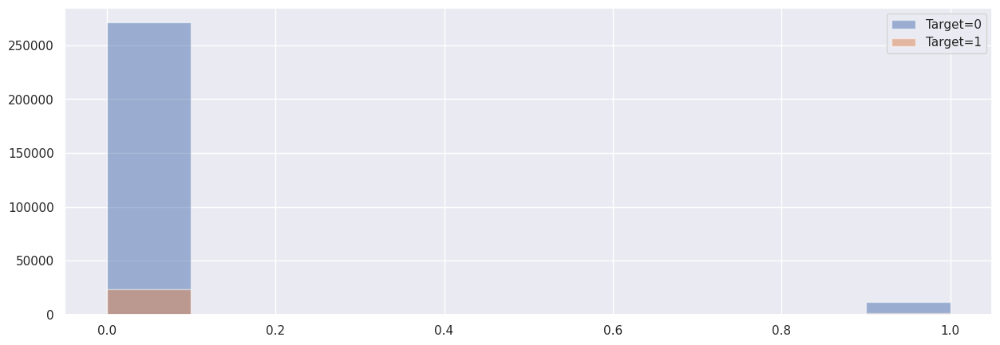

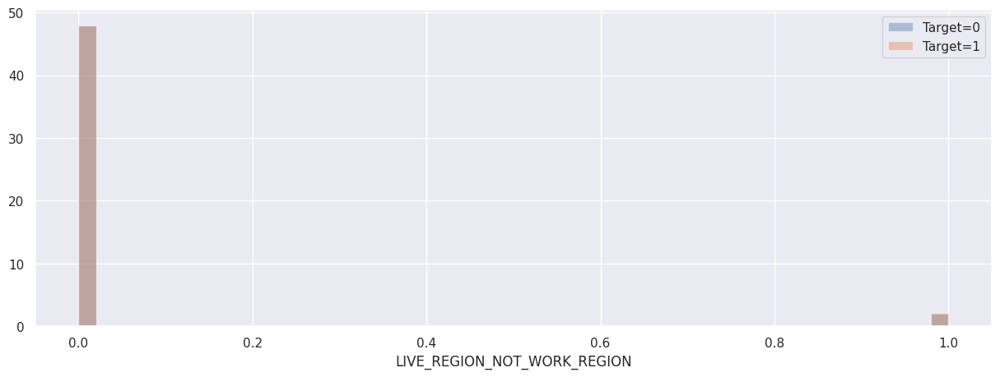

Plot of REG_CITY_NOT_LIVE_CITY


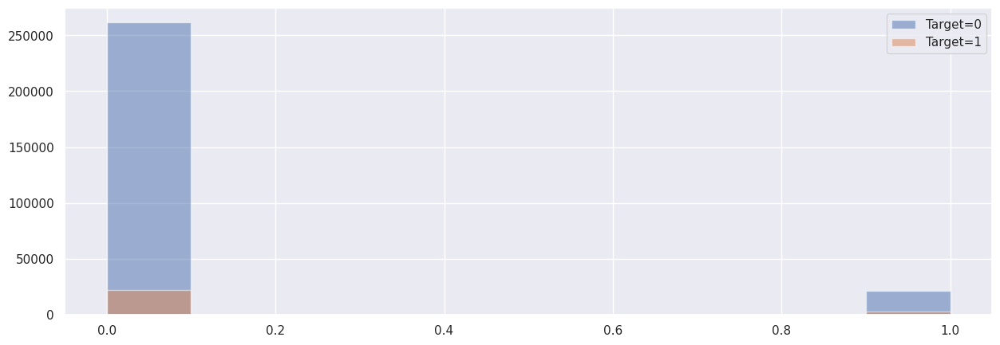

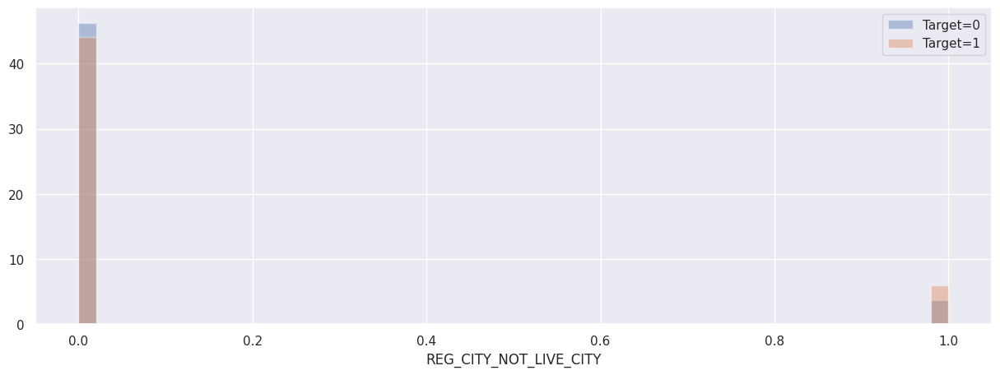

Plot of REG_CITY_NOT_WORK_CITY


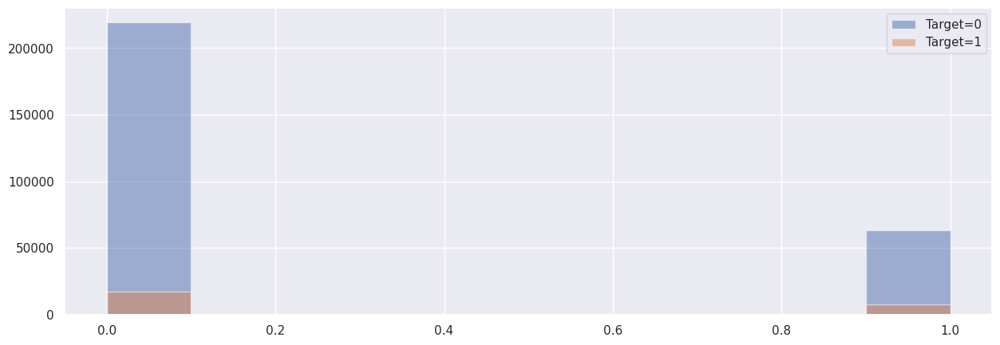

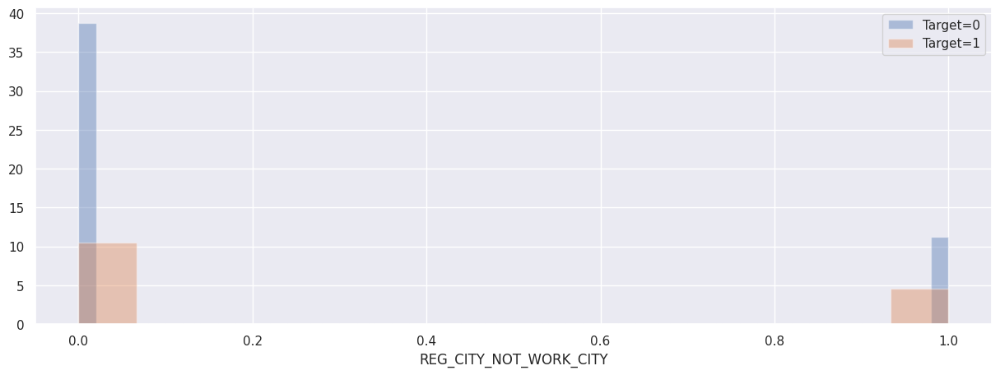

Plot of LIVE_CITY_NOT_WORK_CITY


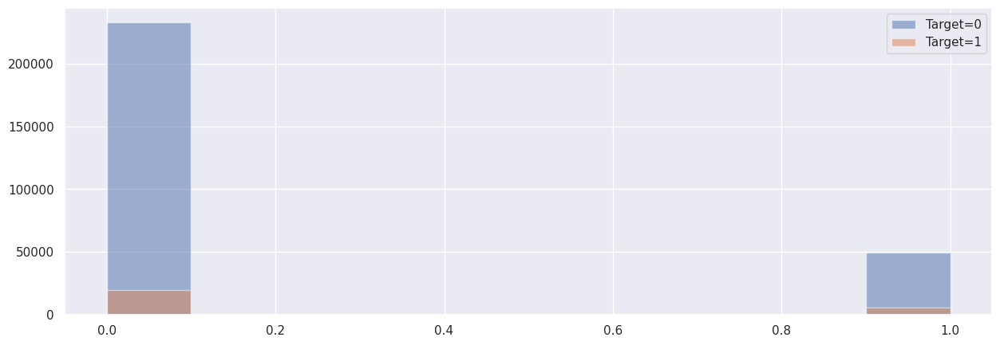

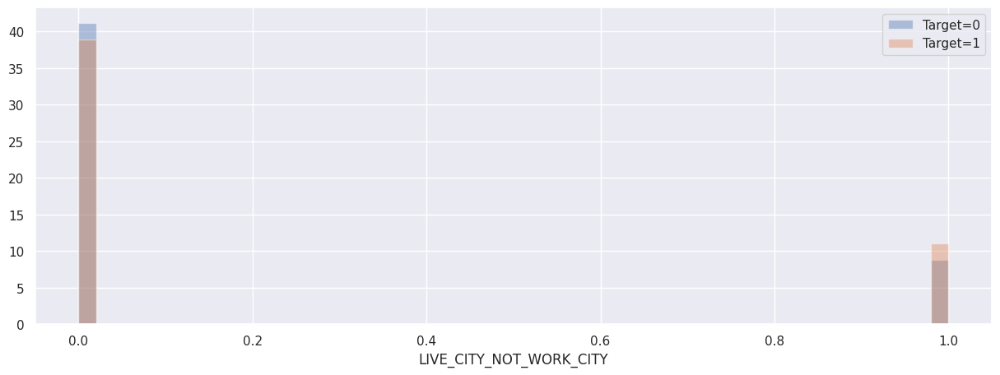

Plot of EXT_SOURCE_2


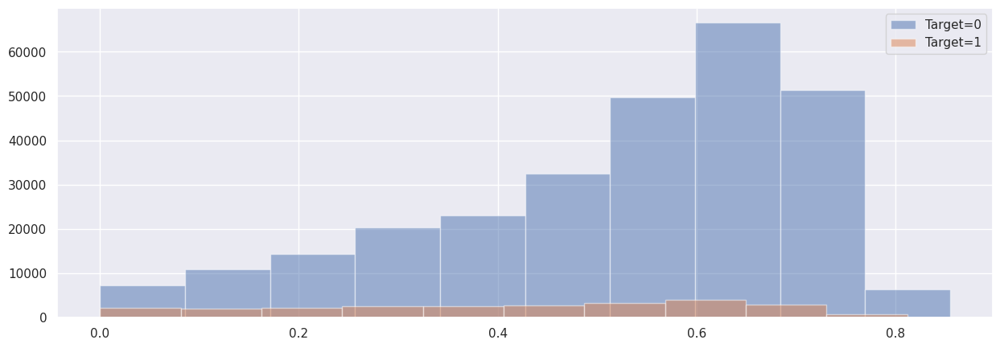

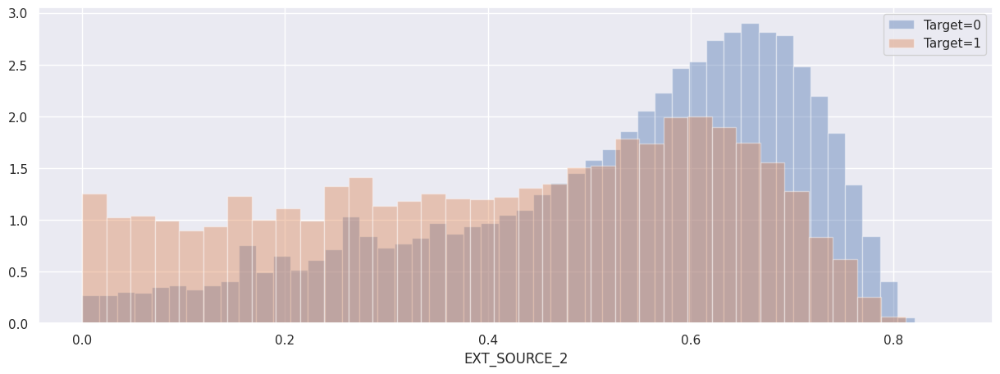

Plot of EXT_SOURCE_3


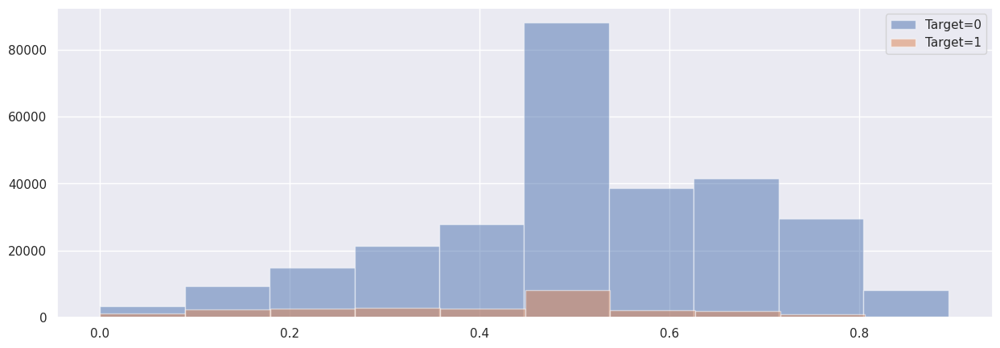

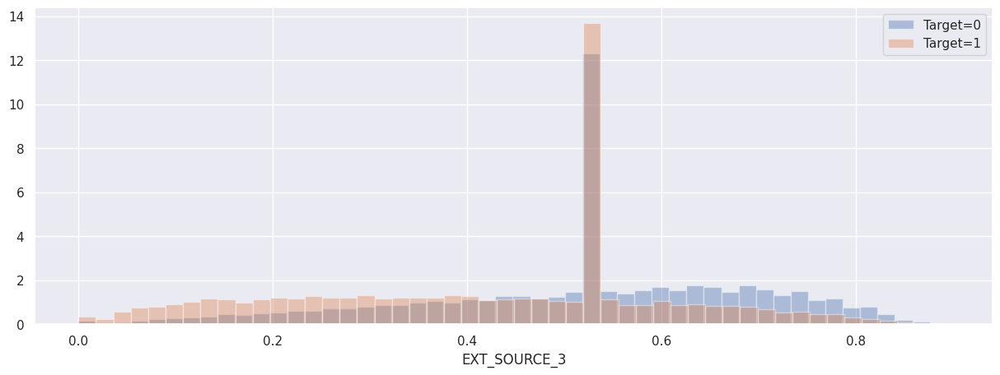

Plot of YEARS_BEGINEXPLUATATION_AVG


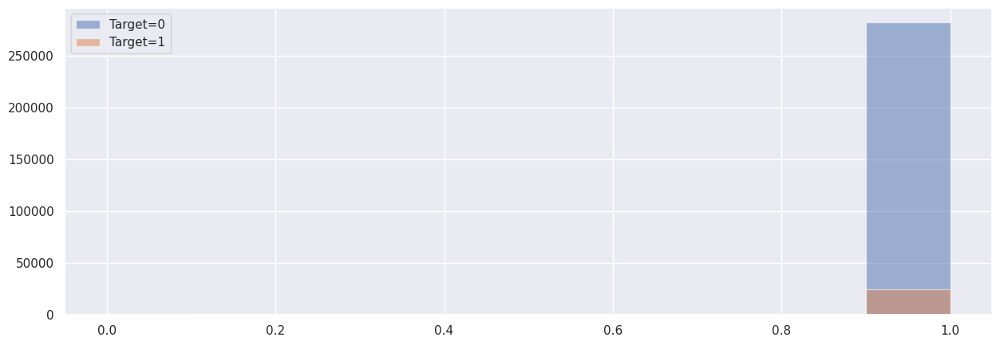

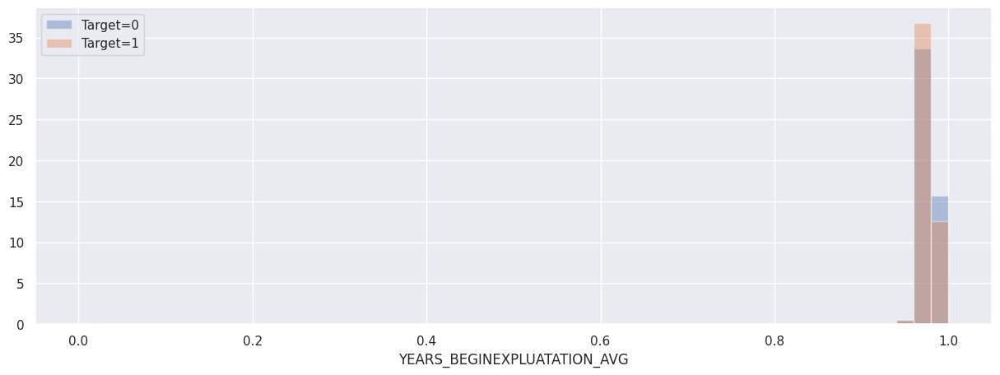

Plot of FLOORSMAX_AVG


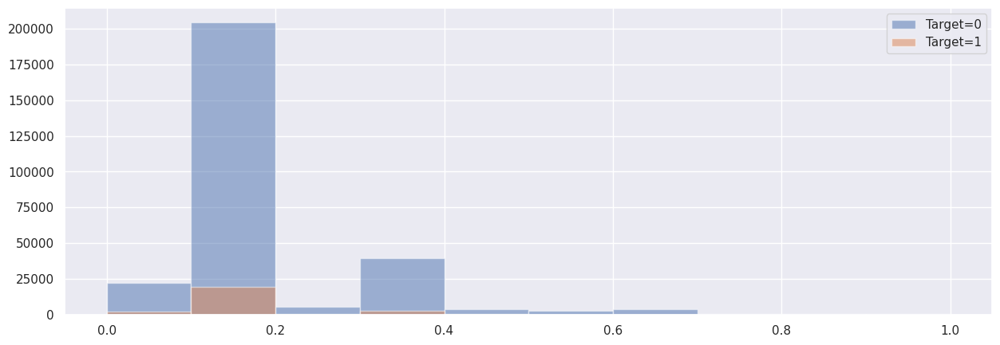

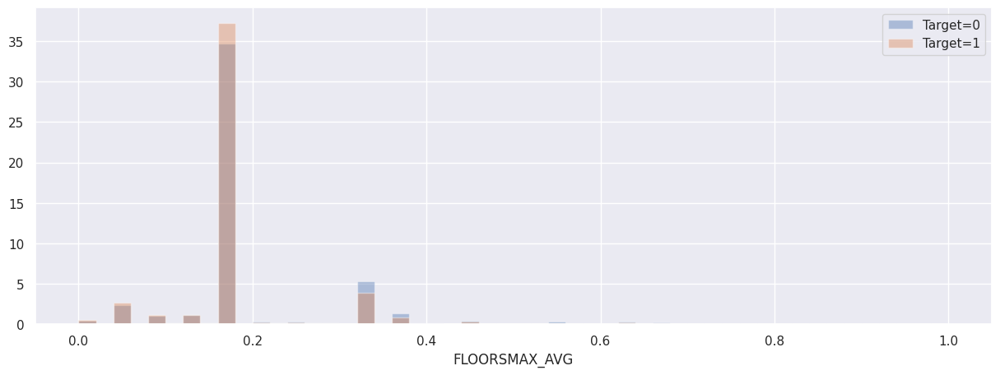

Plot of YEARS_BEGINEXPLUATATION_MODE


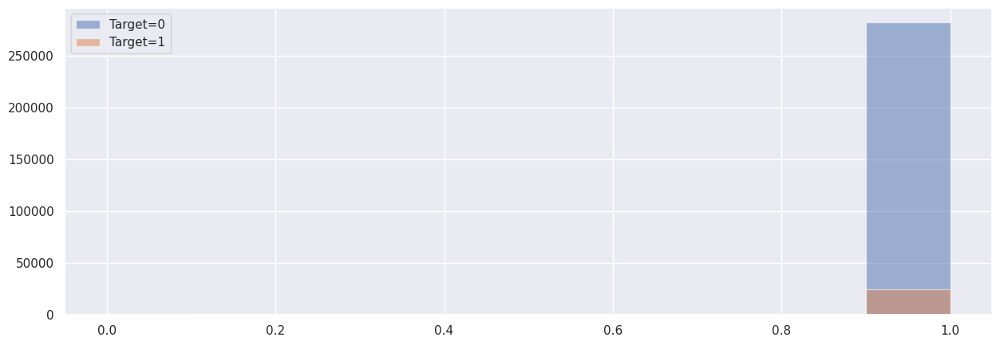

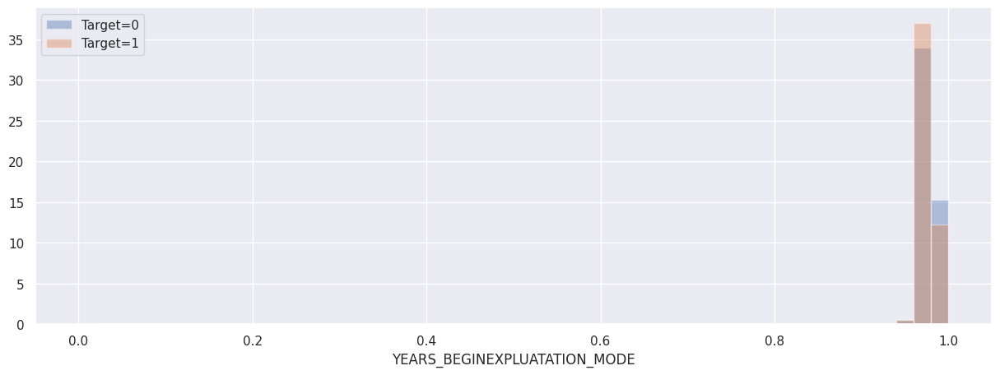

Plot of FLOORSMAX_MODE


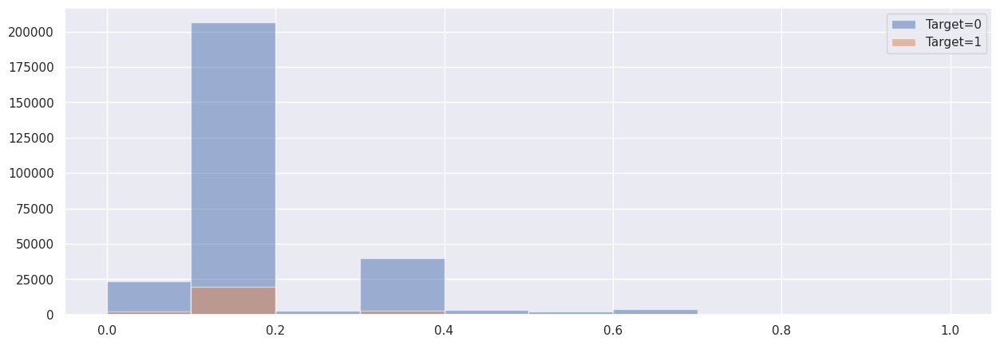

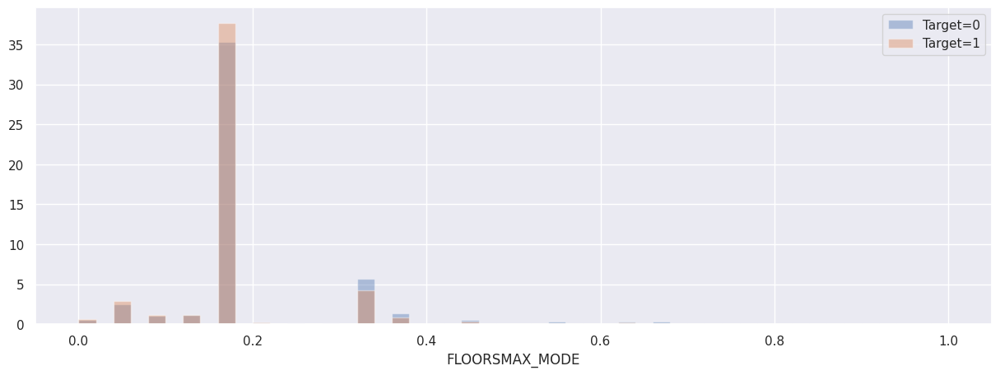

Plot of YEARS_BEGINEXPLUATATION_MEDI


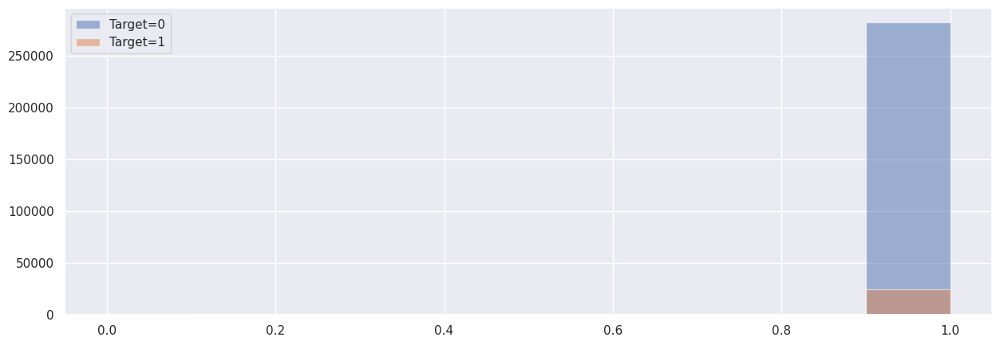

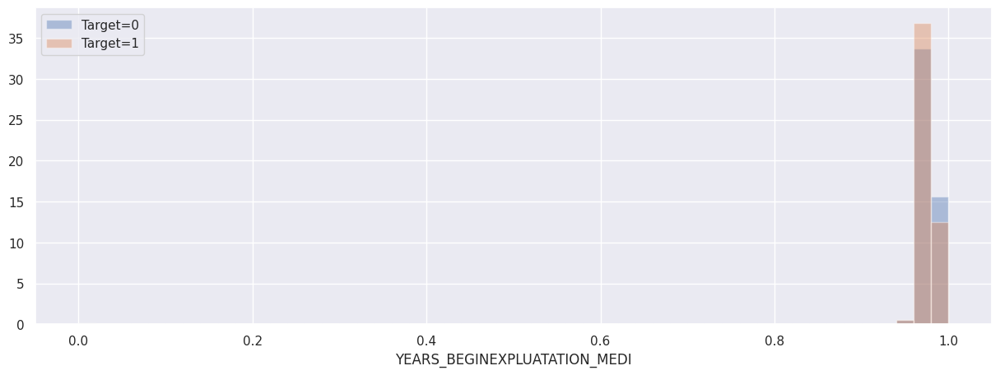

Plot of FLOORSMAX_MEDI


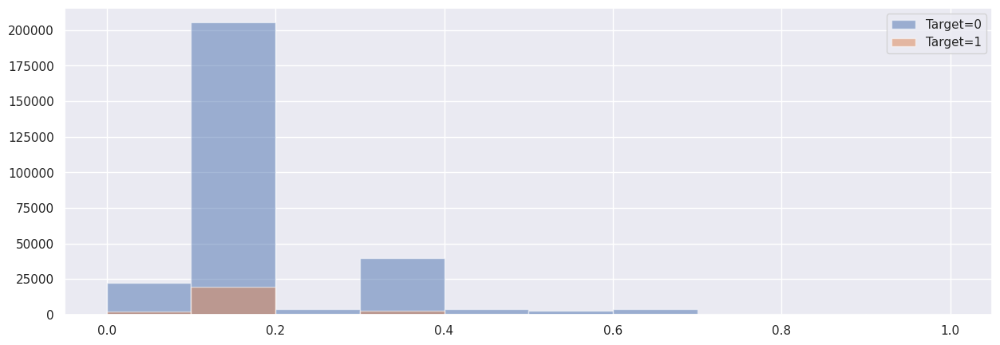

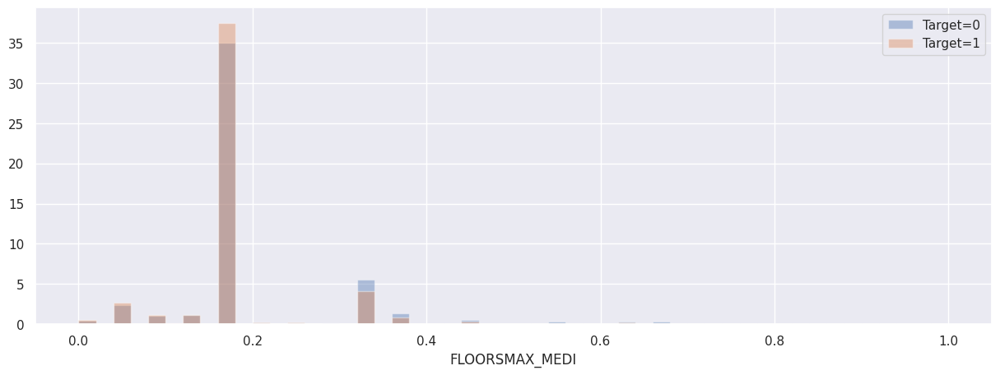

Plot of TOTALAREA_MODE


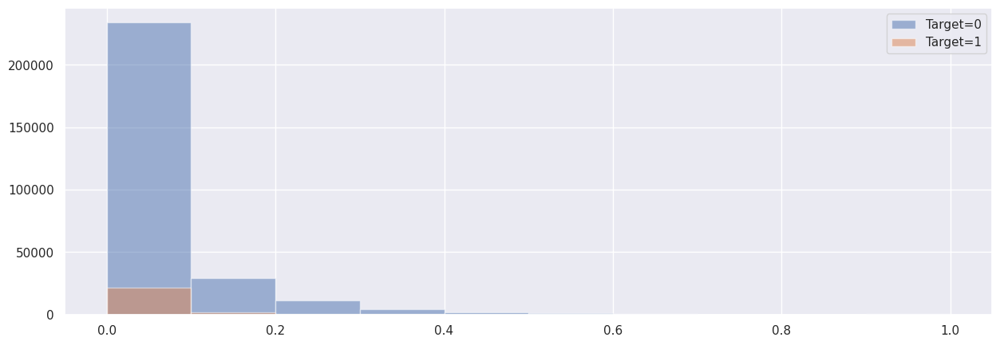

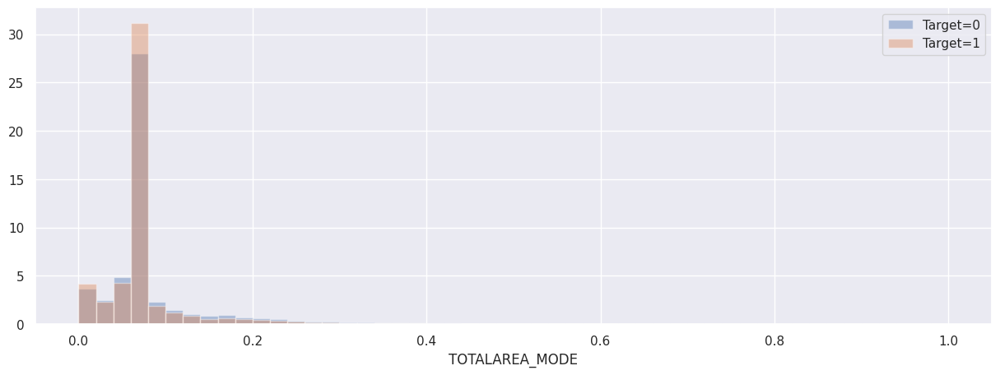

Plot of OBS_30_CNT_SOCIAL_CIRCLE


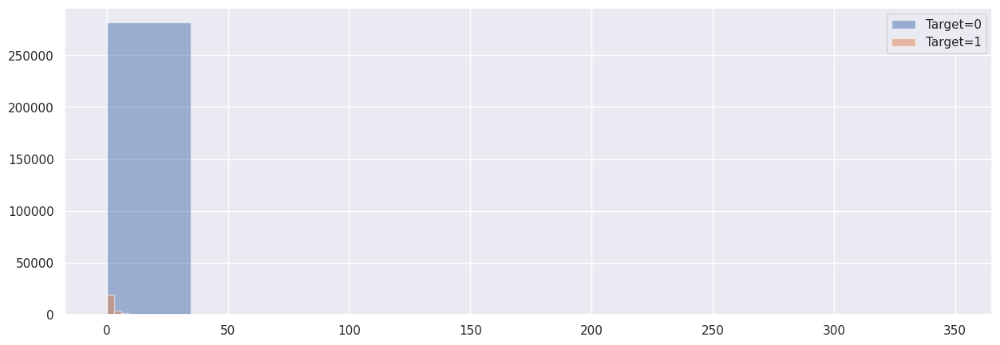

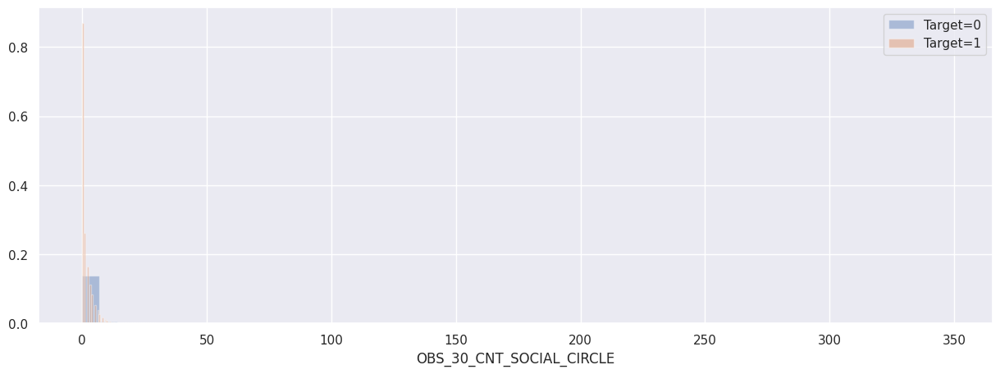

Plot of DEF_30_CNT_SOCIAL_CIRCLE


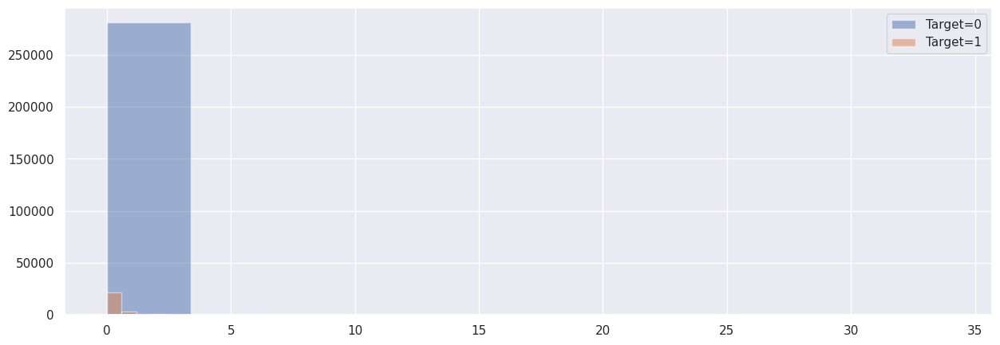

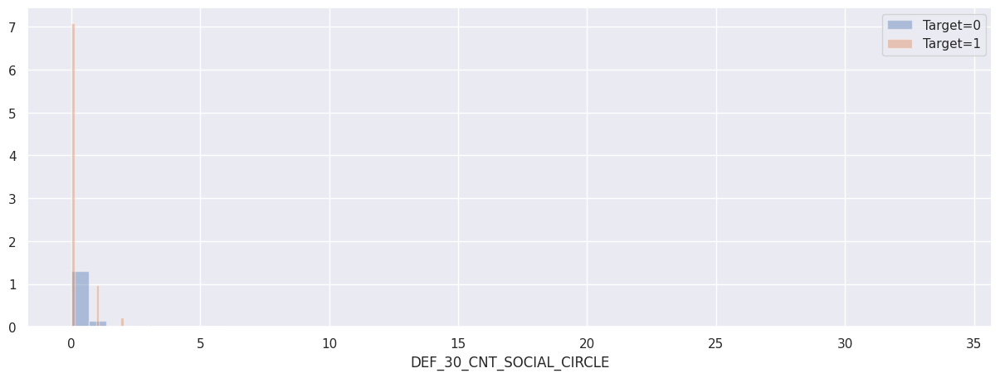

Plot of OBS_60_CNT_SOCIAL_CIRCLE


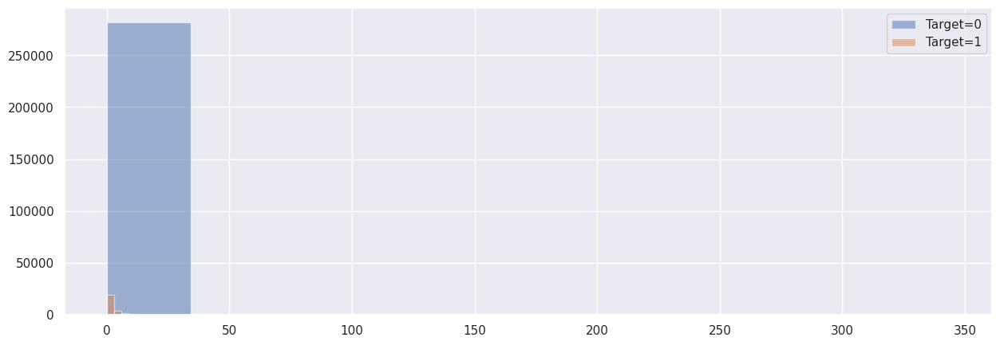

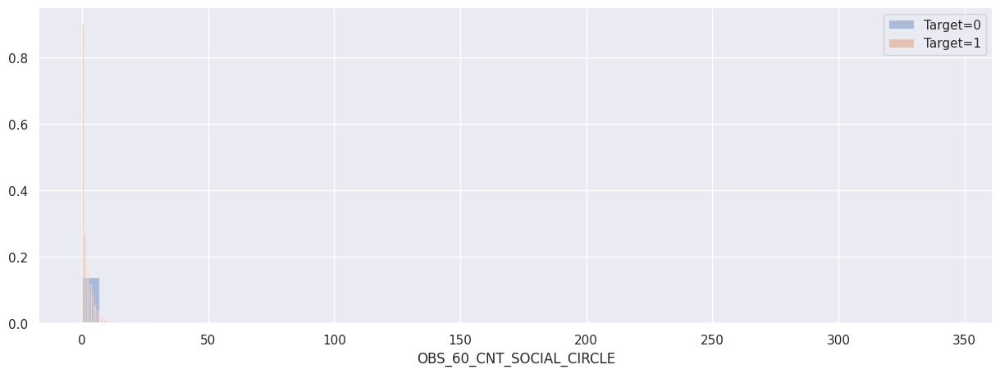

Plot of DEF_60_CNT_SOCIAL_CIRCLE


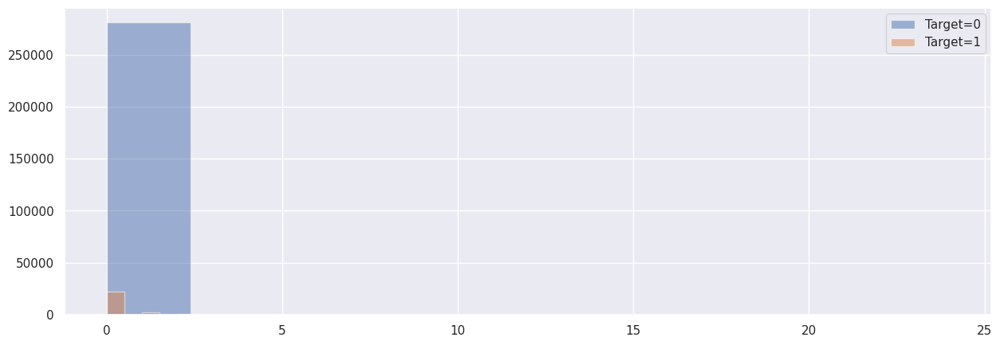

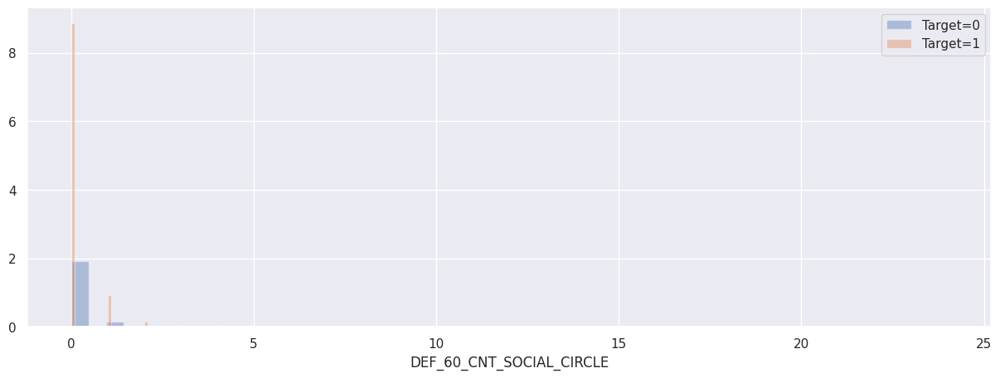

Plot of DAYS_LAST_PHONE_CHANGE


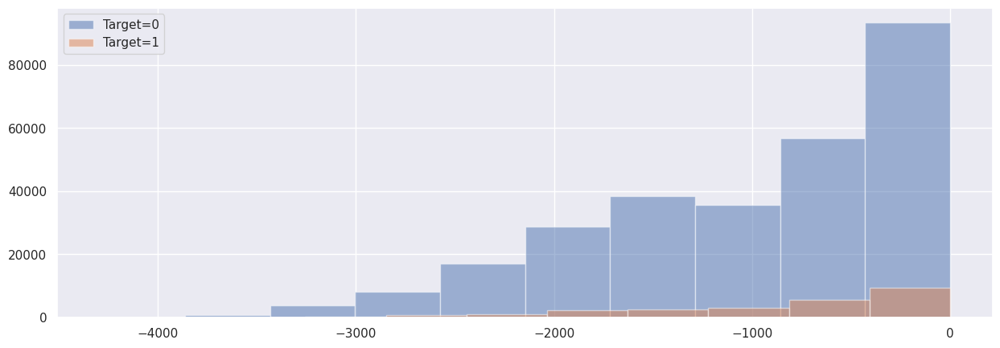

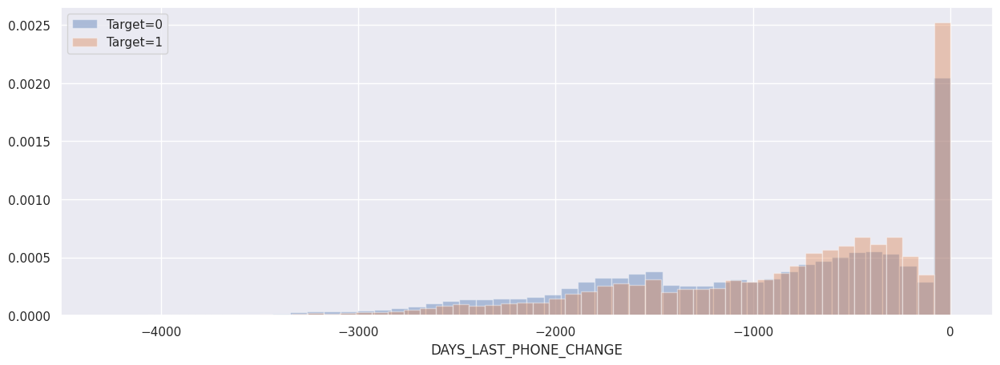

Plot of FLAG_DOCUMENT_2


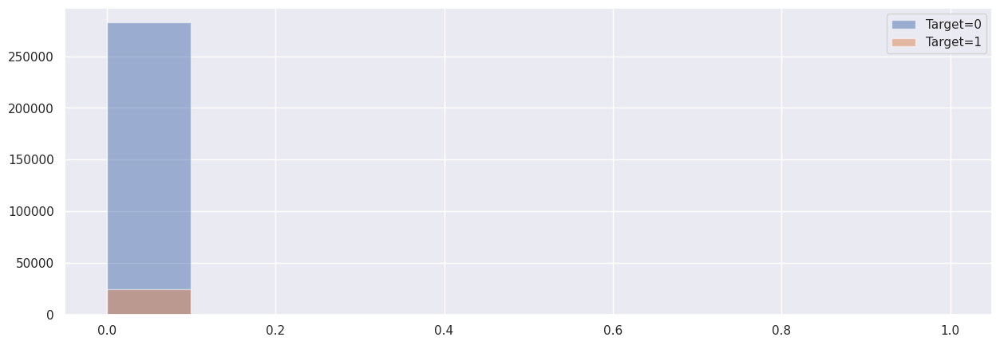

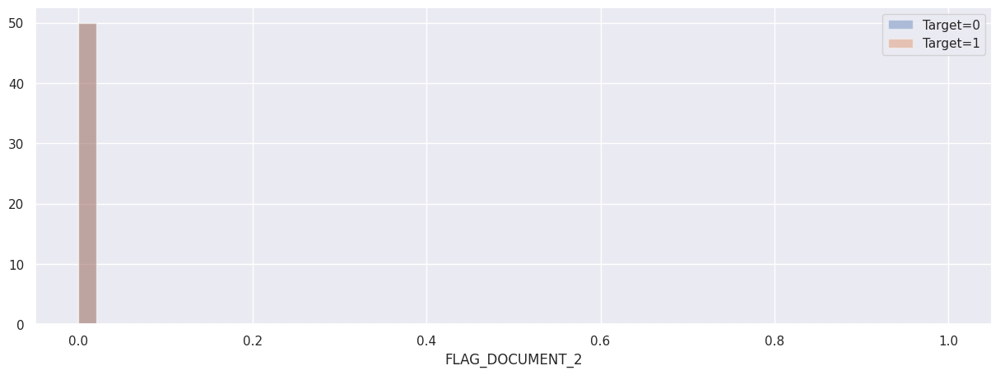

Plot of FLAG_DOCUMENT_3


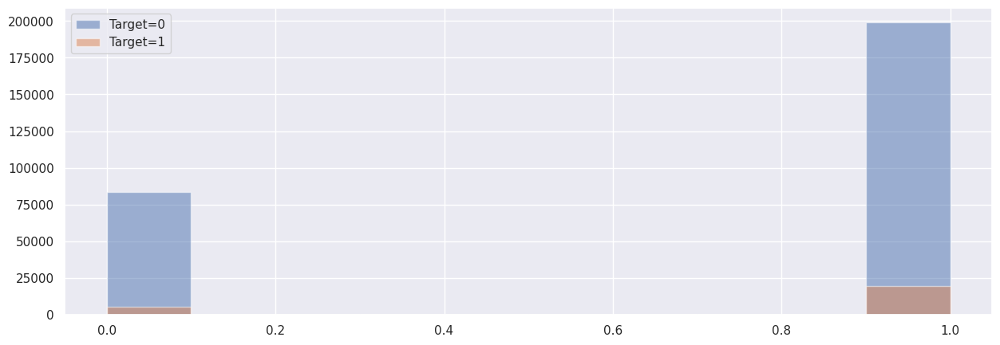

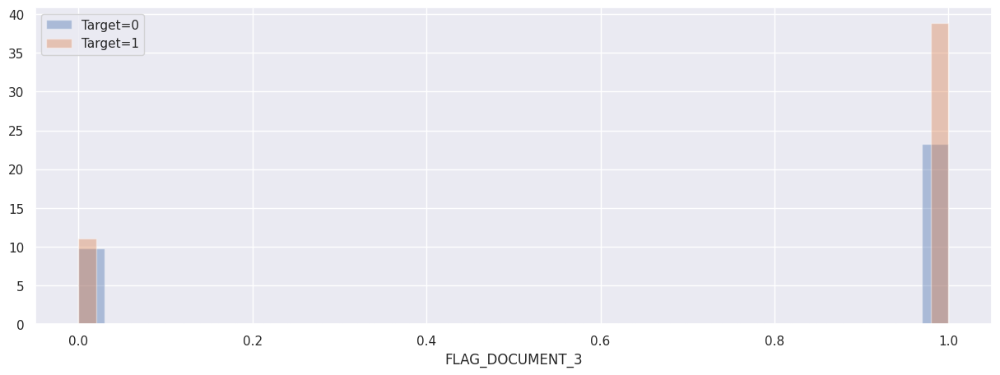

Plot of FLAG_DOCUMENT_4


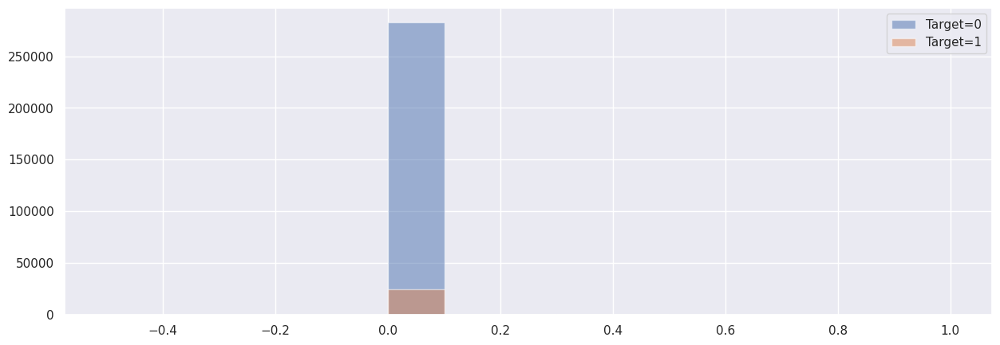

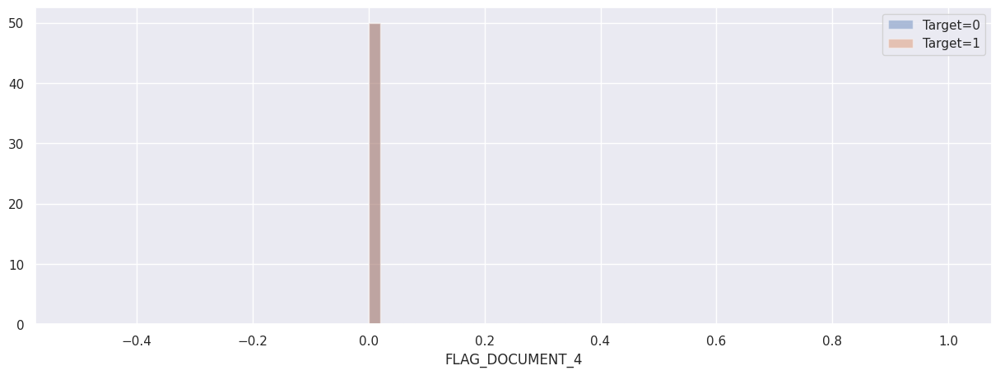

Plot of FLAG_DOCUMENT_5


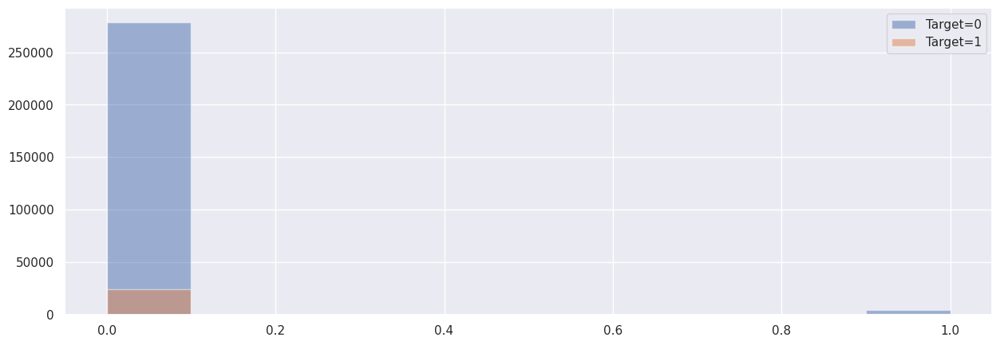

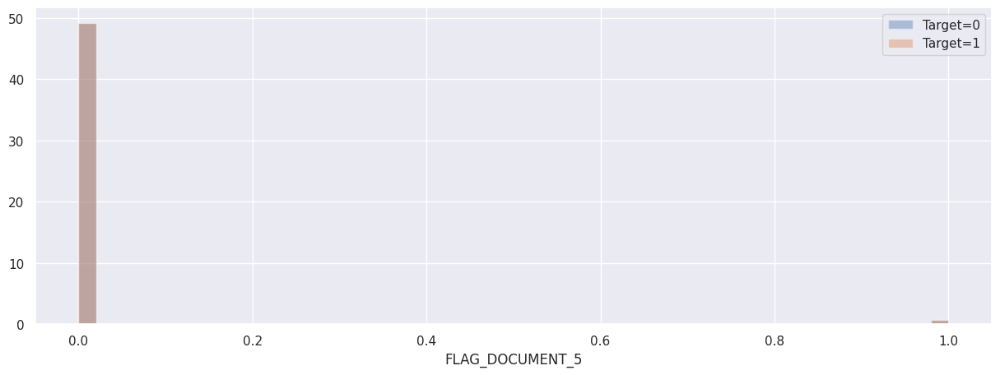

Plot of FLAG_DOCUMENT_6


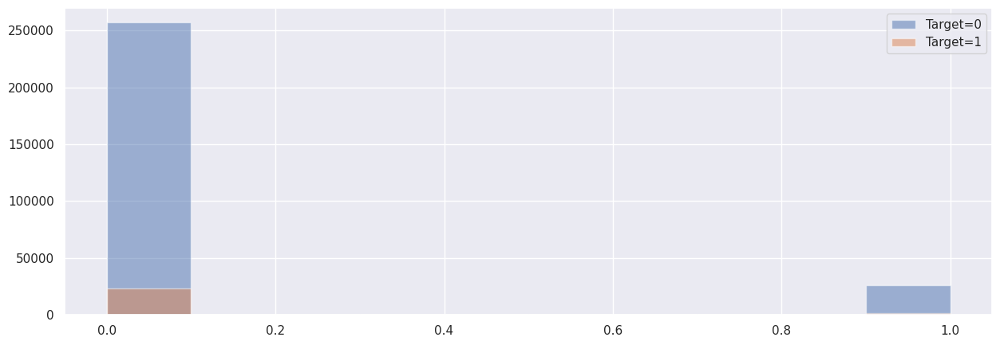

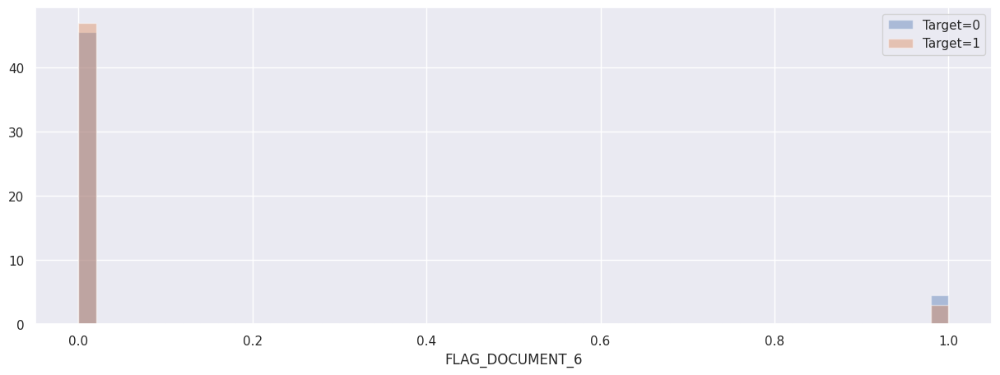

Plot of FLAG_DOCUMENT_7


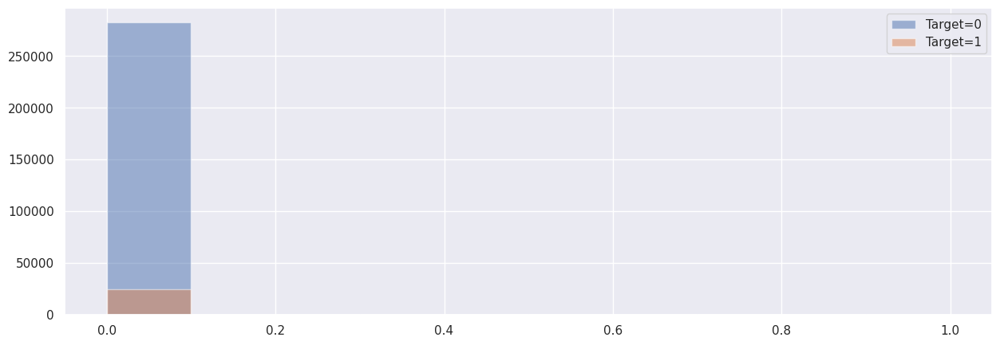

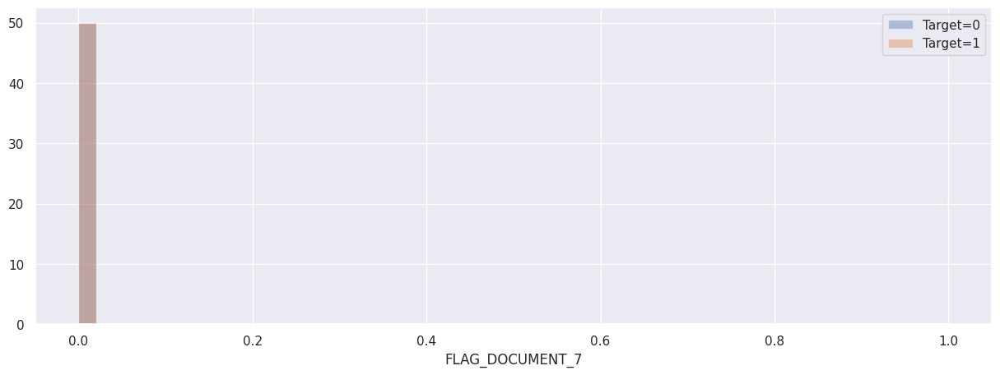

Plot of FLAG_DOCUMENT_8


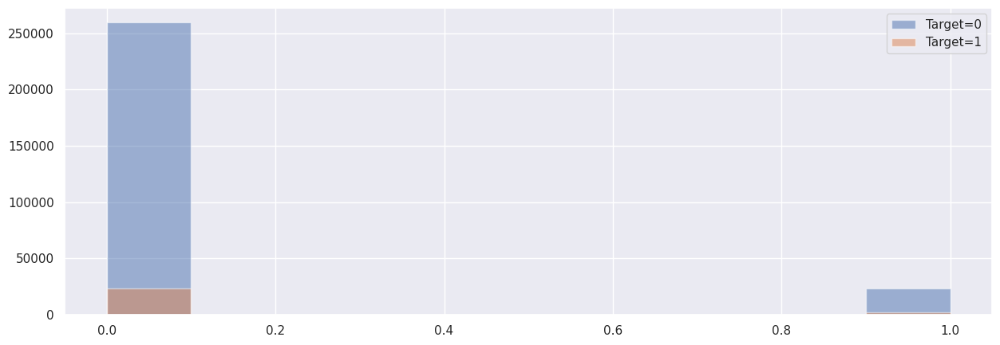

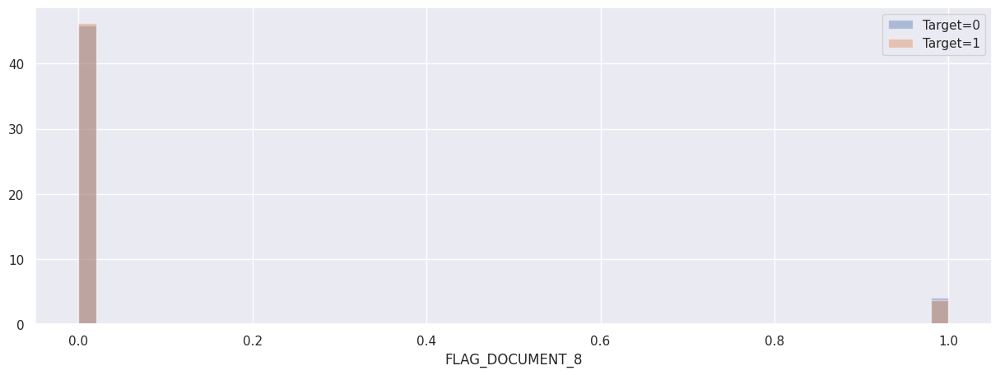

Plot of FLAG_DOCUMENT_9


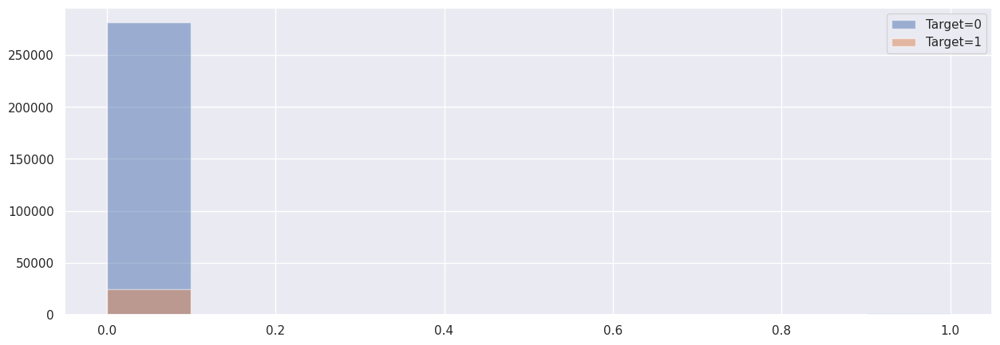

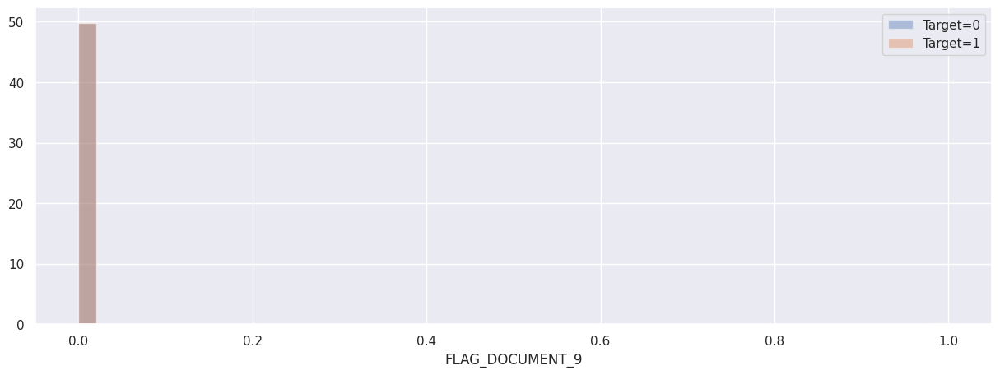

Plot of FLAG_DOCUMENT_10


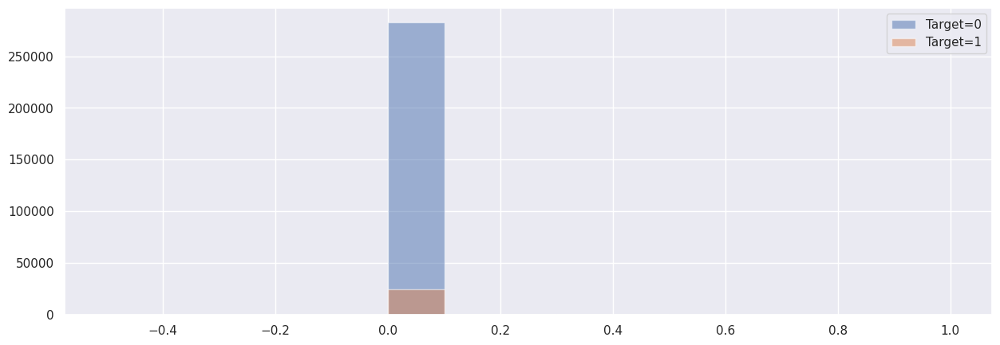

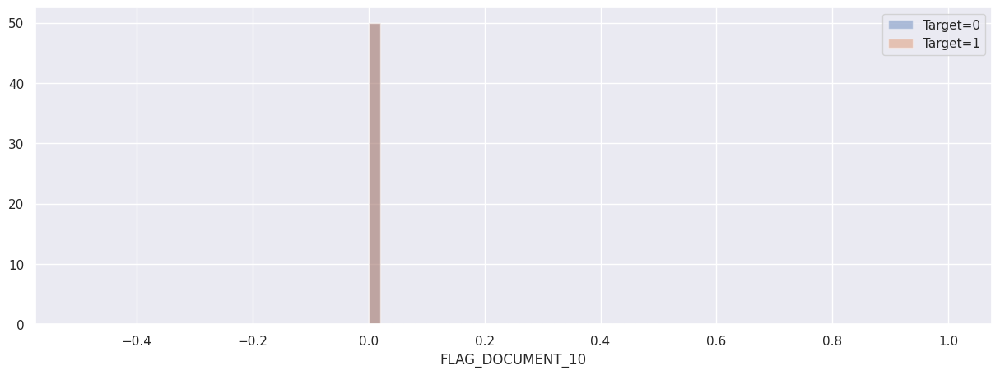

Plot of FLAG_DOCUMENT_11


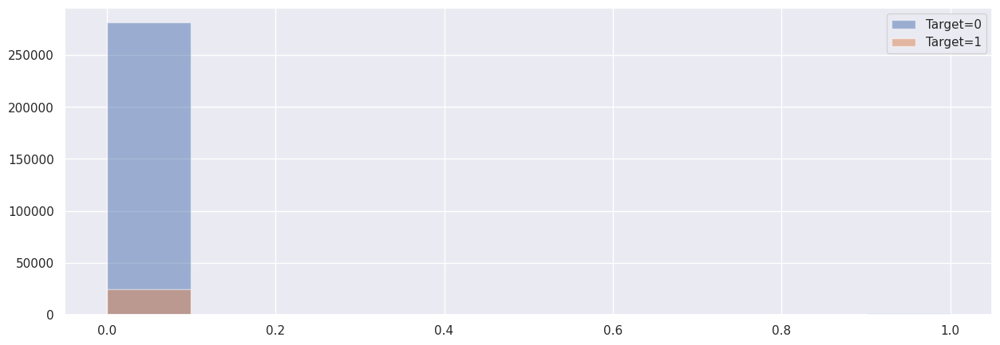

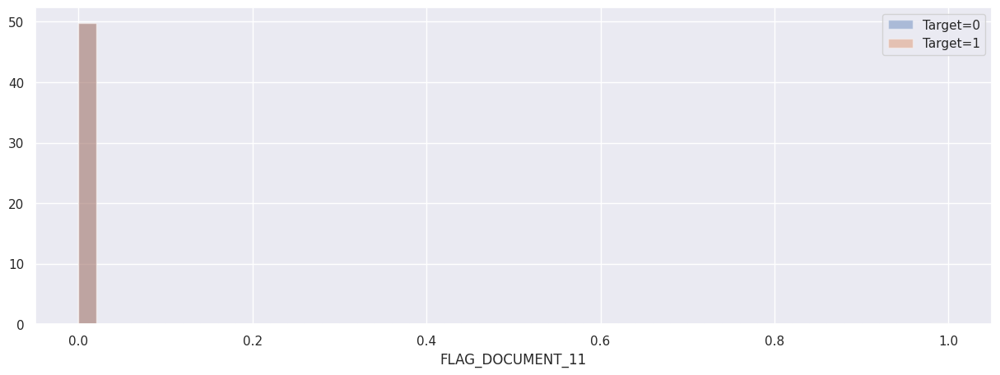

Plot of FLAG_DOCUMENT_12


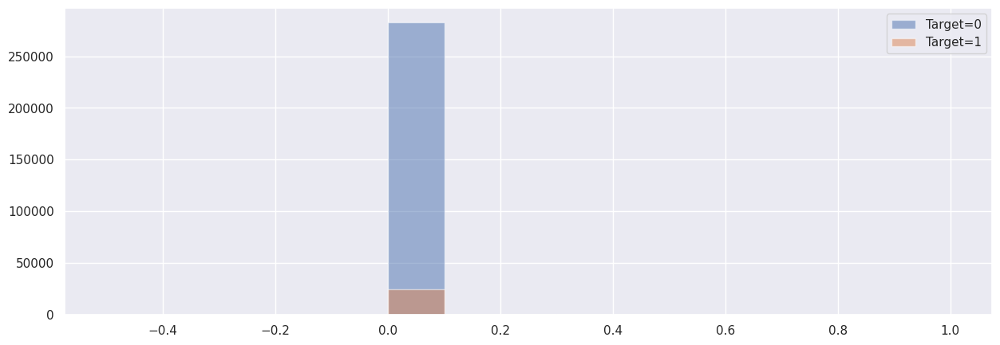

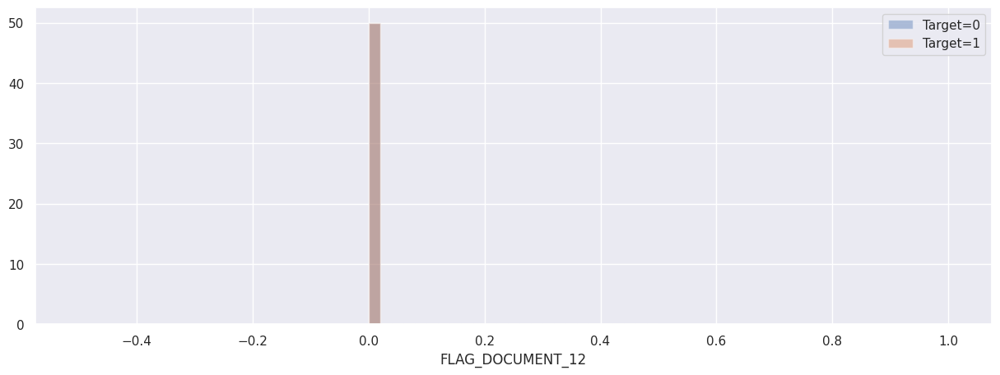

Plot of FLAG_DOCUMENT_13


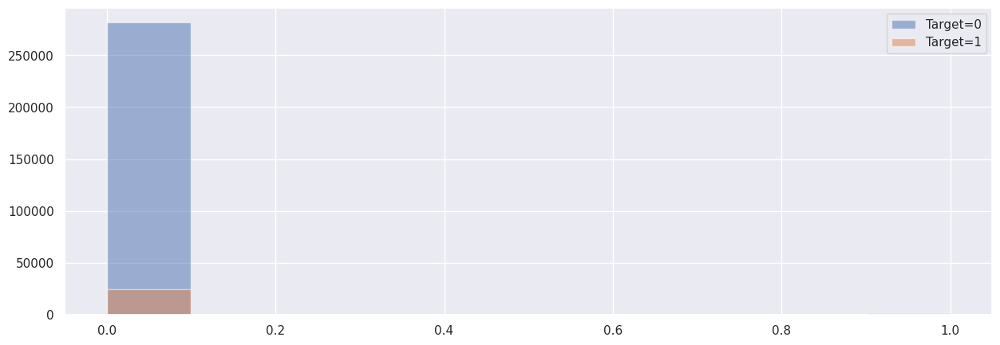

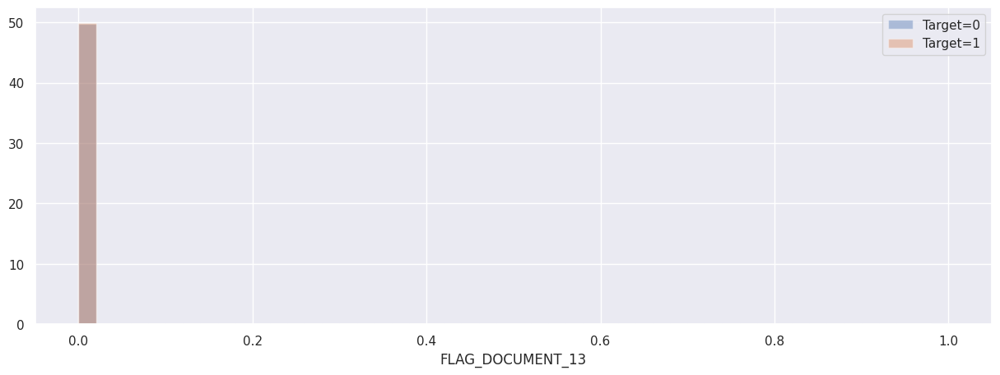

Plot of FLAG_DOCUMENT_14


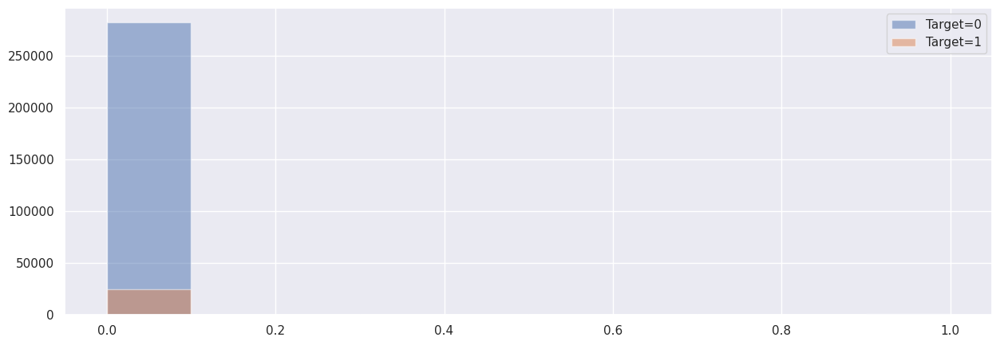

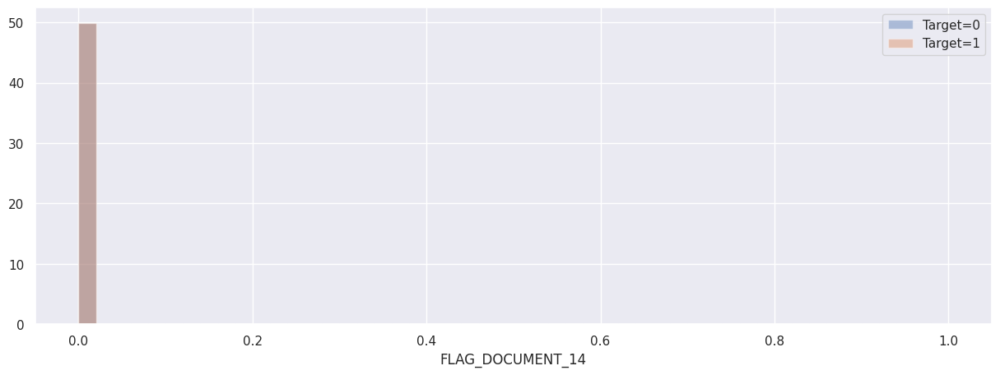

Plot of FLAG_DOCUMENT_15


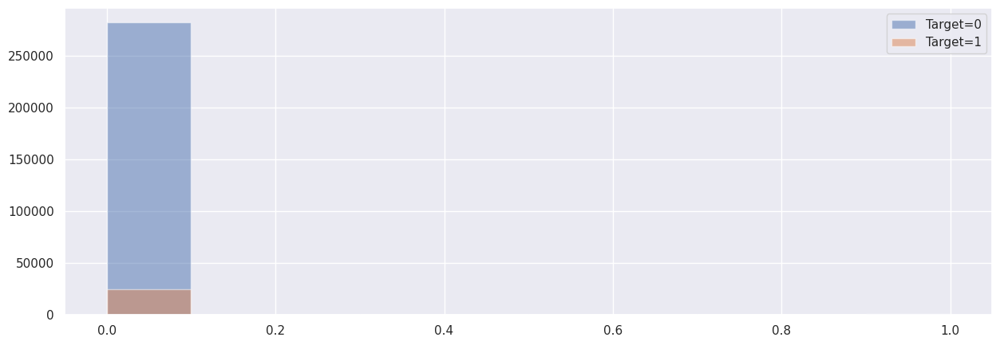

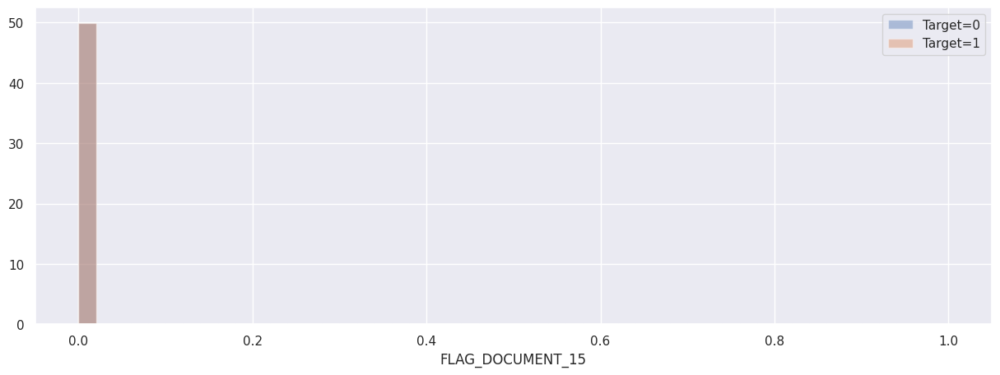

Plot of FLAG_DOCUMENT_16


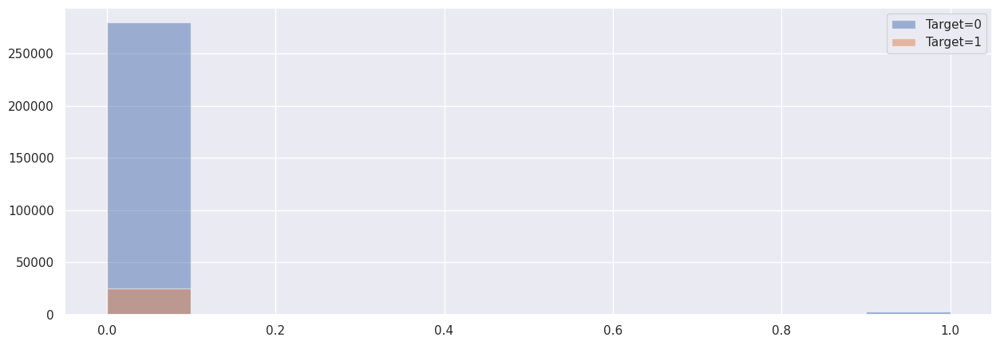

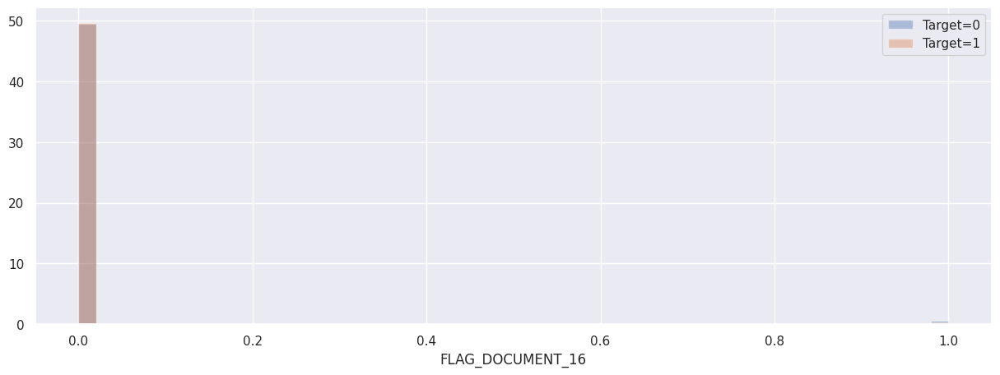

Plot of FLAG_DOCUMENT_17


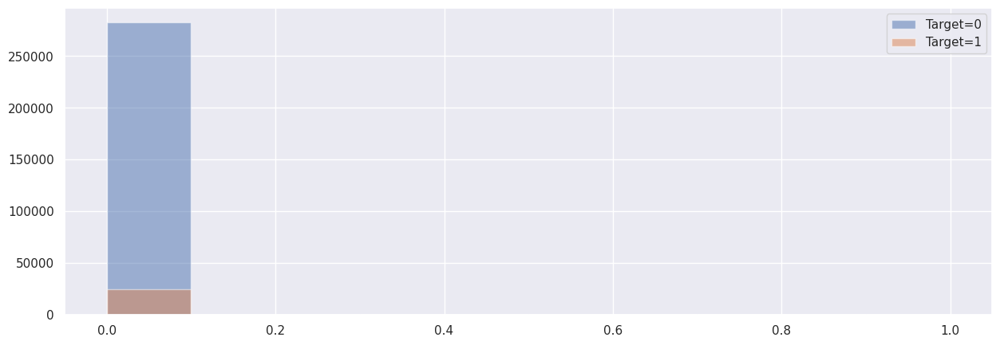

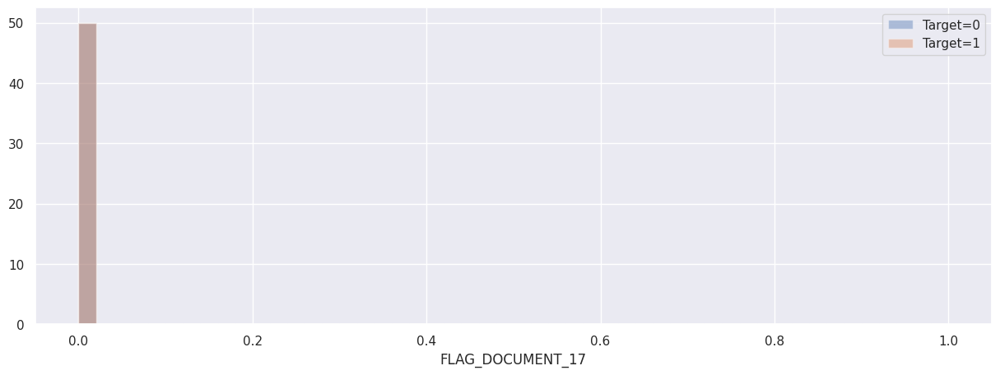

Plot of FLAG_DOCUMENT_18


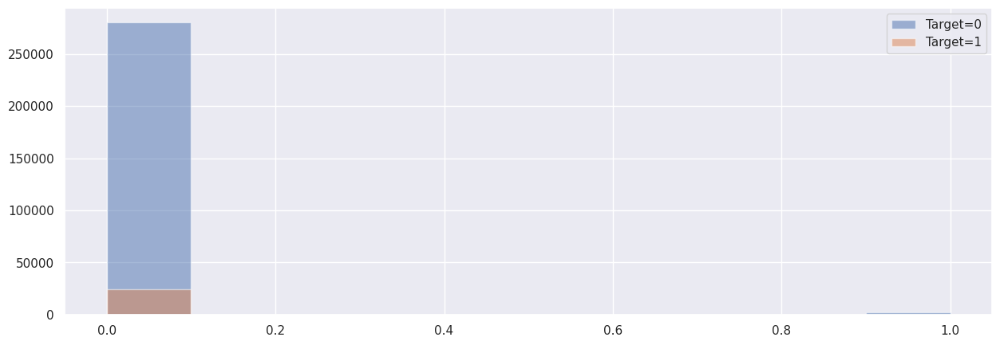

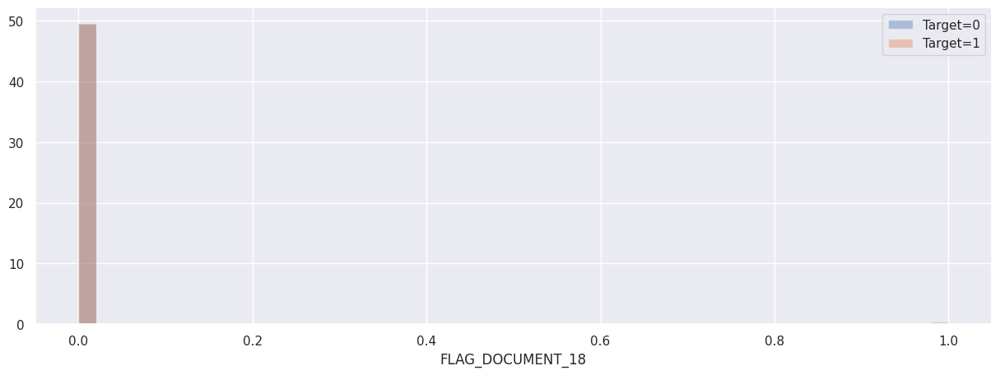

Plot of FLAG_DOCUMENT_19


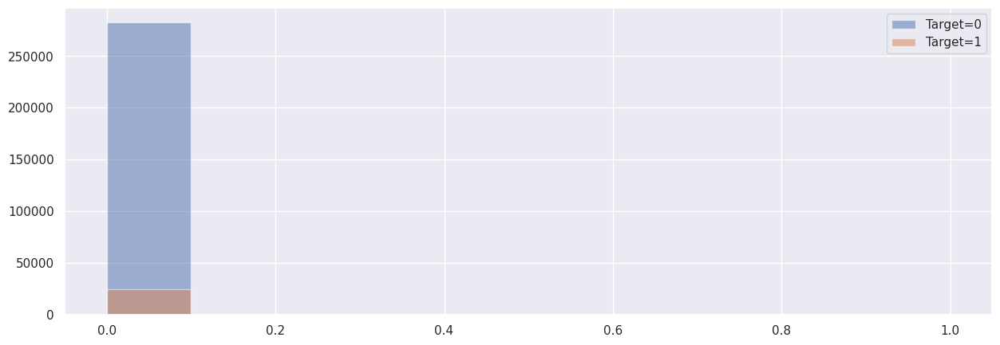

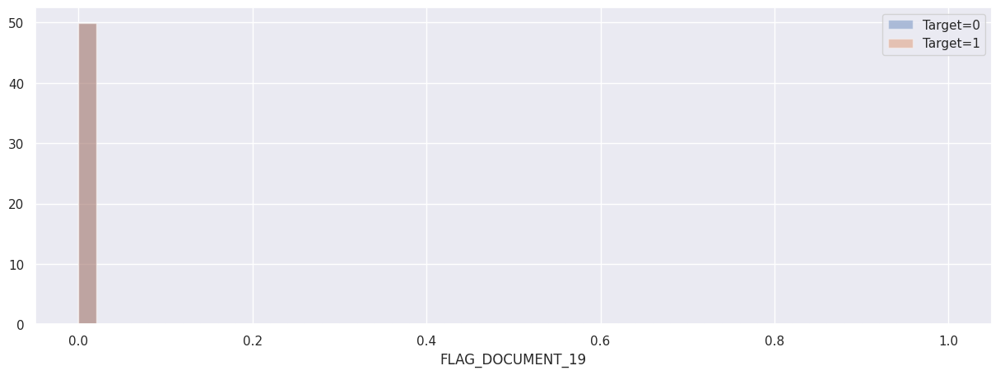

Plot of FLAG_DOCUMENT_20


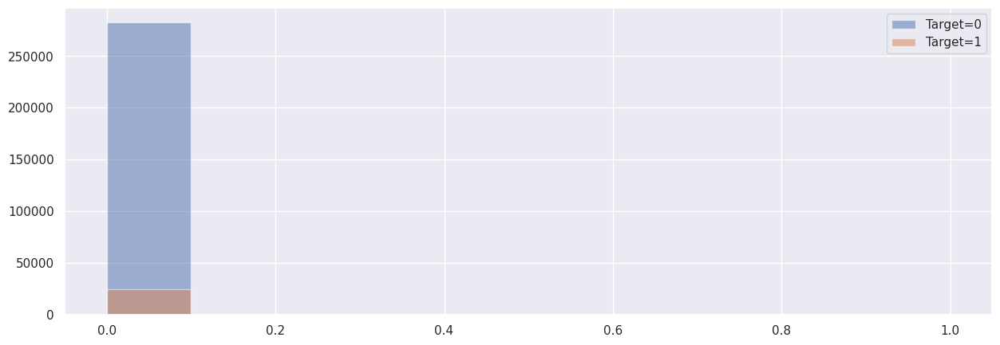

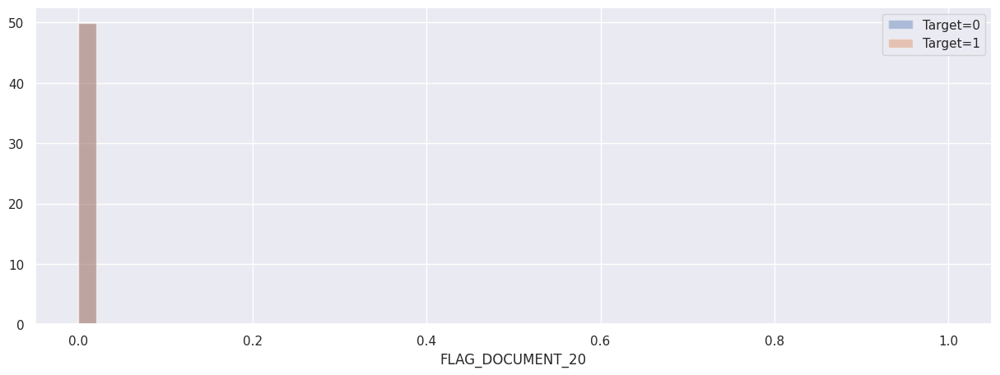

Plot of FLAG_DOCUMENT_21


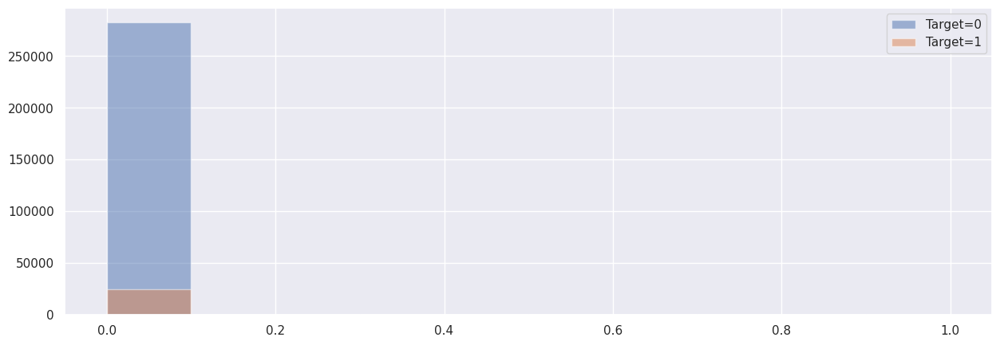

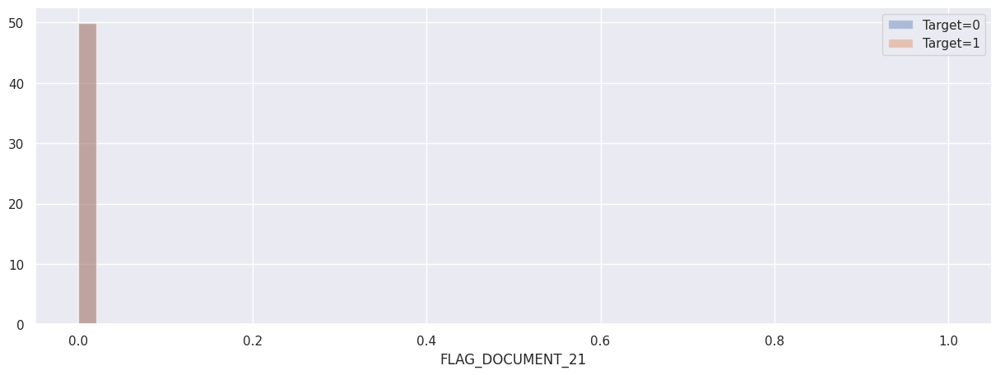

Plot of AMT_REQ_CREDIT_BUREAU_HOUR


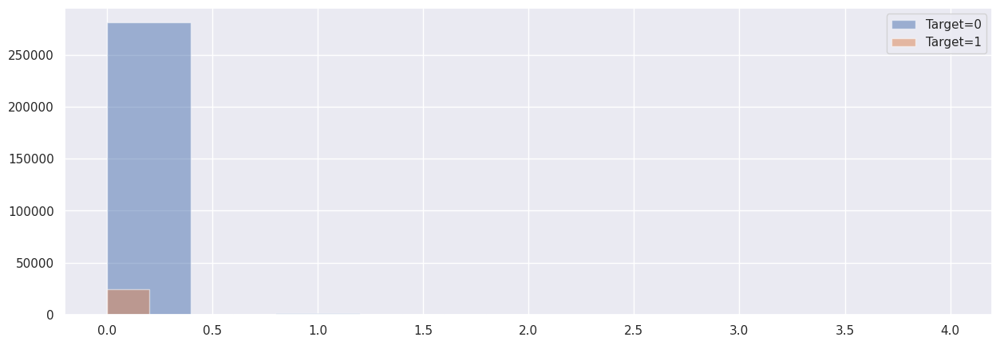

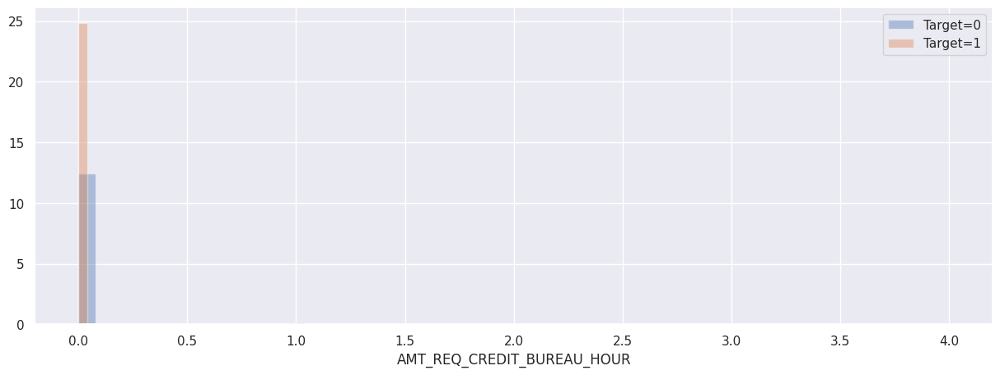

Plot of AMT_REQ_CREDIT_BUREAU_DAY


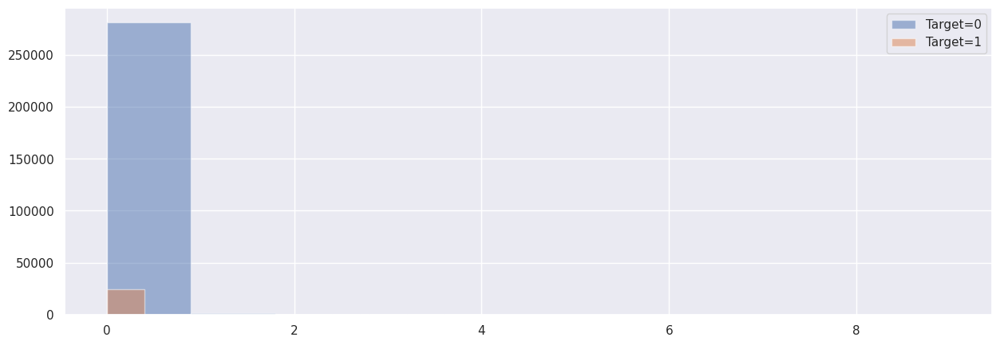

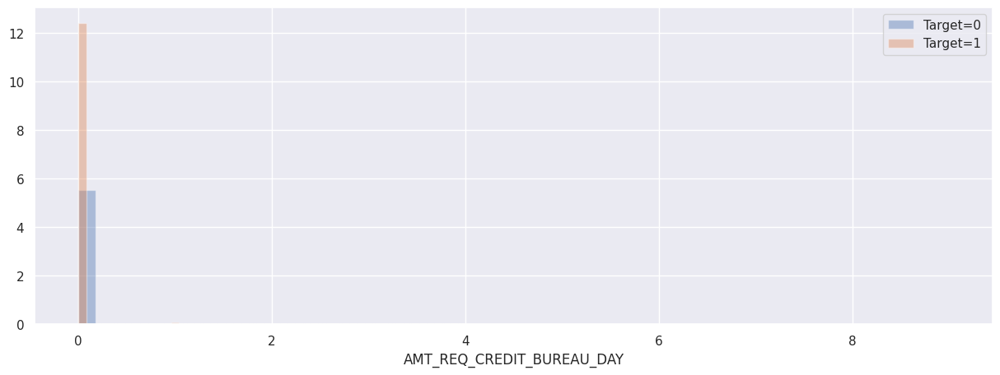

Plot of AMT_REQ_CREDIT_BUREAU_WEEK


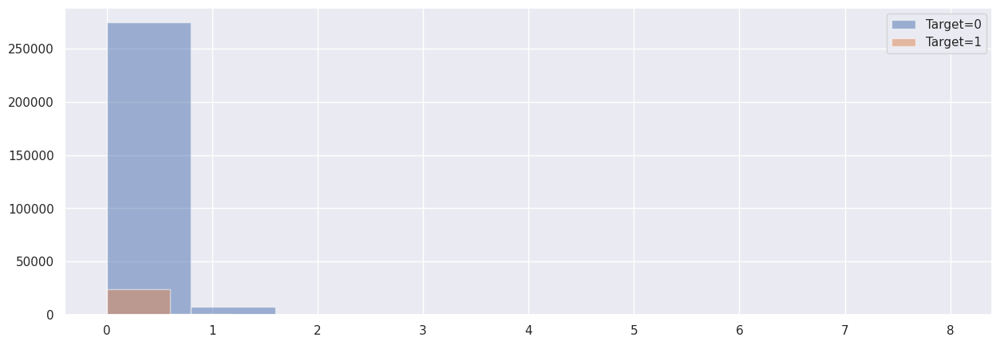

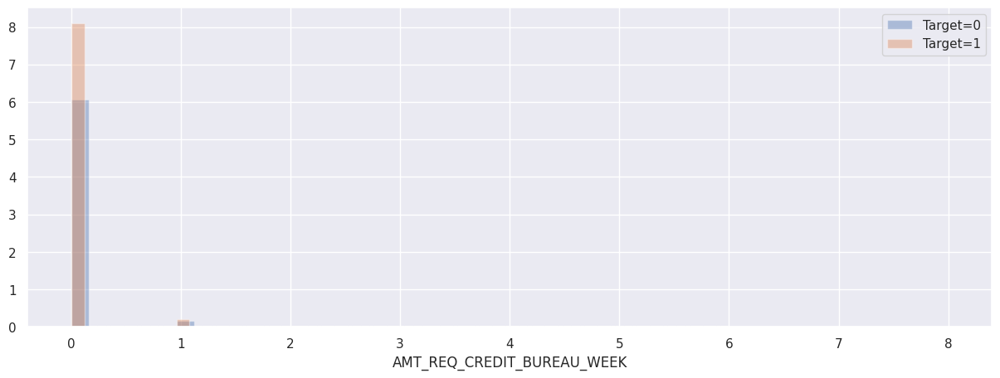

Plot of AMT_REQ_CREDIT_BUREAU_MON


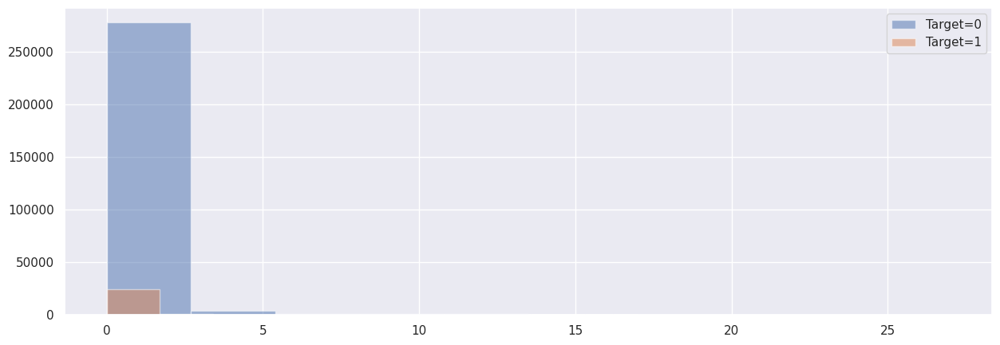

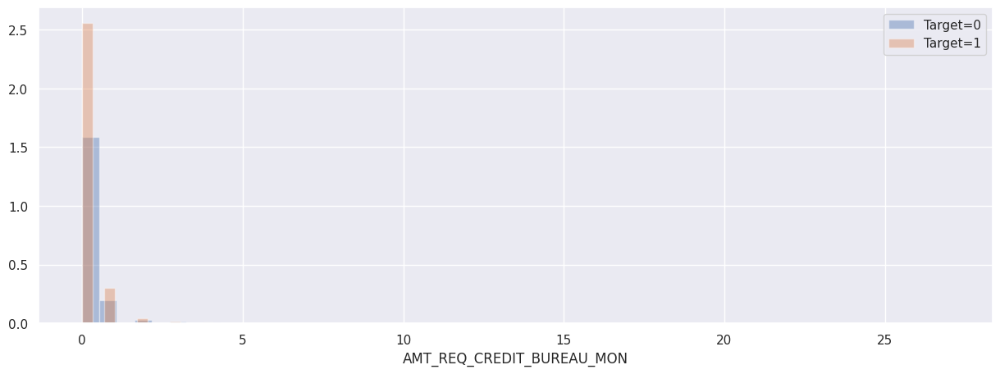

Plot of AMT_REQ_CREDIT_BUREAU_QRT


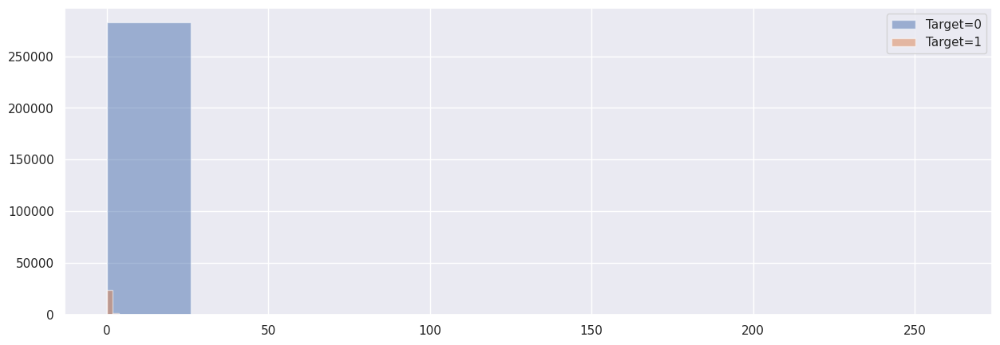

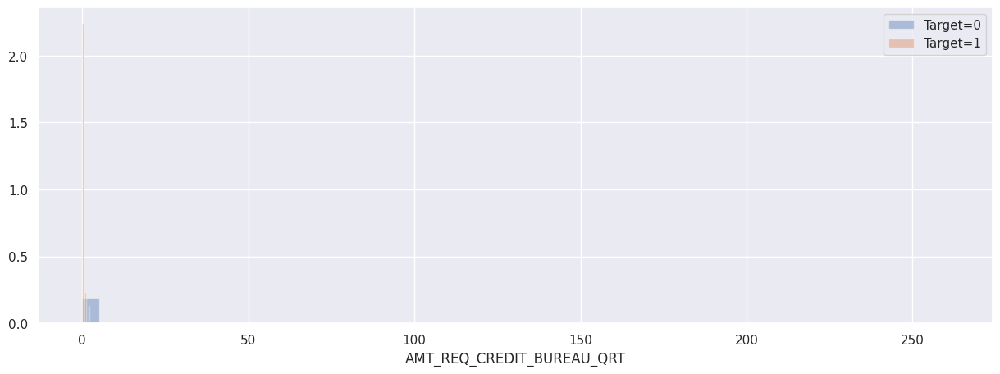

Plot of AMT_REQ_CREDIT_BUREAU_YEAR


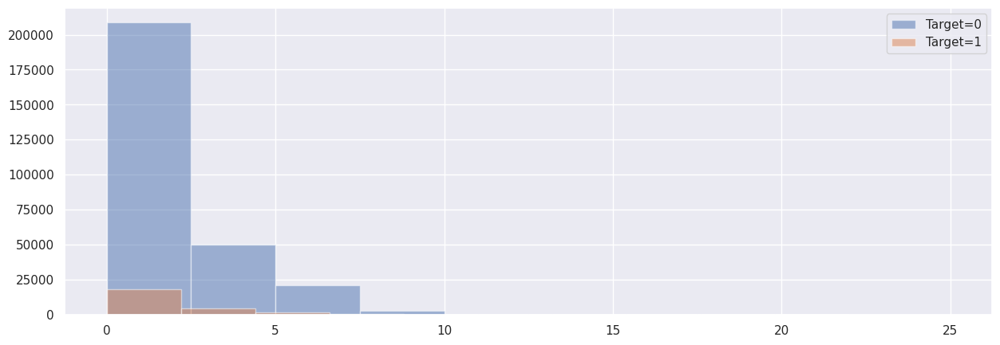

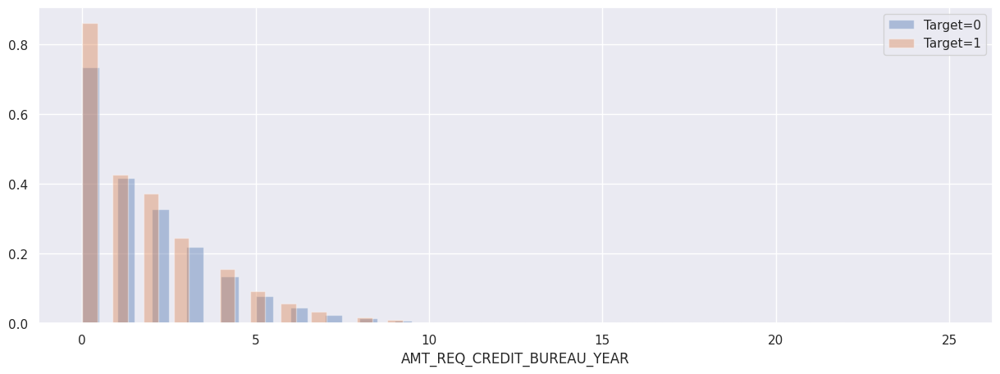

In [168]:
# Iterate over each categorical column to generate plots
for column in new_data_categorical:
    # Construct and print the title for current plot
    title = "Plot of " + column
    print(title)

    # Plot histograms for the distribution of the variable for both TARGET categories
    plt.hist(new_data_0[column], alpha=0.5, label='Target=0')  # Histogram for category '0'
    plt.hist(new_data_1[column], alpha=0.5, label='Target=1')  # Histogram for category '1'
    plt.legend()  # Add a legend to distinguish between categories
    plt.show()  # Display the histogram

    # Plot distribution plots for the non-null values in both TARGET categories
    sns.distplot(new_data_0[column].dropna(), label='Target=0', kde=False, norm_hist=True)  # Distribution plot for '0'
    sns.distplot(new_data_1[column].dropna(), label='Target=1', kde=False, norm_hist=True)  # Distribution plot for '1'
    plt.legend()  # Add a legend to distinguish between categories
    plt.show()  # Display the distribution plot

    # Placeholder for a box plot function that might be defined elsewhere
    # box_plot(new_data_0, new_data_1, column)

    # Print a separator for readability between plots
    print("="*200)

**Overall Conclusion and Key Observations:**
From the analysis of the histograms based on various indicators like loan amounts, income levels, and external risk factors for both Target 0 (individuals with no repayment difficulties) and Target 1 (individuals with repayment difficulties), several insights emerge:


---


**1. Loan Amount Distribution:**
- Smaller Loans (Up to 0.5 million): Individuals with repayment difficulties (Target 1) are more common in this loan size range. It indicates that people taking smaller loans may face more financial stress or difficulty in repayments.
- Larger Loans (Above 1 million): Individuals without repayment difficulties (Target 0) dominate this loan size range. This suggests that borrowers with higher loans generally have better financial stability or repayment capabilities, possibly due to better income levels or financial management.


---


**2. Income Levels:**
- Lower Income and Repayment Difficulties: People in Target 1 (with repayment difficulties) have significantly lower incomes. Higher repayment difficulties are concentrated in the lower income brackets, making income level a strong determinant of repayment issues.
- Higher Income and Stability: Borrowers with higher income tend to belong to Target 0 (no repayment difficulties). This implies that higher income helps mitigate repayment risks and makes it easier to manage loans, even with larger loan sizes.


---


**3. External Risk Factors (EXT_SOURCE):**
- Lower Scores and Repayment Issues: People with lower external credit scores (below 0.5) are more frequently seen in the Target 1 group. This indicates that lower credit scores are strongly correlated with higher repayment difficulties.
- Higher Scores and Stability: Individuals with higher external scores (above 0.5) are predominantly in the Target 0 group, showing that higher credit scores are associated with better repayment behavior and financial stability.
---
**4. Loan-to-Income Ratios:**
- Smaller Loan Ratios with Repayment Issues: There is a clear trend where smaller loan ratios (loan amount compared to income) are associated with Target 1. Even though these individuals have smaller loans, the lower income levels result in repayment difficulties.
- Higher Loan Ratios with Financial Stability: Target 0 individuals dominate higher loan-to-income ratios, indicating that borrowers with larger loans relative to their income have better financial management and repayment behavior.
---
**5. Family Size and Repayment Behavior:**
- Larger Family Sizes and Repayment Difficulties: Individuals with more family members (3 or more) are more likely to face repayment difficulties, suggesting that larger family sizes may increase financial burden and make it harder to meet loan obligations.
- Smaller Family Sizes and Stability: Target 0 individuals generally have smaller families (2 members), which might indicate better financial management due to fewer dependents.
---
**6. Other Negative Financial Indicators:**
- Indicators related to negative financial balances or debts show that individuals with more negative balances or financial instability are more likely to fall into Target 1 (repayment difficulties).
- In contrast, Target 0 individuals tend to have better balances and fewer extreme negative financial indicators, suggesting a stronger financial position overall.
---
**Conclusion:**

**Repayment difficulties (Target 1) are more likely to occur among individuals with:**

- Lower income levels.
- Smaller loans, likely taken by individuals already in financial stress.
- Larger family sizes, indicating higher financial responsibility.
- Lower external credit scores, which serve as a strong predictor of financial instability.
- More negative financial balances, indicating poor financial management or existing debt burdens.

**No repayment difficulties (Target 0) are more common among individuals who:**

- Take larger loans and are financially stable.
- Have higher incomes, allowing them to manage repayments better.
- Maintain higher external credit scores, indicating good credit behavior.
- Have smaller families, resulting in fewer financial responsibilities.

This analysis highlights the importance of income level, loan size, and credit scores as key factors in determining repayment behavior. Borrowers with lower income and smaller loans, particularly those with larger families and negative financial balances, are at higher risk for repayment difficulties, making them important targets for risk assessment and financial support programs.

## Reading previous application

In [169]:
# Read the data from the file "previous_application.csv" into a DataFrame
previous_application = pd.read_csv("/content/drive/MyDrive/Project - CreditRisk(EDA)/previous_application.csv")
previous_application.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [170]:
# Shape of previous_application
previous_application.shape

(1670214, 37)

### There are duplicate 'SK_ID_CURR' as a person could have taken loan multiple times

In [171]:
#Number of unique id in previous application
previous_application.SK_ID_PREV.value_counts()

,count
SK_ID_PREV,
2030495,1
1035848,1
1526498,1
2148893,1
2437429,1
...,...
2811649,1
1221292,1
2780117,1


In [172]:
# Number of unique id in previous application
previous_application.SK_ID_CURR.value_counts()

,count
SK_ID_CURR,
187868,77
265681,73
173680,72
242412,68
206783,67
...,...
135285,1
311960,1
427136,1


From the information provided, the shape of the previous application dataset is (1670214, 37), and the count of unique SK_ID_PREV entries matches this, standing at 1670214. However, the count of unique SK_ID_CURR entries is significantly lower, at 338857. This discrepancy indicates that the SK_ID_PREV values contain duplicates, suggesting that multiple entries pertain to the same current application ID (SK_ID_CURR).

# Task - Merging Datasets

### Merging DataFrames: Train and Previous Application Based on SK_ID_CURR
After merging both dataframes using the SK_ID_CURR column as the key, the resulting dataframe will also contain duplicate SK_ID_CURR values.
This duplication is not an issue, as our objective is to explore patterns, including cases where a lender has previously taken out a loan more than once.
Retaining these duplicates allows us to analyze the data comprehensively and identify any recurring trends or behaviors among borrowers with multiple loan histories.

In [194]:
# Merging "new_data" DataFrame with "previous_application" DataFrame based on "SK_ID_CURR"
# Using "inner" join to retain only common rows between the two DataFrames
previous_train = new_data.merge(previous_application, on='SK_ID_CURR', how='inner')
previous_train.head()

#previous_train = new_data.merge(previous_application, on='SK_ID_CURR', how='inner')
#previous_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,Connectivity,4.0,middle,POS mobile without interest,365243.0,-784.0,-694.0,-724.0,-714.0,0.0


In [195]:
# Getting the names of all the columns in the DataFrame "previous_application"
previous_application.columns.values
previous_train.shape
previous_train['NAME_CONTRACT_STATUS']

,NAME_CONTRACT_STATUS
0,Approved
1,Approved
2,Approved
3,Approved
4,Approved
...,...
1140107,Approved
1140108,Refused
1140109,Refused
1140110,Approved


### The merged dataframe also has multiple values for SK_ID_CURR

In [196]:
# Count the occurences of each unique value in the "SK_ID_CURR" column of the DataFrame "previous_application" and display the top values
previous_application.SK_ID_CURR.value_counts().head()

,count
SK_ID_CURR,
187868,77
265681,73
173680,72
242412,68
206783,67


### Segregating the dataset on Target = 0 and Target = 1

In [197]:
new_data['TARGET'] = new_data['TARGET'].astype(int)

In [198]:
# Creating a subset of the DataFrame 'new_data' containing records where the 'TARGET' column is equal to '0'
train_0 = new_data[new_data['TARGET'] == 0]

# Create a subset of the DataFrame 'new_data' containing records where the 'TARGET' column is equal to '1'
train_1 = new_data[new_data['TARGET'] == 1]

In [199]:
# Creating a subset of the DataFrame 'previous_train' containing records where the 'TARGET' column is equal to '0'
ptrain_0 = previous_train[previous_train['TARGET'] == 0]

# Creating a subset of the DataFrame 'previous_train' containing records where the 'TARGET' column is equal to '1'
ptrain_1 = previous_train[previous_train['TARGET'] == 1]

In [200]:
#check the columns in 'ptrain_1'
ptrain_1.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT_x', 'AMT_ANNUITY_x',
       'AMT_GOODS_PRICE_x', 'NAME_TYPE_SUITE_x', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'FLAG_MOBIL',
       'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START_x', 'HOUR_APPR_PROCESS_START_x',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'YEARS_BEGINEXPL

In [201]:
#Check if the column 'NAME_CONTRACT_STATUS' is in ptrain_1
'NAME_CONTRACT_STATUS' in ptrain_1.columns

True

In [202]:
print(ptrain_0['NAME_CONTRACT_STATUS'].dtype)
print(ptrain_1['NAME_CONTRACT_STATUS'].dtype)


object
object


In [205]:
ptrain_1['NAME_CONTRACT_STATUS'] = ptrain_1['NAME_CONTRACT_STATUS'].astype(str)
ptrain_0['NAME_CONTRACT_STATUS'] = ptrain_0['NAME_CONTRACT_STATUS'].astype(str)

In [206]:
ptrain_1['NAME_CONTRACT_STATUS']

,NAME_CONTRACT_STATUS
0,Approved
148,Approved
149,Approved
150,Refused
151,Approved
...,...
1139995,Approved
1140015,Approved
1140016,Approved
1140102,Approved


## Plotting data

In [207]:
(train_1["NAME_EDUCATION_TYPE"].value_counts()) / len(train_1)

,count
NAME_EDUCATION_TYPE,
Secondary / secondary special,0.778567
Higher education,0.168033
Incomplete higher,0.038837
Lower secondary,0.014426
Academic degree,0.000137


In [204]:
train_1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,amt_annuity_categorical
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,medium
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,...,0,0,0,0.0,0.0,0.0,0.0,2.0,2.0,medium
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,...,0,0,0,0.0,0.0,0.0,2.0,0.0,4.0,medium
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,low
94,100112,1,Cash loans,M,Y,Y,0,315000.0,953460.0,64107.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0,high


In [208]:
def plotting(column, hue):
    # Assign column and hue parameters to local variables
    col = column
    hue = hue

    # Create a figure for the plots with a specific size
    fig = plt.figure(figsize=(13,10))

    # Subplot 1: Pie chart showing the distribution of values in the column
    ax1 = plt.subplot(221)
    new_data[col].value_counts().plot.pie(autopct="%1.0f%%", ax=ax1)
    plt.title('Distribution of values for the column: '+ column)

    # Subplot 2: Bar plot displaying the distribution of values by target categories
    ax2 = plt.subplot(222)
    df = pd.DataFrame()
    df['0'] = ((train_0[col].value_counts()) / len(train_0))
    df['1'] = ((train_1[col].value_counts()) / len(train_1))
    df.plot.bar(ax=ax2)
    plt.title('Distribution of values by target category')

    # Subplot 3: Count plot showing the distribution of values for Target=0
    ax3 = plt.subplot(223)
    sns.countplot(x=col, hue=hue, data=ptrain_0, ax=ax3)
    plt.xticks(rotation=90)
    plt.title('Distribution of values for Target=0')

    # Subplot 4: Count plot showing the distribution of values for Target=1
    ax4 = plt.subplot(224)
    sns.countplot(x=col, hue=hue, data=ptrain_1, ax=ax4)
    plt.xticks(rotation=90)
    plt.title('Distribution of values for Target=1')

    # Adjust layout to prevent overlap
    fig.tight_layout()

    # Display the plots
    plt.show()



# Task 9 - Bivariate Analysis

Here, plotting only for 3 columns, as plotting in loop for all columns was pretty heavy for this size of dataset.

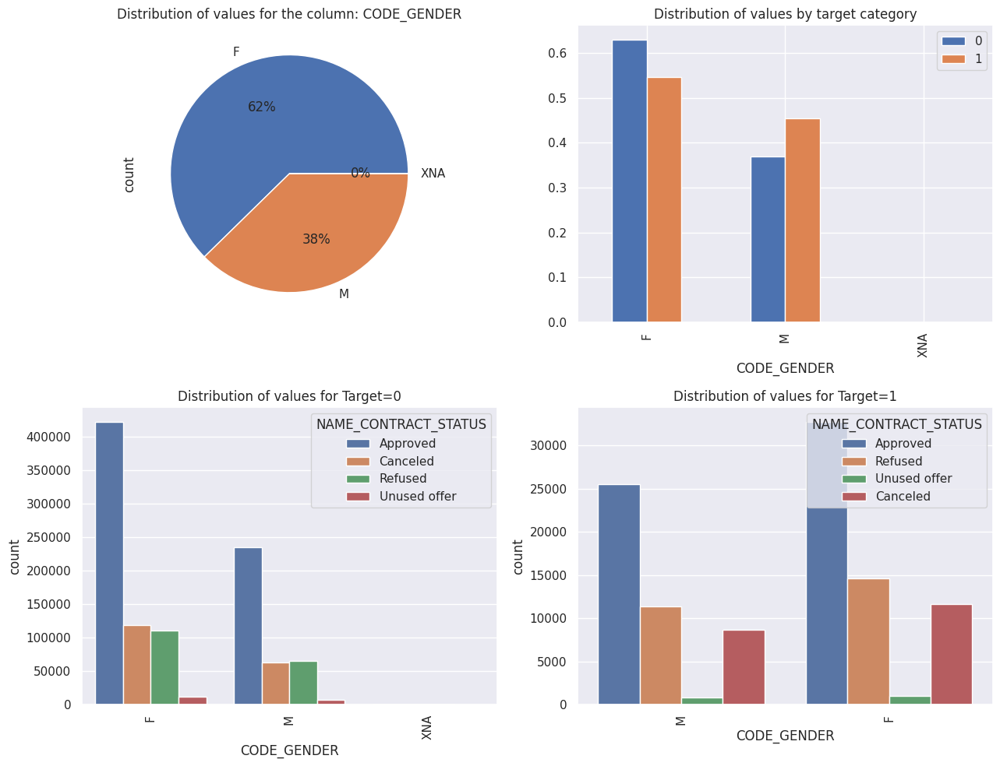

In [223]:
plotting('CODE_GENDER','NAME_CONTRACT_STATUS')

Here are some insights based on the visualizations:
**1.Gender Distribution (Pie Chart):**

- The majority of the applicants are female (62%), with male applicants accounting for 38%.
- There is a very small percentage (close to 0%) labeled as "XNA," which might be a data error or represent a very small category that needs further investigation.

**2. Gender Distribution by Target Category (Bar Chart):**

- For Target 0 (No repayment difficulties):
More females have no repayment difficulties compared to males, and the proportion of females in this category is higher.
- For Target 1 (Repayment difficulties):
Males have a slightly higher proportion of repayment difficulties than females.

This suggests that gender might have an influence on the likelihood of repayment difficulties, with males showing a higher propensity toward default.

**3. Contract Status for Target 0 (No repayment difficulties):**

- Both males and females have a significantly higher number of approved contracts compared to other contract statuses.
- Females have a higher count of approved loans compared to males, but both genders have similar proportions for refused and canceled contracts.
- The "Unused offer" category has the lowest counts for both genders.

**4. Contract Status for Target 1 (Repayment difficulties):**

- Males with repayment difficulties still have more approved contracts compared to females.
-A higher proportion of males with repayment difficulties have their contracts refused.
- Both genders show fewer unused offers and canceled contracts compared to approved or refused contracts.

**Key Takeaways:**
- There seems to be a relationship between gender and loan repayment difficulties, with males having a higher proportion of difficulties compared to females.
- Loan approval is the dominant contract status for both males and females, regardless of their repayment difficulties, but males with difficulties are slightly more likely to have their contracts refused than females.
- The "XNA" category is almost negligible and should be further investigated, as it may represent incomplete or erroneous data.

### Plotting NAME_EDUCATION_TYPE

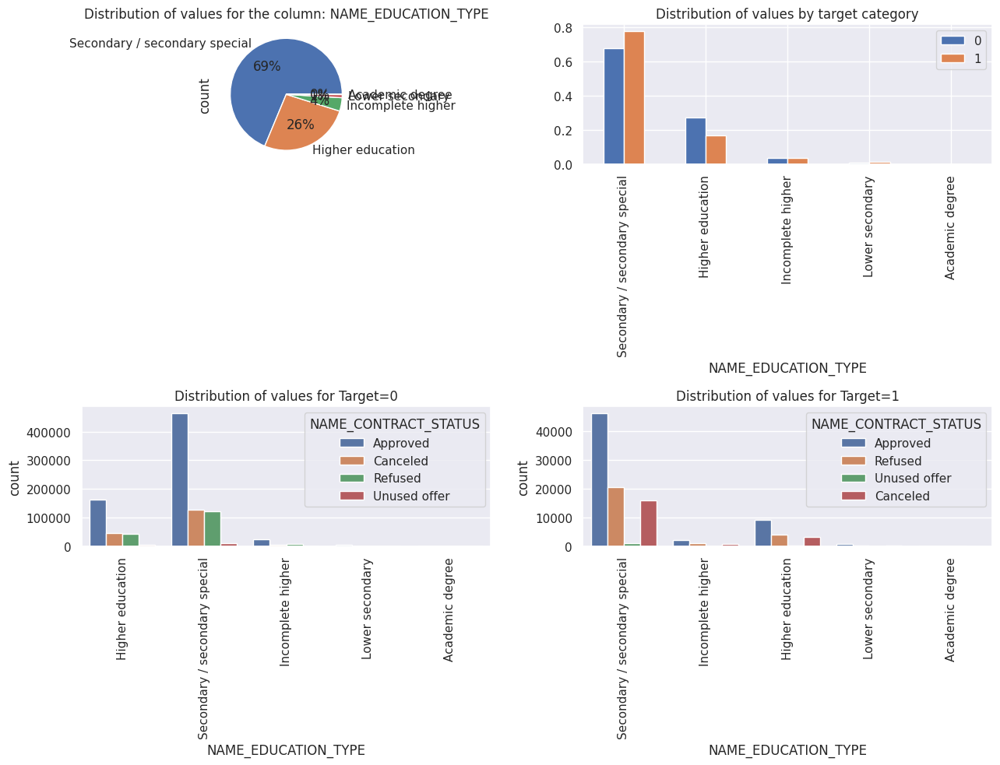

In [210]:
plotting('NAME_EDUCATION_TYPE','NAME_CONTRACT_STATUS')

**1. Education Level and Repayment Difficulties:**

- Individuals with lower education levels (Secondary/Secondary Special) make up the majority of both TARGET 0 and TARGET 1 groups. However, they are more likely to face repayment difficulties (TARGET 1) as this group appears most prominently in both repayment categories. This suggests that individuals with less education are at a higher risk of repayment difficulties.
- Higher education seems to correlate with fewer repayment difficulties, as a larger proportion of individuals with higher education fall into the TARGET 0 category (no difficulties in repayment).

**2. Contract Status for TARGET = 0 (No Repayment Difficulties):**

- Among individuals who do not have repayment difficulties (TARGET 0), a large proportion have Approved contracts, particularly in the "Secondary/Secondary Special" education group. This suggests that even with lower education, many individuals successfully secure loans and manage repayments.
- Refused and Canceled statuses also exist, but these are relatively lower in frequency compared to those with approved contracts.

**3. Contract Status for TARGET = 1 (Repayment Difficulties):**

- Individuals with repayment difficulties (TARGET 1) show a significant increase in Refused and Canceled contract statuses, especially in the "Secondary/Secondary Special" group. This highlights that people with lower education levels and repayment difficulties are more likely to experience rejection or cancellation of contracts.
- Notably, even individuals with Higher Education face significant numbers of Refused and Canceled contracts when they have repayment difficulties. This suggests that while higher education offers some protection, it does not eliminate the risk of repayment difficulties or loan refusal.

**4. Overall Trend:**

- Education level plays an important role in the likelihood of experiencing repayment difficulties. People with Secondary/Secondary Special education are disproportionately represented among those with repayment difficulties (TARGET 1), and they are more likely to face canceled or refused loans.
- Higher education seems to correlate with better loan approval rates and fewer repayment difficulties, but individuals with difficulties in repayment still face loan rejections or cancellations, even with higher qualifications.

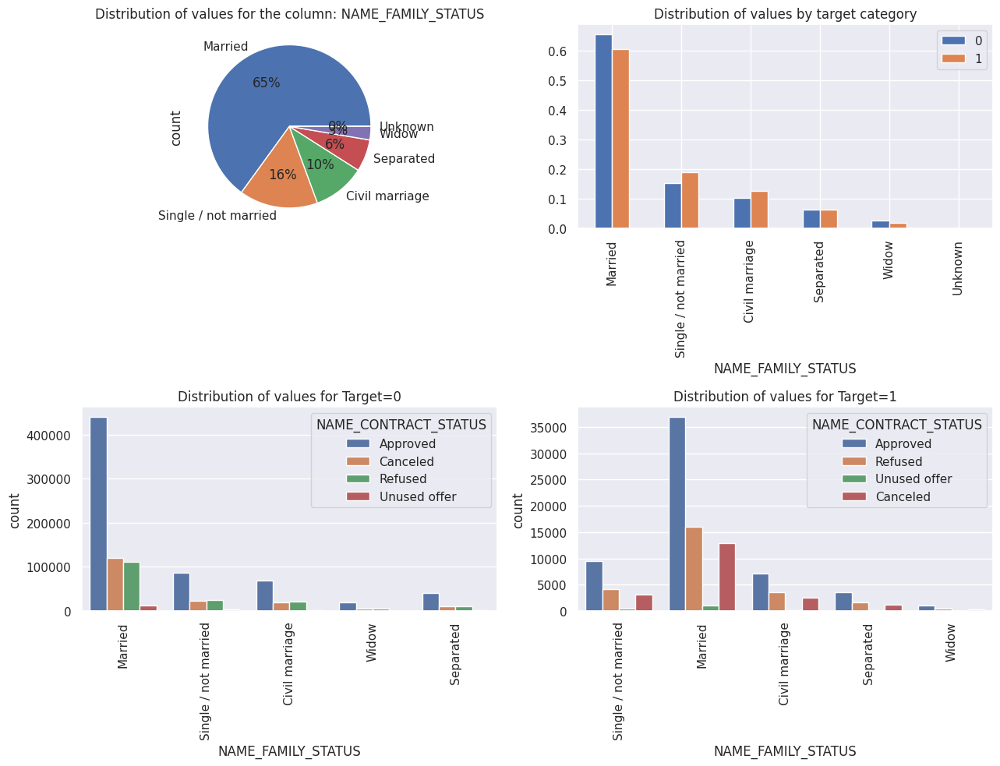

In [211]:
plotting('NAME_FAMILY_STATUS','NAME_CONTRACT_STATUS')

**Insights:**

**1. Marital Status and Repayment Difficulties:**

- Married individuals generally have the highest proportion of Approved contracts and fewer repayment difficulties. However, when in the TARGET = 1 group, they still experience notable loan refusals and cancellations.
- Single / Not Married individuals appear more likely to face repayment difficulties. They have a higher proportion of Refused and Canceled contracts, particularly in the TARGET = 1 group, suggesting they are at higher risk for loan defaults or challenges in securing loans.
- Civil Marriage status also correlates with an increased risk of repayment difficulties compared to the Married group.

**2. Contract Status and Family Situation:**

- Widows and Separated individuals show a relatively high number of Refused and Canceled contracts compared to their small population size, indicating potential vulnerability to loan difficulties.
- Single / Not Married individuals are particularly vulnerable, with more significant proportions of canceled and refused loans in the TARGET = 1 group. This suggests that single individuals, in particular, may face more barriers to financial stability and loan approval.

**3. TARGET 1 (Repayment Difficulties):**

- Across most family statuses, individuals in TARGET = 1 (those with difficulties in repayment) show a significant increase in Refused and Canceled contracts. This could indicate that people with family statuses other than "Married" face additional challenges both in securing and maintaining loans.


These insights suggest that marital status plays a significant role in determining financial stability and repayment capacity. Single and Civil Marriage individuals are more likely to face difficulties, which could influence credit assessment criteria or inform the need for additional financial support programs targeted at these groups.

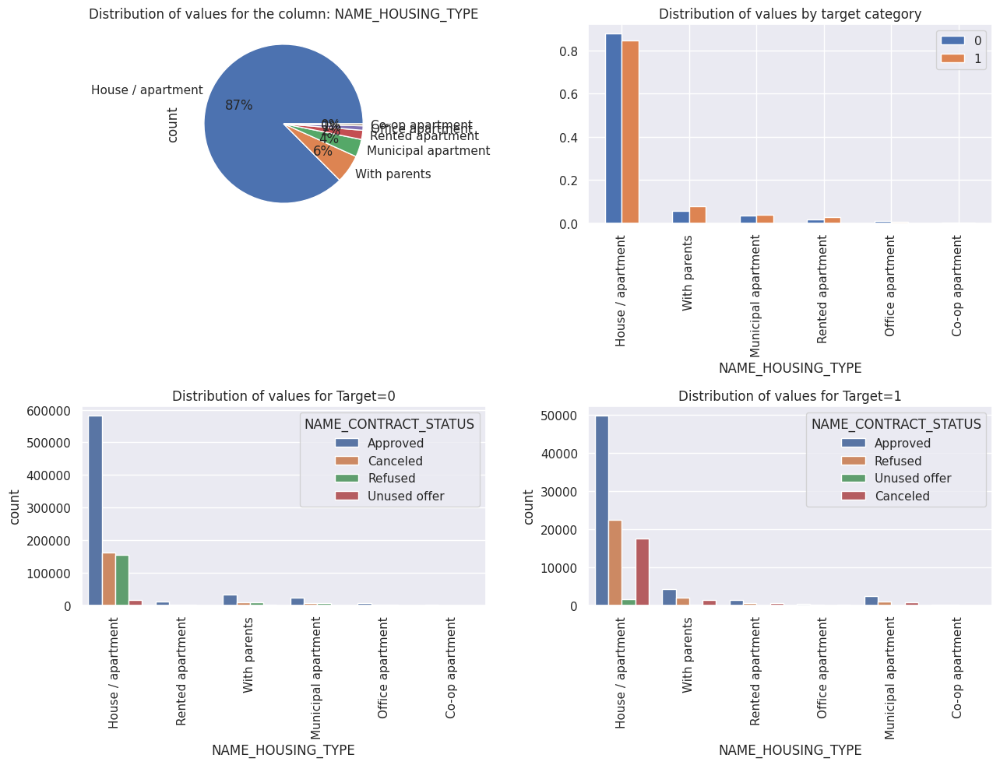

In [212]:
plotting('NAME_HOUSING_TYPE','NAME_CONTRACT_STATUS')

**Insights:**

**1. Housing Type and Financial Stability:**

- Individuals living in House/Apartment are generally more financially stable, with most loans being Approved. However, even in this group, repayment difficulties lead to a notable increase in Refused and Canceled contracts when looking at the TARGET = 1 group.
- Living With Parents or in Municipal Apartments appears to correlate with a higher likelihood of repayment difficulties, as these individuals are more likely to experience Refused or Canceled contracts, especially when compared to those in House/Apartment.

**2. Risk of Repayment Difficulties:**

- Living with Parents or in Municipal Housing seems to be an indicator of financial instability, with higher rates of loan rejection and cancellation among those facing repayment difficulties (TARGET = 1). These groups may face additional financial stress or have less access to resources, which increases their risk of loan defaults or denials.
- Individuals in Rented Apartments also show a higher tendency toward repayment difficulties, though they are a smaller portion of the overall population.

**3. Repayment Challenges Across Housing Types:**

- Across all housing types, individuals facing repayment difficulties (TARGET = 1) have higher proportions of Refused and Canceled contracts, especially those not living in House/Apartment. This suggests that the housing situation might be linked to financial vulnerability, and individuals in less stable housing environments (e.g., living with parents, municipal housing) are more likely to face difficulties repaying loans.

**Recommendations:**

- Loan providers might consider housing type as a potential risk factor when assessing loan applications. Individuals living with parents or in municipal housing may need additional financial support or tailored loan products.
- Housing type could be an important consideration for credit risk assessments, as it may reflect underlying financial stability or access to resources.

### Plotting: ORGANIZATION_TYPE

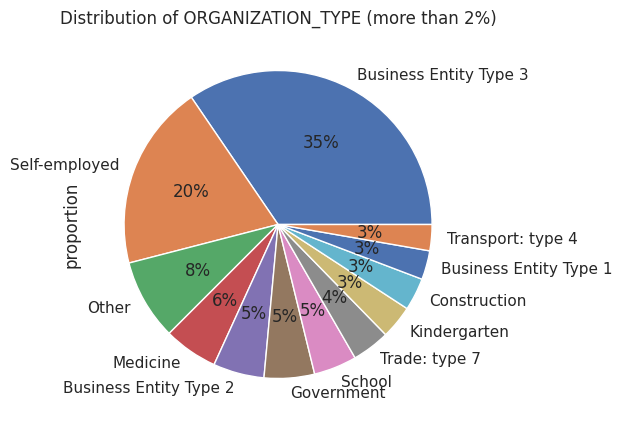

In [214]:
# Plotting a pie chart to visualize the distribution of values in the 'ORGANIZATION_TYPE' column

col = 'ORGANIZATION_TYPE'

value_counts = new_data[col].value_counts(normalize=True) * 100  # Calculate percentage of each value count

# Filter out value counts that are more than 2 percent
value_counts_filtered = value_counts[value_counts > 2]

# Plot pie chart only if there are values with more than 2 percent count
if not value_counts_filtered.empty:
    value_counts_filtered.plot.pie(autopct="%1.0f%%")
    plt.title(f"Distribution of {col} (more than 2%)")
    plt.show()

<Axes: xlabel='ORGANIZATION_TYPE'>

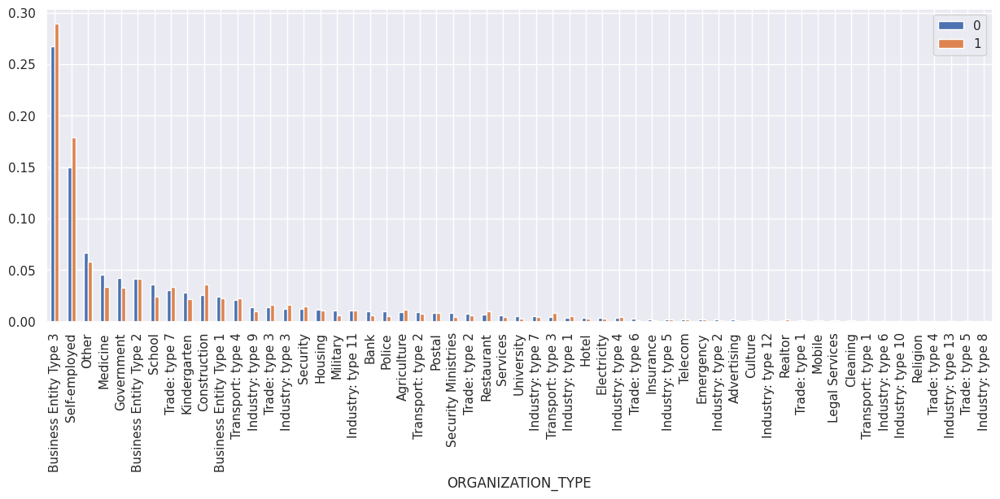

In [215]:
# Creating an empty DataFrame to hold the proportions of each category for each target group
df = pd.DataFrame()

# Calculate the proportions of each category for Target=0 and Target=1 and store them in the DataFrame
df['0'] = train_0[col].value_counts(normalize=True)  # Proportions for Target=0
df['1'] = train_1[col].value_counts(normalize=True)  # Proportions for Target=1

# Set the figure size for the bar plot
sns.set(rc={'figure.figsize':(15,5)})

# Plot a bar plot showing the proportions of each category for both Target=0 and Target=1
df.plot.bar()

**1. Dominant Organization Types:**

- Business Entity Type 3 has the largest proportion in both TARGET = 0 (no repayment difficulties) and TARGET = 1 (repayment difficulties). This indicates that people working in this organization type are very common in the dataset.
- XNA (unknown or unclassified organization) also shows significant representation, especially in TARGET = 1, which suggests that individuals in unknown or unclassified organizations might be more prone to repayment difficulties.
- Self-employed individuals show a relatively balanced proportion between TARGET = 0 and TARGET = 1, though those in TARGET = 1 seem slightly more common, indicating a slightly higher risk of repayment difficulties for self-employed individuals.

**2. Other Notable Organization Types:**

- Government, Medicine, and Business Entity Type 2 also show substantial representation, with individuals from these sectors having more TARGET = 0 (no repayment difficulties). This suggests that these sectors might be more stable in terms of financial behavior.
- Trade: type 7, School, Construction, and Kindergarten also show moderate representation, but the distribution between TARGET = 0 and TARGET = 1 is relatively even.

**3. Smaller Segments:**

- Organization types such as Industry: type 1, Transport, Security, Agriculture, and Military appear with lower frequencies. In these categories, there are slightly more individuals in TARGET = 1, indicating potential risks in repayment for people working in these industries.
- Some organization types, like Bank, Police, and University, have very small but noticeable differences between TARGET = 0 and TARGET = 1, possibly suggesting greater stability.

#Overall Conclusion:
The dataset analysis highlights multiple factors contributing to repayment difficulties and financial stability. Key determinants such as income, loan size, family size, external credit scores, and employment sectors strongly influence whether individuals are likely to default on loans.

##Key Findings:

**1. Loan Amount and Repayment Behavior:**

- Individuals with smaller loans (up to 0.5 million) are more prone to repayment difficulties (Target 1), suggesting that lower loan amounts, often associated with lower income borrowers, carry higher risk.
- In contrast, borrowers with larger loans (over 1 million) tend to be in the Target 0 group, indicating better financial management and repayment stability.

**2. Income Levels:**

- Lower income levels are a significant predictor of repayment difficulties, with individuals in Target 1 mostly falling into lower income brackets.
- Those with higher incomes are more likely to belong to Target 0, indicating a strong correlation between income stability and loan repayment success.

**3. External Credit Scores:**

- Lower external scores (EXT_SOURCE) are strongly associated with repayment difficulties. People in Target 1 frequently have lower scores, which correlates with a higher likelihood of default.
- Conversely, higher credit scores are a reliable indicator of financial stability, as seen in the Target 0 group.

**4. Family Size:**

- Larger family sizes correlate with repayment difficulties. Individuals with 3 or more family members are more likely to belong to Target 1, possibly due to increased financial responsibility.
- Smaller family sizes are associated with Target 0, indicating better financial flexibility and stability.

**5. Occupation and Organization Type:**

- Stable sectors such as Government, Medicine, and Business Entity Type 2 show higher representation in Target 0, indicating that these sectors provide more stable incomes and better financial management.
- Self-employed individuals and those in unknown/unclassified organizations (XNA) are more likely to face repayment challenges, especially those in Target 1.
- Occupations in construction, trade, and school show a balanced distribution between the two targets, but individuals in these sectors still face potential financial instability.

**6. Housing Type:**

- Living with parents or in municipal housing is more likely to correlate with repayment difficulties, while those in house/apartment are generally more stable.
- Housing situation can be a reflection of overall financial health, with individuals in Target 1 showing more vulnerability when living in less stable housing types.

##Recommendations:
1. Loan providers should focus on income levels, family size, and external credit scores when assessing risk. These factors are strong predictors of repayment behavior.
2. Individuals in self-employment, unclassified organizations, or living in municipal housing should receive additional attention, as they present higher risks of loan defaults.
3. Tailored financial support or products should be developed for lower-income borrowers, especially those taking smaller loans, as they are more prone to repayment difficulties.

##Final Thought:
A combination of income stability, credit scores, family size, loan size, and sector of employment provides a comprehensive framework for predicting repayment behavior. Lenders can use these factors to design more effective risk mitigation strategies and target borrowers who may require additional financial guidance or support.